In [1]:
#%install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=True, use_cache=True)
%config IPCompleter.greedy=True

import libpysal as lp

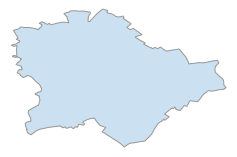

{'init': 'epsg:4326'}


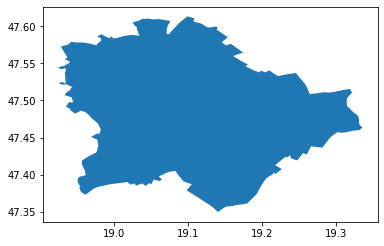

time: 378 ms


In [2]:
city = ox.gdf_from_place('Budapest, Hungary')
#city = ox.project_gdf(city)
fig, ax = ox.plot_shape(city, figsize=(4,4))
ox.save_gdf_shapefile(city)
crs = {'init': 'epsg:4326'}
city = city.to_crs(crs)
print(city.crs)
city.plot()

4127
data max index: 4126
number of NA prices: 0
average bedroom price 44.60672608931895
pointinpoly length: 4126
check contains: True
check if there are NAs: False


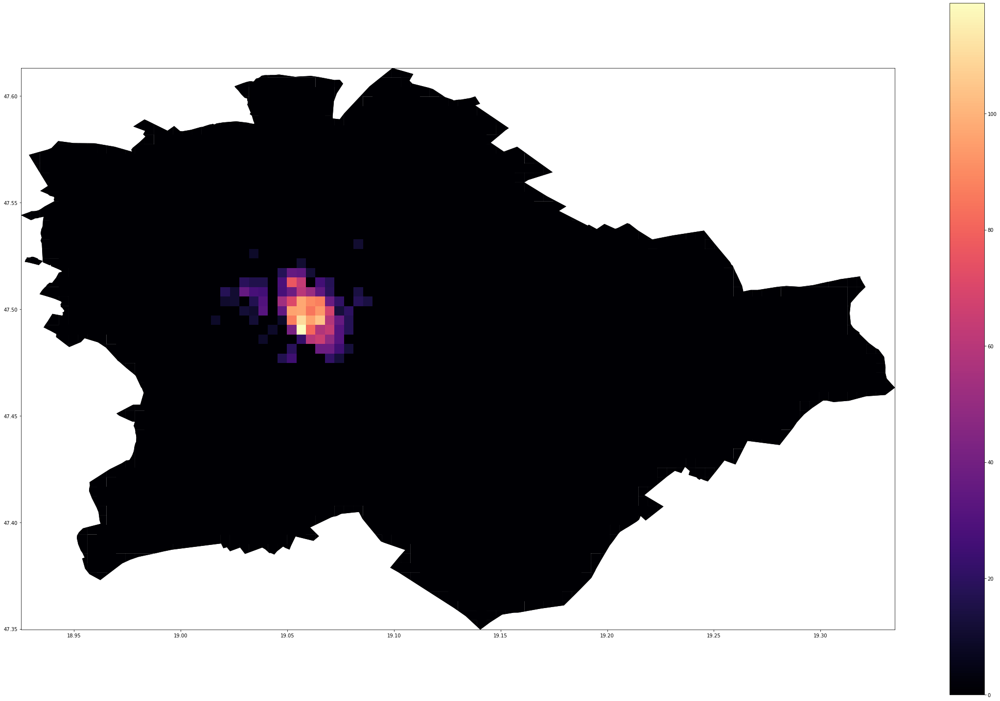

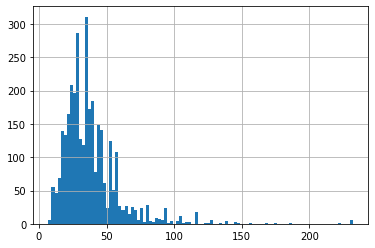

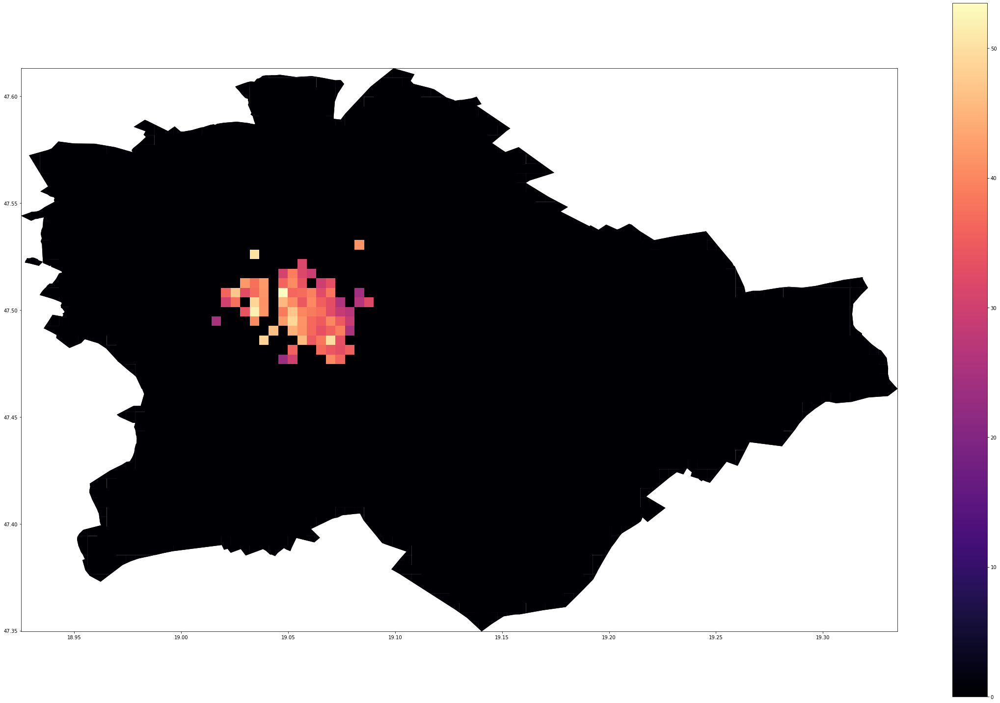

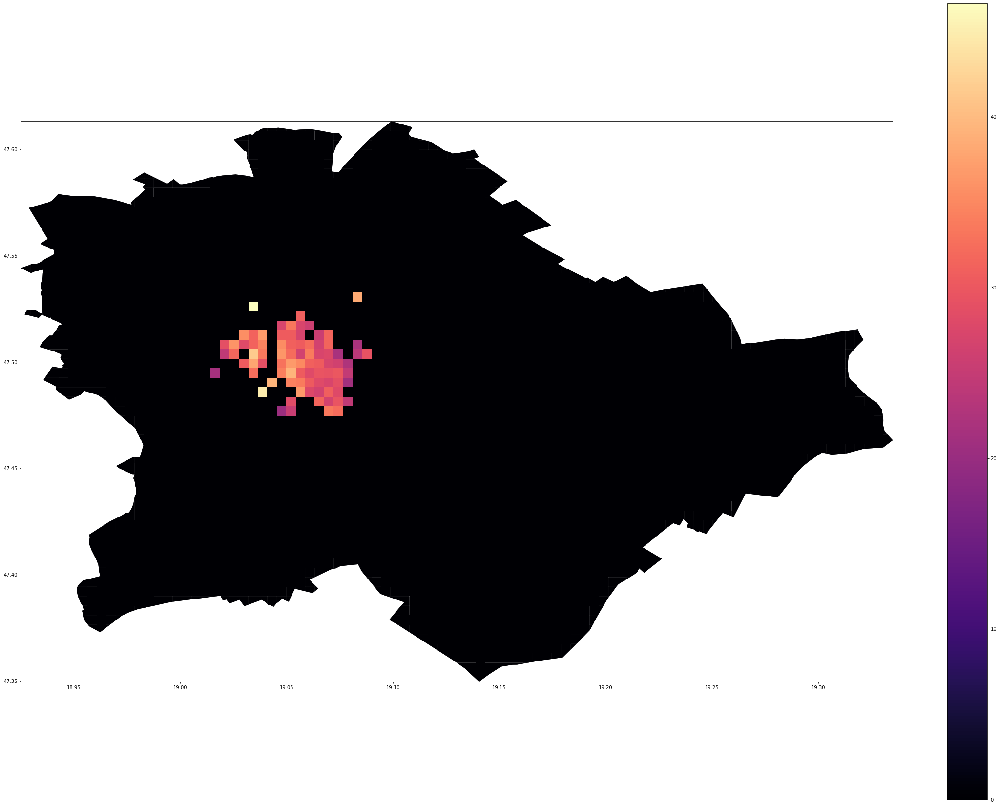

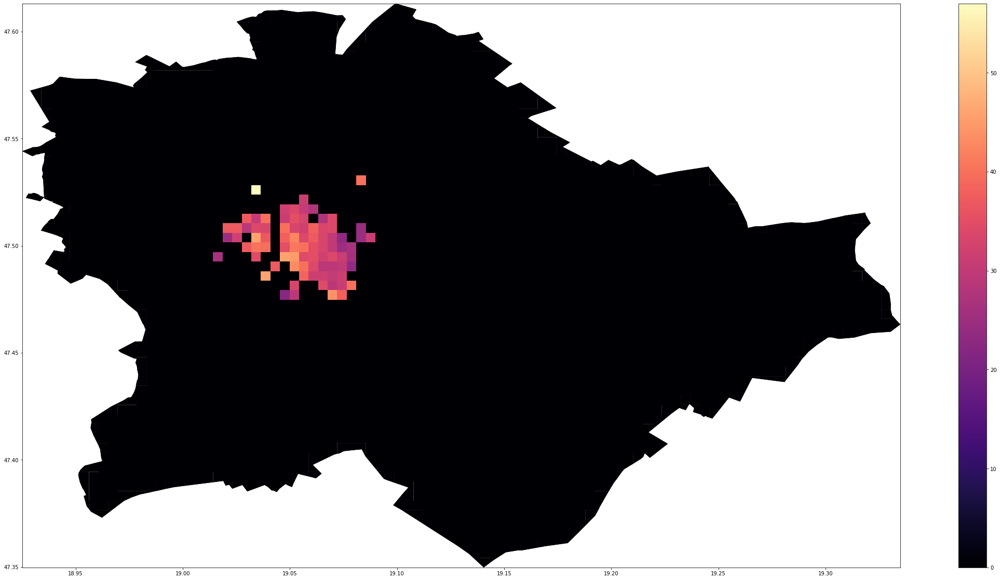

time: 14.5 s


In [3]:
data = pd.read_csv('data/Airbnb_Budapest.csv', header=0, index_col=0)
data = data[['room_id','latitude', 'longitude', 'bedrooms', 'price']]
print(len(data))

data.reset_index(drop=True, inplace=True)
print("data max index:", data.index.max())
print("number of NA prices:", data.price.isna().sum())

data.loc[data.bedrooms == 0, 'bedrooms'] = 1

price_proom = np.divide(np.array(data[pd.notnull(data['bedrooms'])].price),np.array(data[pd.notnull(data['bedrooms'])].bedrooms))
mean_bed = np.mean(price_proom)
print("average bedroom price",mean_bed)

nan_list = data[data.bedrooms.isna()].index.tolist()
data.loc[data.bedrooms.isna(), 'bedrooms'] = np.ceil(data.loc[data.bedrooms.isna(), 'price']/mean_bed)

geometry = [Point(xy) for xy in zip(data.longitude, data.latitude)]
crs = {'init': 'epsg:4326'}
gdf = gpd.GeoDataFrame(data, crs=crs, geometry=geometry)

meter_500 = 0.00899928/2


# make the geometry a multipolygon if it's not already
geometry = city['geometry'].iloc[0]
if isinstance(geometry, Polygon):
    geometry = MultiPolygon([geometry])
    
# quadrat_width is in the units the geometry is in, so we'll do a tenth of a degree
geometry_cut = ox.quadrat_cut_geometry(geometry, quadrat_width=meter_500)

city['coords'] = city['geometry'].apply(lambda x: x.representative_point().coords[:])
city['coords'] = [coords[0] for coords in city['coords']]

polylist = [p for p in geometry_cut]

polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city.geometry.crs
polyframe['center_lon'] = polyframe['geometry'].apply(lambda x: x.centroid.coords[0][0])
polyframe['center_lat'] = polyframe['geometry'].apply(lambda x: x.centroid.coords[0][1])


pointInPoly = gpd.sjoin(polyframe, gdf, op='contains')
print("pointinpoly length:",len(pointInPoly))

#pointInPoly.sort_values(['PlateID', 'Time'], inplace=True)
pointInPoly['index'] = pointInPoly.index
pointInPoly.reset_index(drop=True, inplace=True)


present_ind = list(pointInPoly['index_right'])
gdf_test_dropped = gdf.iloc[present_ind,:]
gdf_dropped = gdf_test_dropped.copy()
gdf_dropped.reset_index(drop=True, inplace=True)

print("check contains:",polyframe.iloc[pointInPoly.loc[len(pointInPoly)-1, 'index']].geometry.contains(gdf_dropped.loc[len(pointInPoly)-1,'geometry']))
gdf_dropped['pindex'] = pointInPoly['index']

print("check if there are NAs:", gdf_dropped.isna().values.any())

pindex = gdf_dropped.pindex.unique()
airbnb_dict = dict(gdf_dropped.pindex.value_counts())
counts = pd.DataFrame(list(airbnb_dict.items()), columns=['key', 'count'])
counts = counts[counts['count']>8]
counts = counts.copy()
airbnb_dict = dict(zip(list(counts['key']), list(counts['count'])))
polyair = polyframe.copy()
polyair['count'] = 0
polyair['count'].update(pd.Series(airbnb_dict))

# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))
polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='count',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


gdf_dropped = gdf_dropped[gdf_dropped.pindex.isin(airbnb_dict.keys())]
gdf_dropped = gdf_dropped.copy()
gdf_dropped = gdf_dropped[gdf_dropped['price'] > 0]
gdf_dropped = gdf_dropped.copy()
gdf_dropped['price_normalized'] = gdf_dropped.price.divide(gdf_dropped.bedrooms)
gdf_dropped = gdf_dropped[gdf_dropped.price_normalized<270]
gdf_dropped = gdf_dropped.copy()
gdf_dropped.reset_index(drop=True, inplace=True)
gdf_dropped.price_normalized.hist(bins=100)

prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].mean())
from scipy import stats
hmean_prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].apply(lambda x: stats.hmean(x)))
median_prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].median())

polyair['prices'] = 0
polyair['hmean_prices'] = 0
polyair['median_prices'] = 0
polyair['prices'].update(pd.Series(prices_dict))
polyair['hmean_prices'].update(pd.Series(hmean_prices_dict))
polyair['median_prices'].update(pd.Series(median_prices_dict))


# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))
polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()



# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,30))
polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='hmean_prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))
polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='median_prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


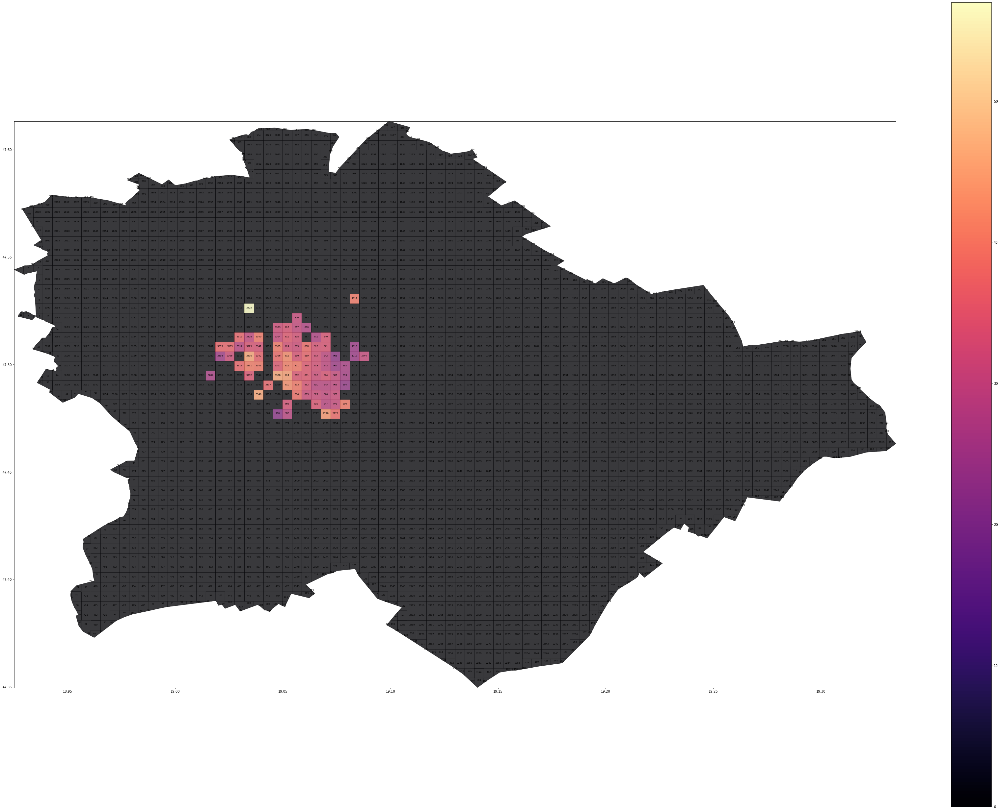

time: 32.1 s


In [4]:
# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(60,45))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
    plt.annotate(s=n, xy=p,
                 horizontalalignment='center', size=7)
polyframe.plot(ax=ax, color='#000004', alpha=0.5)
polyair.plot(column='median_prices',  legend=True, cmap='magma', ax=ax, alpha=0.7, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

In [5]:
polyair.loc[polyair.index==3325, 'median_prices'] = 29
polyair.loc[polyair.index==3325, 'hmean_prices'] = 29
polyair.loc[polyair.index==3325, 'prices'] = 29
polyair.loc[polyair.index==1011, 'median_prices'] = 15
polyair.loc[polyair.index==1011, 'hmean_prices'] = 15
polyair.loc[polyair.index==1011, 'prices'] = 15

time: 7.99 ms


In [6]:
polyair.loc[polyair.index==2778, 'median_prices'] = 24
polyair.loc[polyair.index==2778, 'hmean_prices'] = 24
polyair.loc[polyair.index==2778, 'prices'] = 24

time: 6 ms


In [7]:
polyair.loc[polyair.index==3346, 'median_prices'] = 31
polyair.loc[polyair.index==3346, 'hmean_prices'] = 31
polyair.loc[polyair.index==3346, 'prices'] = 31

time: 17 ms


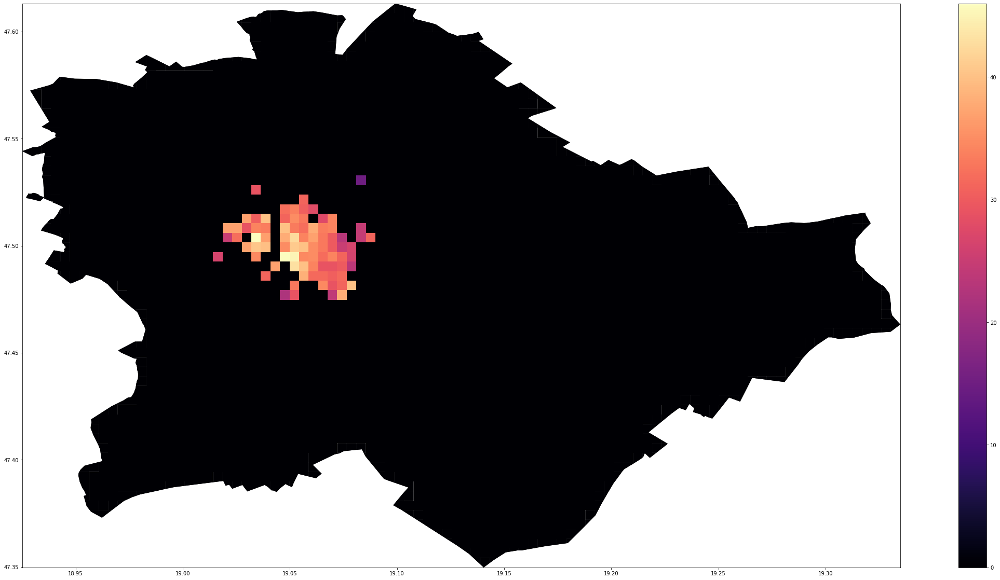

time: 2.66 s


In [8]:
# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))
polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='median_prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

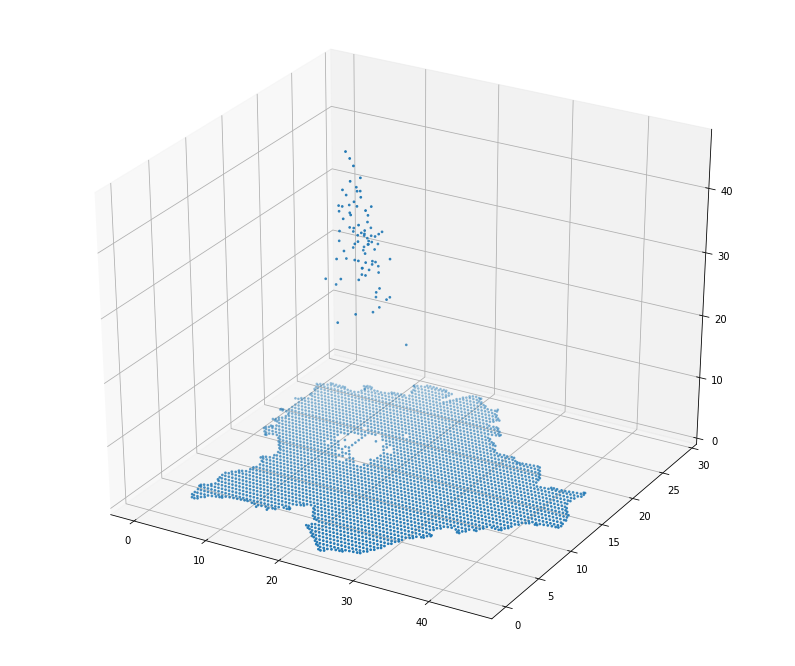

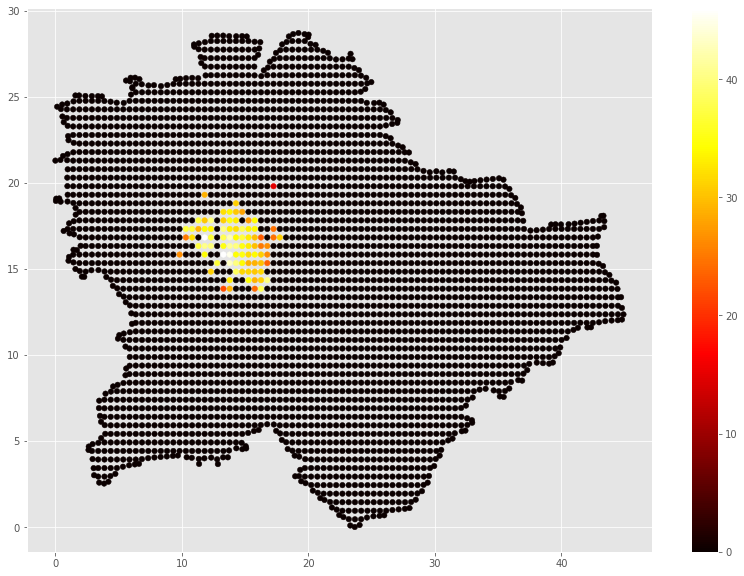

time: 2.17 s


In [9]:
import plotly.plotly as py
import plotly.graph_objs as go

# MatPlotlib
import matplotlib.pyplot as plt
from matplotlib import pylab
from mpl_toolkits.mplot3d import Axes3D
#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)

x = np.array(polyair.center_lon)*500/meter_500
x = x-x.min()
x = x/1000

y = np.array(polyair.center_lat)*500/meter_500 
y = y-y.min()
y = y/1000


# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, np.array(polyair.median_prices), cmap='plasma', s=3)
ax.set_zlim(0,np.max(np.array(polyair.median_prices))+2)
ax.view_init(30, 300)
plt.show()


plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(14,10))
scat = ax.scatter(x, y, c=np.array(polyair.median_prices), s=30, cmap='hot')
cbar = fig.colorbar(scat)
#cbar.set_clim(0, 250)
plt.savefig('images/Budapest_observed.jpg')
plt.show()

In [10]:
cdf = polyair[polyair.index.isin([3330, 3368])]
cdf["cen_lon_km"] = cdf['center_lon'].apply(lambda x: (x*500/meter_500 - (polyair.center_lon*500/meter_500).min())/1000)
cdf["cen_lat_km"] = cdf['center_lat'].apply(lambda x: (x*500/meter_500 - (polyair.center_lat*500/meter_500).min())/1000)
cdf

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,geometry,center_lon,center_lat,count,prices,hmean_prices,median_prices,cen_lon_km,cen_lat_km
3330,"POLYGON ((19.03201529130885 47.50597789152093,...",19.034243,47.503745,17,48.764706,41.388215,46.0,11.797141,16.822985
3368,"POLYGON ((19.04537899022189 47.49704714914805,...",19.047606,47.494814,9,42.018519,34.163560,46.0,13.282116,15.830601


time: 382 ms


Fitted parameters:
[34.23030891 14.09957762 16.37711728  2.47148087  1.43621008  0.38579885
  1.79602887]
RMS residual = 2.97929855738429


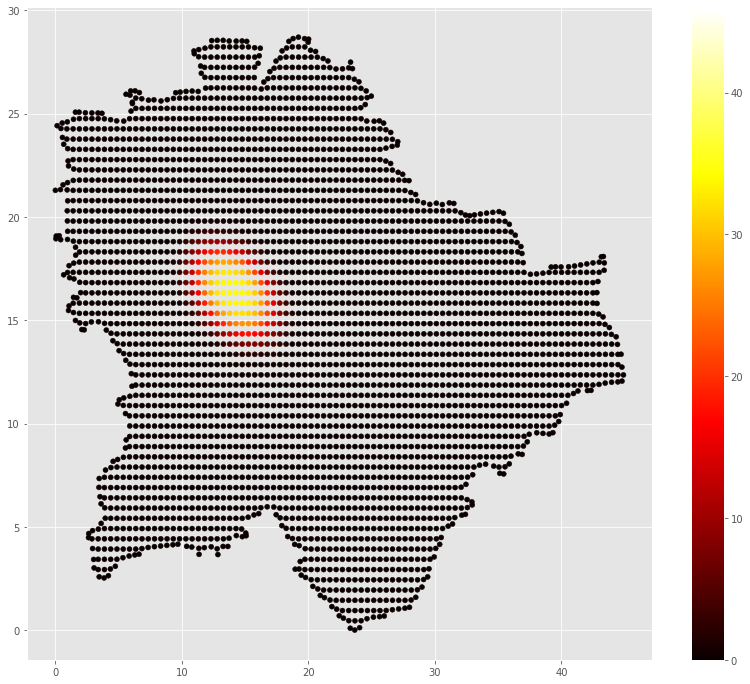

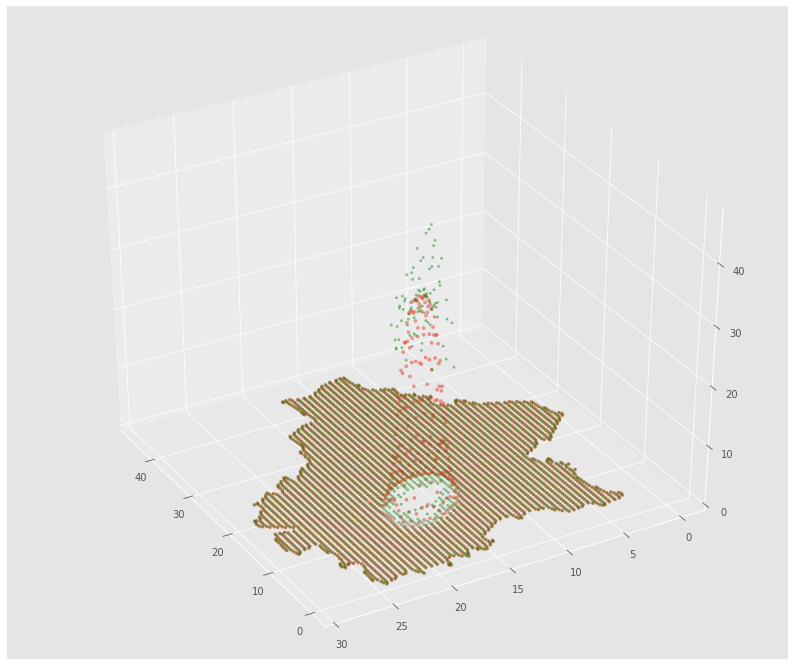

{'Budapest': 1.796028872269106}
time: 1.51 s


In [11]:
alphas = {}
xy = np.vstack([x, y])
zobs = np.array(polyair.median_prices)
#zobs = np.where(zobs>0, zobs, 0.1*zobs.max())
import scipy.optimize as opt
import matplotlib.pyplot as plt

def _gaussian(M, *args):
    xy = M
    arr = np.zeros(len(zobs))
    for i in range(len(args)//7):
        arr += twoD_Gaussian_alpha(xy, *args[i*7:i*7+7])
    return arr




guess_prms = [(46,11.797141,16.822985, 0.8, 0.6,0.58, 1.1),
              #(46,13.282116, 15.830601, 1.2, 1.7,2.4, 1.8),
              #(54,33.195764,9.446164, 1, 0.5,1.87, 0.7),
              #(65,15.598986,8.387698, 1, 1,0.87, 1.5),
              #(115.16,18.041651,9.867014, 0.5, 1,1.87, 1.1)
             ]

# Flatten the initial guess parameter list.
p0 = [p for prms in guess_prms for p in prms]

def twoD_Gaussian_alpha(xy, amplitude, xo, yo, sigma_x, sigma_y, theta, alpha):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2))**alpha)
    return g.ravel()
popt, pcov = opt.curve_fit(_gaussian, xy, zobs, p0)
#pred_params, uncert_cov = opt.curve_fit(gauss2d, xy, zobs, p0=guess)

zpred = np.zeros(len(zobs))
for i in range(len(popt)//7):
    zpred += twoD_Gaussian_alpha(xy, *popt[i*7:i*7+7])

# for i in range(len(popt)//5):
#     fit += gaussian(X, Y, *popt[i*5:i*5+5])
print('Fitted parameters:')
print(popt)

rms = np.sqrt(np.mean((zobs - zpred)**2))
print('RMS residual =', rms)


fig, ax = plt.subplots(figsize=(14,12))
scat = ax.scatter(x, y, c=zpred, vmin=0, vmax=zobs.max(), s=25, cmap='hot')
fig.colorbar(scat)
plt.savefig('Budapest_fitted.jpg')
plt.show()


#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)
# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, zpred, cmap='plasma', s=10, alpha=0.5)
ax.scatter(x, y, zobs, color='green', s=5, alpha=0.4)
ax.set_zlim(0,np.max(np.array(polyair.median_prices))+2)
ax.view_init(35, 150)
plt.show()

alphas['Budapest'] = np.mean(popt[6::7])
print(alphas)

In [12]:
import pickle
pickle_in = open("alphas.pickle","rb")
alphas_dict = pickle.load(pickle_in)
#prices_params_dict = {}
alphas_dict['Budapest'] = alphas['Budapest']
print(alphas_dict)
pickle_out = open("alphas.pickle","wb")
pickle.dump(alphas_dict, pickle_out)
pickle_out.close()

{'Paris': 1.9119263949210794, 'Amsterdam': 1.6077156181165682, 'Stockholm': 1.4869621148124246, 'Arezzo': 1.5291330654483044, 'Berlin': 1.3281036059479567, 'Bordeaux': 1.387341915093677, 'Denver': 0.9886695315944182, 'Edinburgh': 1.7431661910906637, 'Lyon': 1.840995035260712, 'Madrid': 1.561423826026336, 'Buenos_Aires': 2.0626361633770363, 'Los_Angeles': 1.7386638625850566, 'Beijing': 1.77233254047711, 'Florence': 1.052999973906332, 'Moscow': 1.822610958759147, 'Porto': 1.4172416677632145, 'Prague': 1.3671832768992007, 'Reykjavik': 1.4194582940670377, 'Riga': 1.4587192546215861, 'Rome': 1.8608390724186512, 'Seoul': 1.3208669147673713, 'Siena': 0.6212787996336754, 'Sydney': 2.584174464016137, 'Tallin': 2.014994948135572, 'Treviso': 1.07320426583068, 'Valencia': 1.5432619, 'Venezia': 1.3156028460923, 'Verona': 1.4364606330705336, 'Vicenza': 1.20971848439062, 'Vienna': 1.3399164167136137, 'Wellington': 1.46363348, 'Zurich': 1.72383878, 'Aarhus': 1.87621535, 'Milan': 2.1468310347956194, 'B

Fitted parameters:
[36.46543225 11.43007107 16.98117184  0.8041185   0.65173211  0.58137287
 45.15774931 14.70766019 16.23822876  1.20891469  1.71722365  2.40312735]
RMS residual = 2.798469853569879


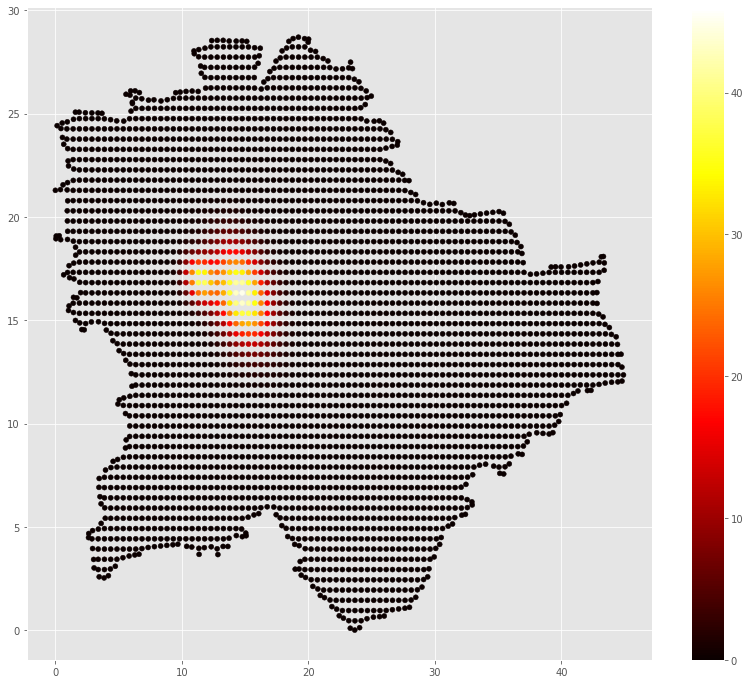

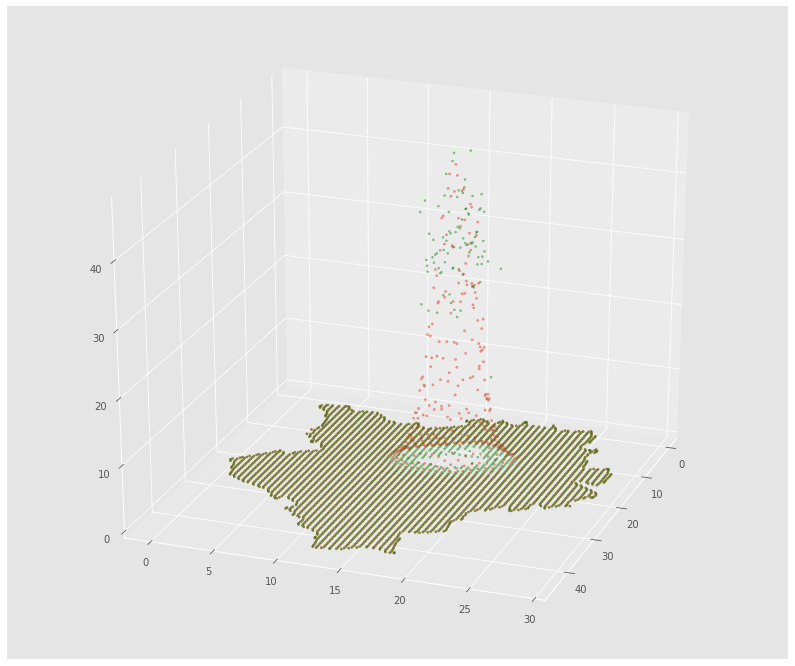

time: 1.85 s


In [13]:
xy = np.vstack([x, y])
zobs = np.array(polyair.median_prices)
#zobs = np.where(zobs>0, zobs, 0.1*zobs.max())
import scipy.optimize as opt
import matplotlib.pyplot as plt

def _gaussian(M, *args):
    xy = M
    arr = np.zeros(len(zobs))
    for i in range(len(args)//6):
        arr += twoD_Gaussian(xy, *args[i*6:i*6+6])
    return arr


guess_prms = [(46,11.797141,16.822985, 2, 2,1.1),
              (46,13.282116, 15.830601, 1, 2,1.97),
              #(54,33.195764,9.446164, 1, 0.5,1.87, 0.7),
              #(65,15.598986,8.387698, 1, 1,0.87, 1.5),
              #(115.16,18.041651,9.867014, 0.5, 1,1.87, 1.1)
             ]

# Flatten the initial guess parameter list.
p0 = [p for prms in guess_prms for p in prms]

def twoD_Gaussian(xy, amplitude, xo, yo, sigma_x, sigma_y, theta):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2)))
    return g.ravel()
popt, pcov = opt.curve_fit(_gaussian, xy, zobs, p0)
#pred_params, uncert_cov = opt.curve_fit(gauss2d, xy, zobs, p0=guess)

zpred = np.zeros(len(zobs))
for i in range(len(popt)//6):
    zpred += twoD_Gaussian(xy, *popt[i*6:i*6+6])

# for i in range(len(popt)//5):
#     fit += gaussian(X, Y, *popt[i*5:i*5+5])
print('Fitted parameters:')
print(popt)

rms = np.sqrt(np.mean((zobs - zpred)**2))
print('RMS residual =', rms)


fig, ax = plt.subplots(figsize=(14,12))
scat = ax.scatter(x, y, c=zpred, vmin=0, vmax=zobs.max(), s=25, cmap='hot')
fig.colorbar(scat)
plt.savefig('Budapest_fitted.jpg')
plt.show()


#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)
# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, zpred, cmap='plasma', s=5, alpha=0.5)
ax.scatter(x, y, zobs, color='green', s=4, alpha=0.4)
ax.set_zlim(0,np.max(np.array(polyair.median_prices))+2)
ax.view_init(25, 20)
plt.show()

In [14]:
def is_pos_def(x):
    return np.all(np.linalg.eigvals(x) > 0)

sqrt_eigs_long = np.array([])
sqrt_eigs_short = np.array([])
for i in range(0, len(popt), 6):
    a = (np.cos(popt[i+5])**2)/(2*popt[i+3]**2) + (np.sin(popt[i+5])**2)/(2*popt[i+4]**2)
    b = -(np.sin(2*popt[i+5]))/(4*popt[i+3]**2) + (np.sin(2*popt[i+5]))/(4*popt[i+4]**2)
    c = (np.sin(popt[i+5])**2)/(2*popt[i+3]**2) + (np.cos(popt[i+5])**2)/(2*popt[i+4]**2)
    cov = np.array([a, b, b, c]).reshape(-1, 2)
    print("Is cov_{} positive definite?: ".format(i//6+1), is_pos_def(cov))
    eigenvalues = np.linalg.eigvals(cov)
    eigenvalues = eigenvalues[eigenvalues>0]
    if eigenvalues.size!=0:
        stds = np.sqrt(eigenvalues)/popt[i]
        #stds = stds[stds>=0]
        sqrt_eigs_long = np.append(sqrt_eigs_long,max(stds))
        sqrt_eigs_short = np.append(sqrt_eigs_short,min(stds))

print('long stds: ', sqrt_eigs_long, 'mean: ', np.mean(sqrt_eigs_long))
print('short stds: ', sqrt_eigs_short, 'mean: ', np.mean(sqrt_eigs_short))

Is cov_1 positive definite?:  True
Is cov_2 positive definite?:  True
long stds:  [0.02975326 0.0129526 ] mean:  0.021352930270541054
short stds:  [0.0241148  0.00911855] mean:  0.016616673429034605
time: 7 ms


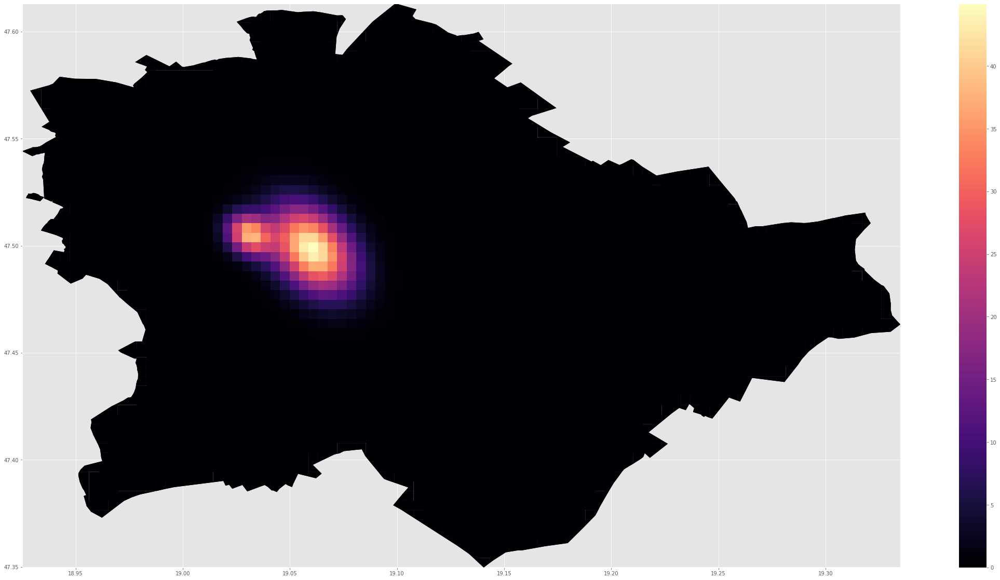

time: 2.48 s


In [15]:
polyair['zpred'] = zpred
# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))

polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='zpred',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

In [16]:
import pickle
pickle_in = open("Prices_params.pickle","rb")
prices_params_dict = pickle.load(pickle_in)
#prices_params_dict = {}
prices_params_dict['Budapest'] = popt
pickle_out = open("Prices_params.pickle","wb")
pickle.dump(prices_params_dict, pickle_out)
pickle_out.close()

#average_slopes = {}
pickle_in_long = open("Average_price_slopes_long.pickle","rb")
average_slopes_long = pickle.load(pickle_in_long)
average_slopes_long['Budapest'] = np.mean(sqrt_eigs_long)
pickle_out_long = open("Average_price_slopes_long.pickle","wb")
pickle.dump(average_slopes_long, pickle_out_long)
pickle_out_long.close()

pickle_in_short = open("Average_price_slopes_short.pickle","rb")
average_slopes_short = pickle.load(pickle_in_short)
average_slopes_short['Budapest'] = np.mean(sqrt_eigs_short)
pickle_out_short = open("Average_price_slopes_short.pickle","wb")
pickle.dump(average_slopes_short, pickle_out_short)
pickle_out_short.close()

print('long: ', average_slopes_long, '\n', '\n', ' short: ', average_slopes_short)

long:  {'Paris': 0.010453121182320417, 'Amsterdam': 0.017790862401138207, 'Stockholm': 0.01160078748441716, 'Arezzo': 0.012661960610292892, 'Berlin': 0.017168942092868542, 'Bordeaux': 0.0057209390468692745, 'Denver': 0.00873766709683174, 'Edinburgh': 0.012921100209712873, 'Lyon': 0.00594530194011358, 'Madrid': 0.01315080289968449, 'Buenos_Aires': 0.00938788752473718, 'Palermo': 0.02659431146972356, 'Los_Angeles': 0.0056655377791732745, 'Beijing': 0.03548021455387483, 'Florence': 0.011913882705309832, 'Moscow': 0.026524810524746, 'Porto': 0.03745056113103571, 'Prague': 0.01850581507565583, 'Reykjavik': 0.04000475004839031, 'Riga': 0.02150786435094239, 'Rome': 0.009635062558537275, 'Seoul': 0.013154650694260608, 'Siena': 0.013838139160990736, 'Sydney': 0.009200022664460229, 'Tallin': 0.024848430854086192, 'Treviso': 0.015264513943951563, 'Valencia': 0.01982718757582555, 'Venezia': 0.013133572970121148, 'Verona': 0.01119208328282184, 'Vicenza': 0.029546407262138693, 'Vienna': 0.0120270170

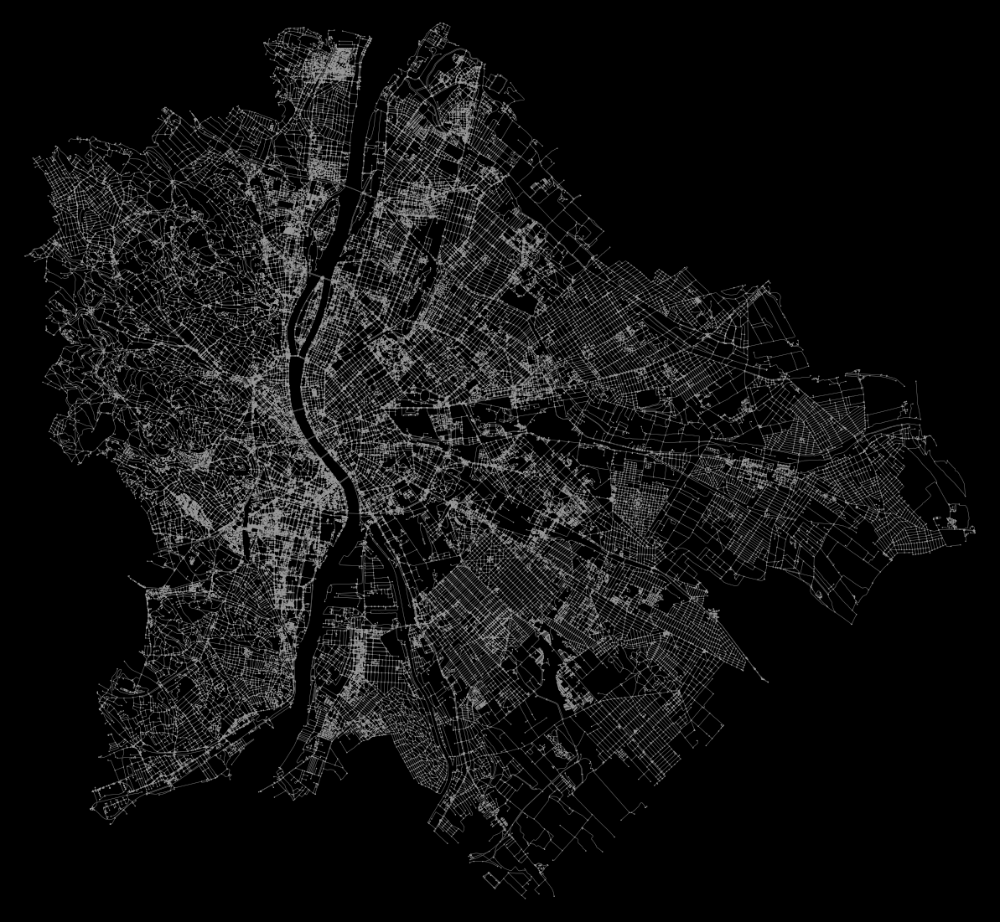

time: 2min 53s


In [17]:
# download and project a street network
G = ox.graph_from_place('Budapest, Hungary', network_type="walk")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, fig_height=20, bgcolor='k', node_size=2, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=0.5, edge_alpha=1)

In [18]:
centers = {}
for i in range(0, len(popt), 6):
    lon = popt[i+1]*1000 + (np.array(polyair.center_lon)*500/meter_500).min()
    lon = lon*meter_500/500
    lat = popt[i+2]*1000 + (np.array(polyair.center_lat)*500/meter_500).min()
    lat = lat*meter_500/500
    centers['center_node_{}'.format(i//6+1)] = ox.get_nearest_node(G, (lat,lon))

centers

{'center_node_1': 4485167795, 'center_node_2': 3241869987}

time: 326 ms


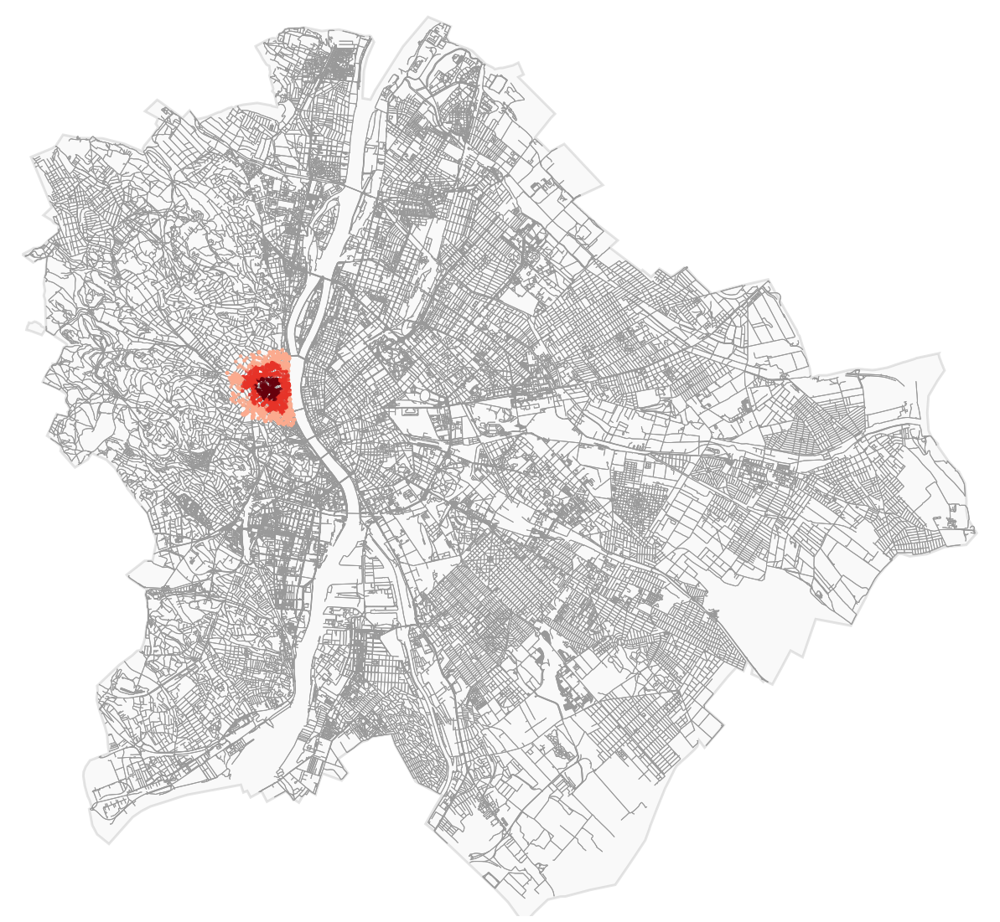

time: 45.5 s


In [19]:
import networkx as nx
#center_node = ox.get_nearest_node(G, (popt[8],popt[7]))
center_node = centers['center_node_1']
# list of distances from center
dists = np.arange(500, 2000, 500)
dists

# get one color for each isochrone
iso_colors = ox.get_colors(n=len(dists), cmap='Reds', start=0.3, return_hex=True)
# color the nodes according to isochrone then plot the street network
node_colors = {}
for dist, color in zip(sorted(dists, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G, center_node, radius=dist, distance='length')
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else 'none' for node in G.nodes()]
ns = [20 if node in node_colors else 0 for node in G.nodes()]
fig, ax = ox.plot_graph(G, fig_height=20,show=False, close=False, node_color=nc, node_size=ns, node_alpha=0.8, node_zorder=2)
plt.close()
# to this matplotlib axis, add the place shape as descartes polygon patches
for geometry in city['geometry'].tolist():
    if isinstance(geometry, (Polygon, MultiPolygon)):
        if isinstance(geometry, Polygon):
            geometry = MultiPolygon([geometry])
        for polygon in geometry:
            patch = PolygonPatch(polygon, fc='#cccccc', ec='k', linewidth=3, alpha=0.1, zorder=-1)
            ax.add_patch(patch)
            
fig

3371
3371 171
Number of cells with price above 5th percentile:  171



[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.00446537 0.00893074]
 [0.         0.         0.         ... 0.         0.         0.00446537]
 [0.         0.         0.         ... 0.         0.         0.        ]]
Yes


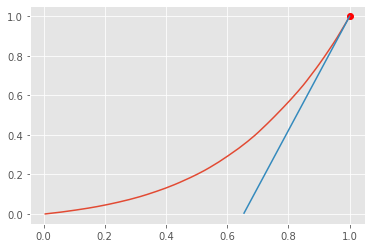

Loubar price:  19.347452849140428
Average price:  16.106925285845467
average city distance:  3463.3335339061914
eta =  0.661191217146844
time: 4.91 s


In [20]:
from tqdm import tqdm_notebook

#poly_prices = polyair[polyair.median_prices>0]
poly_prices = polyair.copy()
print(len(poly_prices))
poly_prices['zpred'] = zpred

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)

vals_cut = vals[vals>0.06*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.06*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))



mat = np.zeros(shape=(len(geometry_cut), len(geometry_cut)))
for pair in tqdm_notebook(combinations(sorted(keys), 2)):
    mat[pair[0], pair[1]] = geometry_cut[pair[0]].centroid.distance(geometry_cut[pair[1]].centroid)
    
print(mat)


def isuppertriangular(M): 
    for i in range(1, len(M)): 
        for j in range(0, i): 
            if(M[i][j] != 0):  
                    return False
    return True

  
if isuppertriangular(mat): 
    print ("Yes") 
else: 
    print ("No") 
    
    
L1= L
F1 = np.arange(1, len(L1)+1)/len(L1)

L1 = (L1 - L1.min())/(L1.max()-L1.min())

from scipy import interpolate
tck = interpolate.splrep(F1,L1)
x0_1 =1
y0_1 = interpolate.splev(x0_1,tck)
dydx = interpolate.splev(x0_1,tck,der=1)
tngnt1 = lambda x: dydx*x + (y0_1-dydx*x0_1)
plt.plot(F1, L1)
plt.plot(x0_1,y0_1, "or")
plt.plot(F1[tngnt1(F1)>0],tngnt1(F1[tngnt1(F1)>0]), label="tangent")
plt.show()

indlist = poly_prices.index.tolist()

loubar_val = vals_cut[np.where(tngnt1(F1)>0)[0][0]]

print('Loubar price: ', loubar_val)
print('Average price: ', np.mean(vals_cut))

if loubar_val > np.mean(vals_cut):
    loubar_keys = keys[vals_cut>loubar_val]
else:
    loubar_keys = keys[vals_cut>np.mean(vals_cut)]
#loubar_keys = keys[vals_cut>loubar_val]
dist_mat = mat[keys.reshape(-1,1), keys]

total_dist = dist_mat.sum()
dist_corr = dist_mat[dist_mat>0]

loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]
loubar_dist = loubar_dist_mat.sum()

loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
eta_loubar = loubar_dist_corr.mean()/dist_corr.mean()

x = np.array(polyair.center_lon)*500/meter_500
x = x-x.min()
x = x/1000

avg_dist_meters = (dist_corr.mean()/0.00899928)*1000
print('average city distance: ', avg_dist_meters)
print('eta = ', eta_loubar)

In [21]:
pickle_in = open("City_spreading_index.pickle","rb")
spreading_index_dict = pickle.load(pickle_in)
#spreading_index_dict = {}
spreading_index_dict['Budapest'] = eta_loubar


pickle_out = open("City_spreading_index.pickle","wb")
pickle.dump(spreading_index_dict, pickle_out)
pickle_out.close()

spreading_index_dict

{'Paris': 0.7251609142253275,
 'Amsterdam': 0.6513935879350918,
 'Stockholm': 0.6839327295656318,
 'Arezzo': 0.5574311537992848,
 'Berlin': 0.7499866909236614,
 'Bordeaux': 0.5818334466519048,
 'Denver': 0.6312111392217781,
 'Edinburgh': 0.6813298654934006,
 'Lyon': 0.6138305864151811,
 'Madrid': 0.6426066210787698,
 'Buenos_Aires': 0.8337988194080271,
 'Palermo': 0.8841435007903967,
 'Los_Angeles': 0.7889452782510832,
 'Beijing': 0.6425383574699105,
 'Florence': 0.5049117106731263,
 'Moscow': 0.6925493573699144,
 'Porto': 0.7058843952576399,
 'Prague': 0.5522963433539414,
 'Reykjavik': 0.8276260142343259,
 'Riga': 0.6850021296374689,
 'Rome': 0.5803964773671335,
 'Seoul': 0.8924742030382572,
 'Siena': 0.5646389917673048,
 'Sydney': 0.7909301400958108,
 'Tallin': 0.5690189423395199,
 'Treviso': 0.5345662066021125,
 'Valencia': 0.6956994914059091,
 'Venezia': 0.656650370883064,
 'Verona': 0.5707647012625697,
 'Vicenza': 0.5117751186840898,
 'Vienna': 0.6189242538490607,
 'Wellington': 0

time: 5 ms


In [22]:
pickle_in = open("avg_distances_dict.pickle","rb")
avg_distances_dict = pickle.load(pickle_in)
#avg_distances_dict = {}
avg_distances_dict['Budapest'] = avg_dist_meters


pickle_out = open("avg_distances_dict.pickle","wb")
pickle.dump(avg_distances_dict, pickle_out)
pickle_out.close()

avg_distances_dict

{'Venezia': 2398.636425932576,
 'Verona': 3141.8502884813342,
 'Vicenza': 1988.2224372858566,
 'Vienna': 5125.89366602888,
 'Wellington': 2806.4963410749997,
 'Zurich': 2068.4583585914684,
 'Aarhus': 2857.919349359045,
 'Milan': 6008.128043000454,
 'Busan': 7348.804402235624,
 'Valencia': 4090.433301180094,
 'Bologna': 2104.4589605649485,
 'Barcelona': 4218.232625020259,
 'Bremen': 3495.925661234734,
 'Brno': 2231.9772664038364,
 'Budapest': 3463.3335339061914,
 'Dublin': 4138.1465107736385,
 'Boston': 5610.60832524716,
 'Rio': 8357.334811118957,
 'NY': 8563.096975538809,
 'Ottawa': 2220.3476963993976,
 'Nashville': 5606.900406329212,
 'New_Orleans': 5048.047130029565,
 'Shanghai': 5452.583570486633,
 'Portland': 5406.388840795854,
 'Amsterdam': 7020.480387015727,
 'Arezzo': 1662.0178383704194,
 'Beijing': 6586.560663166117,
 'Berlin': 8495.253652229821,
 'Bordeaux': 3886.5511701192345}

time: 7.01 ms


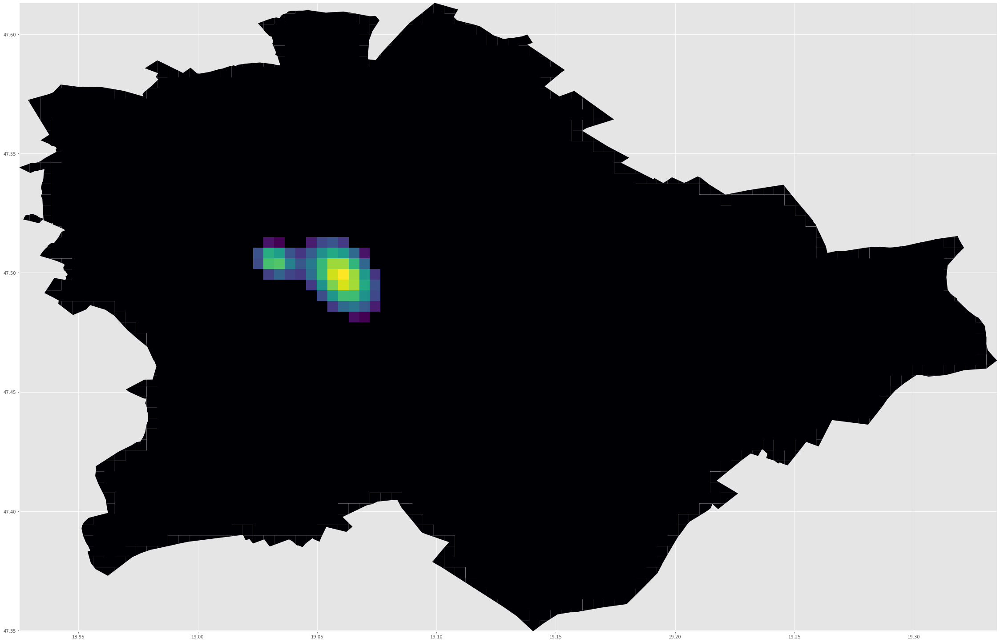

time: 2.17 s


In [23]:
# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe.plot(ax=ax, color='#000004')
#polyair.plot(column='prices',  legend=True, cmap='magma', ax=ax)    
poly_prices[poly_prices.index.isin(loubar_keys)].plot(ax=ax, column='zpred')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

In [24]:
lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    
print(len(keys))
vals = np.array(vals)
keys = np.array(keys)
keys = keys[vals>=0.01*vals.max()]
print(len(keys))

indlist = poly_prices.index.tolist()
mat = np.zeros(shape=(len(geometry_cut), len(geometry_cut)))
for pair in tqdm_notebook(combinations(sorted(keys), 2)):
    mat[pair[0], pair[1]] = geometry_cut[pair[0]].centroid.distance(geometry_cut[pair[1]].centroid)

print(mat)


def isuppertriangular(M): 
    for i in range(1, len(M)): 
        for j in range(0, i): 
            if(M[i][j] != 0):  
                    return False
    return True


if isuppertriangular(mat): 
    print ("Yes") 
else: 
    print ("No")

3371
260



[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.00446537 0.00893074]
 [0.         0.         0.         ... 0.         0.         0.00446537]
 [0.         0.         0.         ... 0.         0.         0.        ]]
Yes
time: 5.92 s


3371


3371 260
Number of cells with price above 1.0th percentile:  260
Loubar price:  11.278065768517289
Average price:  11.015003171624087
eta =  0.6237989124181865
3371 224
Number of cells with price above 2.0th percentile:  224
Loubar price:  14.960637498372343
Average price:  12.67971330730388
eta =  0.6280819067311129
3371 205
Number of cells with price above 3.0th percentile:  205
Loubar price:  16.329352499082983
Average price:  13.751667671815085
eta =  0.628199396484143
3371 192
Number of cells with price above 4.0th percentile:  192
Loubar price:  17.29274103692551
Average price:  14.57903502843625
eta =  0.6342054229631235
3371 180
Number of cells with price above 5.0th percentile:  180
Loubar price:  17.71170770354447
Average price:  15.420047267938127
eta =  0.6536497741545716
3371 171
Number of cells with price above 6.000000000000001th percentile:  171
Loubar price:  19.347452849140428
Average price:  16.106925285845467
eta =  0.661191217146844
3371 161
Number of cells with pr

Average price:  31.49332562770417
eta =  0.809071692190847
3371 52
Number of cells with price above 52.0th percentile:  52
Loubar price:  33.56865082516705
Average price:  31.49332562770417
eta =  0.809071692190847
3371 48
Number of cells with price above 53.0th percentile:  48
Loubar price:  34.881793698545415
Average price:  32.149302489522114
eta =  0.8105032111552101
3371 46
Number of cells with price above 54.0th percentile:  46
Loubar price:  35.3491445174758
Average price:  32.50725354556892
eta =  0.7118438728420895
3371 44
Number of cells with price above 55.00000000000001th percentile:  44
Loubar price:  35.3491445174758
Average price:  32.868329919831254
eta =  0.7240779557123295
3371 42
Number of cells with price above 56.00000000000001th percentile:  42
Loubar price:  36.18421819114164
Average price:  33.24284250099299
eta =  0.7360365021828736
3371 40
Number of cells with price above 57.00000000000001th percentile:  40
Loubar price:  36.542591335300116
Average price:  33.

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning:

Mean of empty slice.

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning:

invalid value encountered in double_scalars



eta =  nan
3371 3
Number of cells with price above 93.0th percentile:  3
Loubar price:  43.47845776009286
Average price:  43.88527616221427
eta =  nan
3371 3
Number of cells with price above 94.0th percentile:  3
Loubar price:  43.47845776009286
Average price:  43.88527616221427
eta =  nan
3371 3
Number of cells with price above 95.0th percentile:  3
Loubar price:  43.47845776009286
Average price:  43.88527616221427
eta =  nan
3371 2
Number of cells with price above 96.00000000000001th percentile:  2
Loubar price:  44.9898353134607
Average price:  44.23414653677678
eta =  nan
3371 1
Number of cells with price above 97.0th percentile:  1


C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:37: RuntimeWarning:

invalid value encountered in true_divide



Loubar price:  44.9898353134607
Average price:  44.9898353134607
eta =  nan
3371 1
Number of cells with price above 98.0th percentile:  1
Loubar price:  44.9898353134607
Average price:  44.9898353134607
eta =  nan
3371 1
Number of cells with price above 99.0th percentile:  1
Loubar price:  44.9898353134607
Average price:  44.9898353134607
eta =  nan
3371 1
Number of cells with price above 100.0th percentile:  1
Loubar price:  44.9898353134607
Average price:  44.9898353134607
eta =  nan



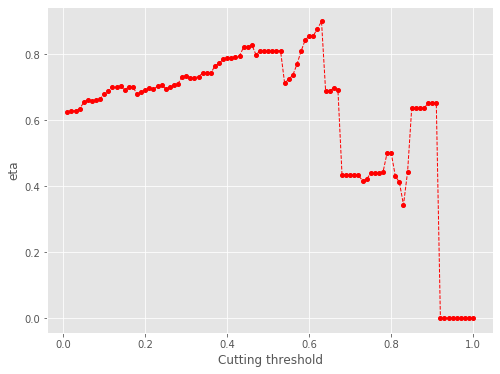

time: 1.62 s


In [25]:
from tqdm import tqdm_notebook

#poly_prices = polyair[polyair.median_prices>0]
poly_prices = polyair.copy()
print(len(poly_prices))
poly_prices['zpred'] = zpred

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys_initial = np.array(keys)


perc_vals = np.linspace(0.01, 1, 100)
etas_cut = []
for i in tqdm_notebook(perc_vals):
    keys = keys_initial
    vals_cut = vals[vals>=i*vals.max()]
    print(len(vals), len(vals_cut))

    L = np.cumsum(vals_cut)/np.sum(vals_cut)
    keys = keys[vals>=i*vals.max()]
    print('Number of cells with price above {}th percentile: '.format(i*100), len(keys))
    
    
        
    L1= L
    F1 = np.arange(1, len(L1)+1)/len(L1)

    L1 = (L1 - L1.min())/(L1.max()-L1.min())
    

    loubar_val = vals_cut[np.where(tngnt1(F1)>0)[0][0]]

    print('Loubar price: ', loubar_val)
    print('Average price: ', np.mean(vals_cut))
    
    
    loubar_keys = keys[vals_cut>loubar_val]
    dist_mat = mat[keys.reshape(-1,1), keys]

    total_dist = dist_mat.sum()
    dist_corr = dist_mat[dist_mat>0]

    loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

    loubar_dist = loubar_dist_mat.sum()

    loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
    eta = loubar_dist_corr.mean()/dist_corr.mean()
    etas_cut.append(eta)
    print('eta = ', eta)
etas_cut = np.array(etas_cut)
etas_cut = np.where(np.isnan(etas_cut), 0, etas_cut)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(perc_vals, etas_cut, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
plt.xlabel("Cutting threshold")
plt.ylabel("eta")
plt.show()

In [26]:
pickle_in = open("etas_cut_dict.pickle","rb")
etas_cut_dict = pickle.load(pickle_in)
#etas_cut_dict = {}
etas_cut_dict['Budapest'] = etas_cut


pickle_out = open("etas_cut_dict.pickle","wb")
pickle.dump(etas_cut_dict, pickle_out)
pickle_out.close()

etas_cut_dict

{'Boston': array([0.69697859, 0.70601119, 0.71142664, 0.72735905, 0.71723297,
        0.69152614, 0.68969459, 0.69338651, 0.68627389, 0.68571239,
        0.68565242, 0.66080855, 0.68568495, 0.66662135, 0.65169235,
        0.66853925, 0.64080339, 0.6392735 , 0.64870117, 0.66369008,
        0.64936606, 0.65513408, 0.65817401, 0.54708479, 0.54484174,
        0.5177247 , 0.54225619, 0.54660686, 0.55128317, 0.55836993,
        0.56571414, 0.52792612, 0.52759205, 0.55096732, 0.46941853,
        0.48021089, 0.47484233, 0.46129546, 0.46439344, 0.4699713 ,
        0.50255475, 0.51573036, 0.52765377, 0.52765377, 0.53943229,
        0.54404083, 0.54813213, 0.6100999 , 0.50092562, 0.52536404,
        0.56707558, 0.56150998, 0.61316219, 0.66467806, 0.74541769,
        0.74541769, 0.77652679, 0.74895419, 0.92876367, 0.92876367,
        0.90963119, 0.90963119, 1.05344906, 1.15130075, 1.15130075,
        1.22651104, 1.26738008, 0.62257449, 0.62257449, 0.64231201,
        0.64231201, 0.62403947, 0.6307

time: 25 ms


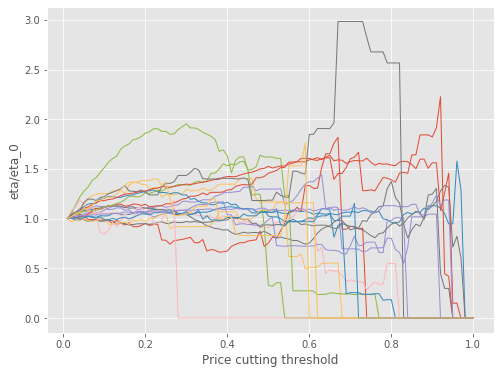

time: 215 ms


In [27]:
fig, ax = plt.subplots(figsize=(8, 6))
for key in etas_cut_dict:
    #print(len(etas_cut_dict[key]))
    etas = etas_cut_dict[key]#[1:]
    vals = etas/etas[0]
    plt.plot(np.linspace(0.01, 1, 100), vals, linestyle='-', linewidth=1)
plt.xlabel("Price cutting threshold")
plt.ylabel("eta/eta_0")
plt.show()

3371 171
Number of cells with price above 5th percentile:  171


eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  0.9952522970494333
eta =  0.9738667478398239
eta =  0.9540184739404328
eta =  0.9290214770393052
eta =  0.9166683359633542
eta =  0.9068619117871635
eta =  0.8913303177319892
eta =  0.8705233910587513
eta =  0.8624486231191544
eta =  0.8524256366557592
eta =  0.8440809467853613
eta =  0.8422289214256918
eta =  0.8301231281763584
eta =  0.8087922133814661
eta =  0.8037363708522003
eta =  0.7939077522404636
eta =  0.7898758409176372
eta =  0.7795465744533056
eta =  0.7770366127870919
eta =  0.7582871885000485
eta =  0.7570970100676686
eta =  0.7490486071405824
eta =  0.7290421609869546
eta =  0.7268815793929057
eta =  0.7247096035955345
eta =  0.7229105864062004
eta =  0.7229105864062004
eta =  0.711427957687775
eta =  0.7005437165399748
eta =  0.7005437165399748
eta =  0.6833823383835449
eta =  0.6778415149146604
eta =  0.6673975599631952
eta =  0.6688195823350351
eta =  0.6688195823350351
eta =  0.6688195823350351

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning:

Mean of empty slice.



eta =  nan
eta =  nan
eta =  nan
eta =  nan



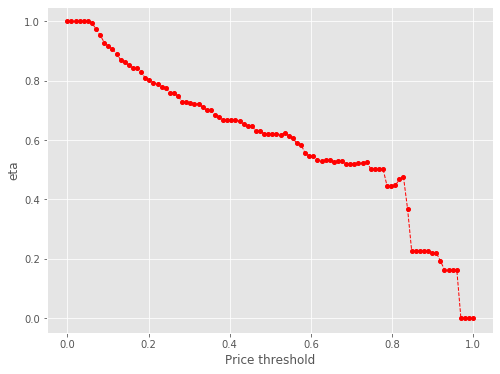

time: 636 ms


In [28]:
lval = np.linspace(0, max(vals_cut), 100)
etas = []

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)
vals_cut = vals[vals>0.06*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.06*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))

for i in tqdm_notebook(lval):
    loubar_keys = keys[vals_cut>=i]
    dist_mat = mat[keys.reshape(-1,1), keys]

    total_dist = dist_mat.sum()
    dist_corr = dist_mat[dist_mat>0]

    loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

    loubar_dist = loubar_dist_mat.sum()

    loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
    eta = loubar_dist_corr.mean()/dist_corr.mean()
    etas.append(eta)
    print('eta = ', eta)
etas = np.array(etas)
etas = np.where(np.isnan(etas), 0, etas)
lval = lval/lval.max()
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lval, etas, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
plt.xlabel("Price threshold")
plt.ylabel("eta")
plt.show()

etas_cut_threshold = etas

In [29]:
pickle_in = open("etas_cut_threshold_dict.pickle","rb")
etas_cut_threshold_dict = pickle.load(pickle_in)
#etas_cut_threshold_dict = {}
etas_cut_threshold_dict['Budapest'] = etas_cut_threshold


pickle_out = open("etas_cut_threshold_dict.pickle","wb")
pickle.dump(etas_cut_threshold_dict, pickle_out)
pickle_out.close()

etas_cut_threshold_dict

{'NY': array([1.        , 1.        , 1.        , 1.        , 1.        ,
        0.99991145, 0.98955316, 0.97868522, 0.96344498, 0.95205618,
        0.94615067, 0.93194961, 0.92540239, 0.92150344, 0.91822455,
        0.91569734, 0.91218202, 0.90337978, 0.898264  , 0.89376519,
        0.89441924, 0.88573077, 0.88617046, 0.87902683, 0.87195329,
        0.87101443, 0.87158631, 0.86935351, 0.86321974, 0.86053312,
        0.86079304, 0.86069179, 0.86140605, 0.85888874, 0.8617884 ,
        0.85709178, 0.8579834 , 0.85179248, 0.84947743, 0.84847717,
        0.84228408, 0.82983947, 0.82767187, 0.82334824, 0.81678545,
        0.81788964, 0.81304395, 0.807866  , 0.79902867, 0.79698224,
        0.78820712, 0.76853775, 0.76312442, 0.75071909, 0.7481045 ,
        0.73389742, 0.71700231, 0.70245218, 0.68328343, 0.67990807,
        0.66811743, 0.61552082, 0.58620924, 0.57826542, 0.57372339,
        0.55441141, 0.5326264 , 0.53706259, 0.53126932, 0.52772792,
        0.5331439 , 0.51700595, 0.49034259

time: 24 ms


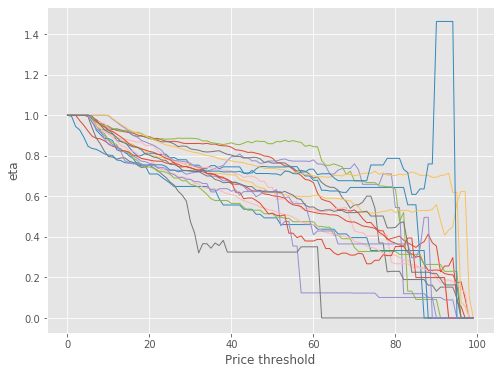

time: 223 ms


In [30]:
fig, ax = plt.subplots(figsize=(8, 6))
for key in etas_cut_threshold_dict:
    plt.plot(np.arange(100), etas_cut_threshold_dict[key], linestyle='-', linewidth=1)
plt.xlabel("Price threshold")
plt.ylabel("eta")
plt.show()

3371 260
Number of cells with price above 1.0th percentile:  260


eta =  1.0
eta =  0.9318060803296075
eta =  0.8949054035606079
eta =  0.8633803892338785
eta =  0.8417337861609195
eta =  0.8226420304582882
eta =  0.8011437188387625
eta =  0.7849465697815068
eta =  0.764252114210972
eta =  0.7540899011537139
eta =  0.7460227244578771
eta =  0.7332457823880748
eta =  0.7203980978111313
eta =  0.7109120740775221
eta =  0.7010303196913923
eta =  0.6944328225241864
eta =  0.6943764639346639
eta =  0.6828941756933853
eta =  0.6746066098730922
eta =  0.6611873200710298
eta =  0.6567112852085356
eta =  0.6497850655824329
eta =  0.6412877768450704
eta =  0.6394415323043567
eta =  0.6323632824017709
eta =  0.6241259332502088
eta =  0.617388582727008
eta =  0.6117574439893511
eta =  0.5997407236040065
eta =  0.5979633383745073
eta =  0.5946966326409885
eta =  0.5946966326409885
eta =  0.5914917321041291
eta =  0.5762967053992404
eta =  0.5762967053992404
eta =  0.5762967053992404
eta =  0.5621790344271723
eta =  0.5501078905654058
eta =  0.5490825938729688
eta

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning:

Mean of empty slice.



eta =  nan
eta =  nan
eta =  nan
eta =  nan


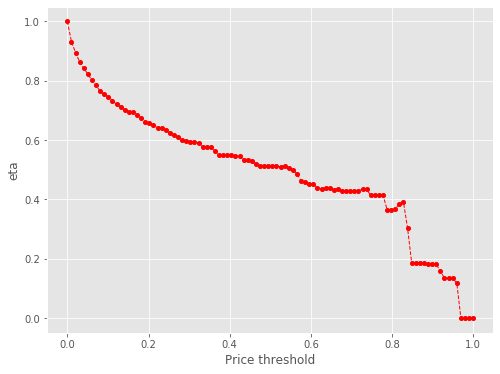

3371 224
Number of cells with price above 2.0th percentile:  224


eta =  1.0
eta =  0.9490303167014842
eta =  0.9234722019699823
eta =  0.8958435129701684
eta =  0.8786553208296406
eta =  0.8597751568173649
eta =  0.8423926247657109
eta =  0.8201836523116841
eta =  0.8092777210543313
eta =  0.8006201507012991
eta =  0.7869081323537875
eta =  0.7731201942321573
eta =  0.7629399389903652
eta =  0.7523349916791883
eta =  0.7491545713812459
eta =  0.7451941756905496
eta =  0.7328715599836237
eta =  0.7239774714009848
eta =  0.7095760953149696
eta =  0.7047724833221063
eta =  0.6973393706044337
eta =  0.6882202106024333
eta =  0.686238849265898
eta =  0.6810769378196109
eta =  0.6698023831626393
eta =  0.6625719618706709
eta =  0.6612951772885122
eta =  0.6436325500171242
eta =  0.6417250874377102
eta =  0.6382193089259802
eta =  0.6382193089259802
eta =  0.634779858803777
eta =  0.6221805226804429
eta =  0.6184727890972627
eta =  0.6184727890972627
eta =  0.6033219210463973
eta =  0.5903673545152403
eta =  0.5892670218236201
eta =  0.5904652382475716
eta

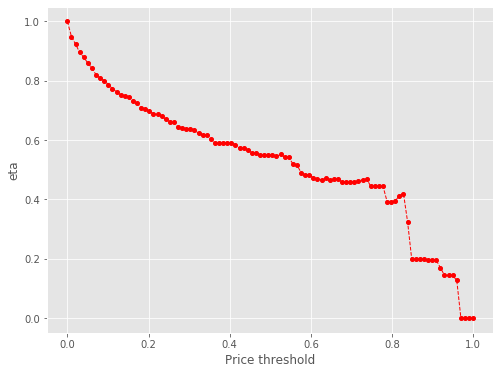

3371 205
Number of cells with price above 3.0th percentile:  205


eta =  1.0
eta =  0.9647727969891576
eta =  0.9405840916949081
eta =  0.9192502662127175
eta =  0.8952272672074715
eta =  0.8771279809669246
eta =  0.8540032400857133
eta =  0.842647611863082
eta =  0.8336330538285239
eta =  0.8193556318585972
eta =  0.8071800954259924
eta =  0.7943991300633321
eta =  0.7833568966084745
eta =  0.7800453343362664
eta =  0.775921635037526
eta =  0.764473456869265
eta =  0.7591320223333236
eta =  0.7417952870420466
eta =  0.7388348728707285
eta =  0.728000630598416
eta =  0.7165983960914131
eta =  0.7145353349752684
eta =  0.7091605764224249
eta =  0.6970556998943627
eta =  0.6959616280535569
eta =  0.6885631315202456
eta =  0.6701722005675529
eta =  0.668186085362049
eta =  0.6661894960321081
eta =  0.6645357490018915
eta =  0.6609544760269961
eta =  0.653980339495657
eta =  0.6439749979230183
eta =  0.6439749979230183
eta =  0.628199396484143
eta =  0.6231059930353333
eta =  0.6147106592234913
eta =  0.6152039772995007
eta =  0.6148125791097595
eta =  0

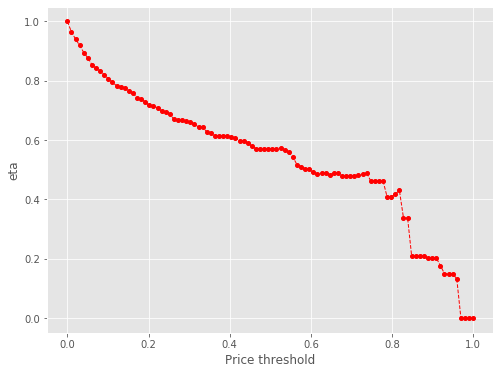

3371 192
Number of cells with price above 4.0th percentile:  192


eta =  1.0
eta =  0.97492808112984
eta =  0.9528152836413859
eta =  0.9279151215719159
eta =  0.9098272152002589
eta =  0.8909745006687283
eta =  0.8734156005360005
eta =  0.8640718897030556
eta =  0.849273149507972
eta =  0.8366530419856602
eta =  0.8234053992219473
eta =  0.811959975502168
eta =  0.8085274965988005
eta =  0.8042532267275836
eta =  0.7955010941091584
eta =  0.7909540038306315
eta =  0.7688808073331105
eta =  0.7658122981664374
eta =  0.7564474401360926
eta =  0.7447202335431572
eta =  0.7427638904493971
eta =  0.7403723606124747
eta =  0.7225076225923027
eta =  0.7213736023916709
eta =  0.7137049610738392
eta =  0.6946425134073141
eta =  0.69258387824295
eta =  0.6905143865075156
eta =  0.6888002554339845
eta =  0.6888002554339845
eta =  0.685088217754158
eta =  0.6674887599782268
eta =  0.6674887599782268
eta =  0.6674887599782268
eta =  0.6511371365824309
eta =  0.6371558787124463
eta =  0.6359683410926182
eta =  0.6372615200474697
eta =  0.6372615200474697
eta =  0

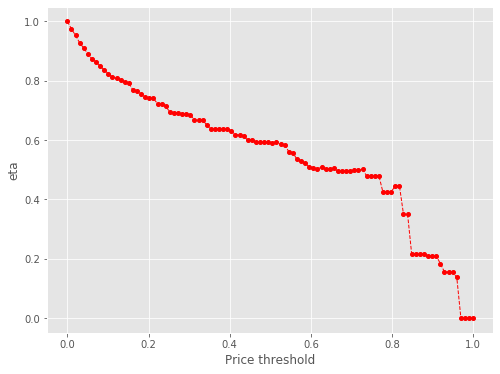

3371 180
Number of cells with price above 5.0th percentile:  180


eta =  1.0
eta =  0.977318534652497
eta =  0.9517780229456095
eta =  0.9332249555740194
eta =  0.9138874117116226
eta =  0.9004353190618013
eta =  0.8862929547599926
eta =  0.8711136400171723
eta =  0.8604141424503849
eta =  0.8445806569318491
eta =  0.8328408948495883
eta =  0.829320143965698
eta =  0.8249359540403616
eta =  0.8159587455797309
eta =  0.8112947192104655
eta =  0.7886538732601258
eta =  0.7855064522081883
eta =  0.7759007610689076
eta =  0.7688943663449311
eta =  0.7618653158380783
eta =  0.7596719328812954
eta =  0.7410881239106292
eta =  0.741476632531049
eta =  0.7334724979293845
eta =  0.7267825695574461
eta =  0.7125064164756603
eta =  0.7103948400381672
eta =  0.7065139149912851
eta =  0.7065139149912851
eta =  0.7027064160057962
eta =  0.6887588494463203
eta =  0.6846543585088624
eta =  0.6846543585088624
eta =  0.6678822255564029
eta =  0.6555383526757066
eta =  0.6505150843825789
eta =  0.6536497741545716
eta =  0.6536497741545716
eta =  0.6536497741545716
eta 

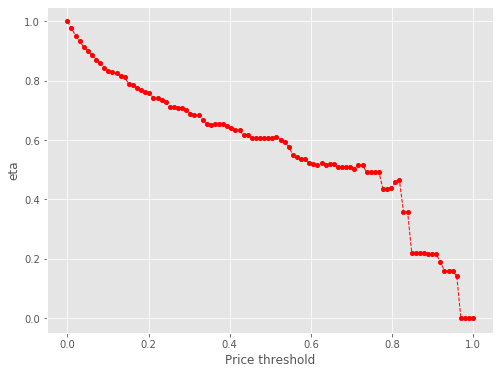

3371 171
Number of cells with price above 6.000000000000001th percentile:  171


eta =  1.0
eta =  0.9738667478398239
eta =  0.9541775653551503
eta =  0.9350967768523611
eta =  0.9166683359633542
eta =  0.9068619117871635
eta =  0.8913303177319892
eta =  0.8803825077934498
eta =  0.8641815610630518
eta =  0.852169344302592
eta =  0.8485668843480775
eta =  0.8440809467853613
eta =  0.8367078595680525
eta =  0.8301231281763584
eta =  0.8087922133814661
eta =  0.8037363708522003
eta =  0.7939077522404636
eta =  0.7898758409176372
eta =  0.7795465744533056
eta =  0.7773022877862541
eta =  0.7686979986294715
eta =  0.7586847135716036
eta =  0.7504948201869349
eta =  0.7490486071405824
eta =  0.7290421609869546
eta =  0.7268815793929057
eta =  0.7229105864062004
eta =  0.7229105864062004
eta =  0.7190147235421622
eta =  0.711427957687775
eta =  0.7005437165399748
eta =  0.7005437165399748
eta =  0.6833823383835449
eta =  0.6778415149146604
eta =  0.6687087094965771
eta =  0.6692453621298604
eta =  0.6688195823350351
eta =  0.6688195823350351
eta =  0.6626403492995069
eta

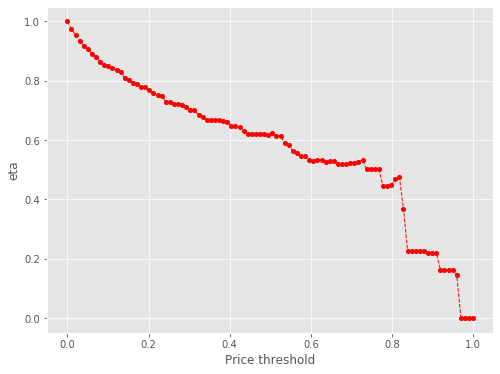

3371 161
Number of cells with price above 6.999999999999999th percentile:  161


eta =  1.0
eta =  0.9654260344811135
eta =  0.9539513276328697
eta =  0.9412666958766751
eta =  0.9311971209600423
eta =  0.9152487439468363
eta =  0.8992120650403777
eta =  0.8873714632724964
eta =  0.8750369043740591
eta =  0.8713377741157304
eta =  0.8667314585467198
eta =  0.8572994184657275
eta =  0.8523990884971588
eta =  0.8286111406726548
eta =  0.8253042550585106
eta =  0.8152118901291834
eta =  0.8110717843788127
eta =  0.8004653369492815
eta =  0.7981608259142455
eta =  0.7817266735624788
eta =  0.7790436579280225
eta =  0.770633992639794
eta =  0.7691489711524494
eta =  0.7486056615076699
eta =  0.7463871017315595
eta =  0.7423095490319592
eta =  0.7423095490319592
eta =  0.7383091425362248
eta =  0.7305187894194193
eta =  0.7193424748240775
eta =  0.7193424748240775
eta =  0.7017205792264546
eta =  0.6960310703884387
eta =  0.6866531904697115
eta =  0.6872042439218123
eta =  0.6867670385281897
eta =  0.6867670385281897
eta =  0.6867670385281897
eta =  0.6804219887056809
et

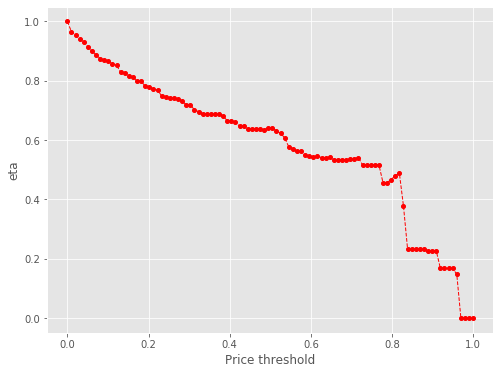

3371 155
Number of cells with price above 8.0th percentile:  155


eta =  1.0
eta =  0.9736358417665354
eta =  0.9606894662443305
eta =  0.9504121085152786
eta =  0.9341346412816057
eta =  0.9226610850630999
eta =  0.9056821208549359
eta =  0.8980814754268255
eta =  0.889317581085902
eta =  0.8846162155061669
eta =  0.8768890507885972
eta =  0.8699881010798884
eta =  0.847632812536762
eta =  0.84233417346492
eta =  0.8366318301019315
eta =  0.8278080198035687
eta =  0.8169827113501185
eta =  0.8146306473857806
eta =  0.8085029685641353
eta =  0.7947023866755971
eta =  0.7934550523474871
eta =  0.7850201412582807
eta =  0.7640529262659838
eta =  0.761788587140336
eta =  0.7595123066279529
eta =  0.7576268953013259
eta =  0.7576268953013259
eta =  0.7535439415561409
eta =  0.7341859020540149
eta =  0.7341859020540149
eta =  0.7341859020540149
eta =  0.7162003836562496
eta =  0.7008220836209662
eta =  0.6995158842796245
eta =  0.7009382809017278
eta =  0.7009382809017278
eta =  0.7009382809017278
eta =  0.6944623027820491
eta =  0.6929435790085307
eta = 

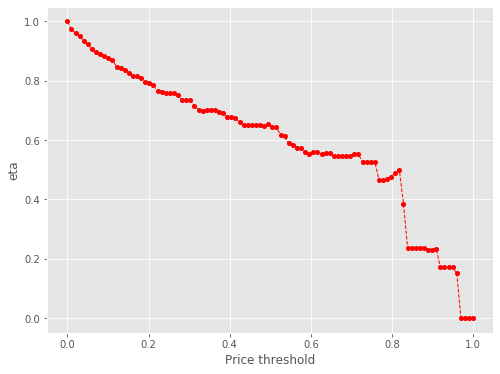

3371 147
Number of cells with price above 9.0th percentile:  147


eta =  1.0
eta =  0.986703061897644
eta =  0.9761474133808381
eta =  0.9594291841051579
eta =  0.9426183904703799
eta =  0.9302062249595225
eta =  0.9172762582608607
eta =  0.9133985653941735
eta =  0.9085698960107569
eta =  0.8986825570996649
eta =  0.8935456807972562
eta =  0.8705850546738735
eta =  0.8651429387979538
eta =  0.8545634001600965
eta =  0.8502234452478853
eta =  0.8391050085705655
eta =  0.836689255304878
eta =  0.8303956509008665
eta =  0.8162213761910336
eta =  0.8149402664838902
eta =  0.8062769544658133
eta =  0.7847419882157474
eta =  0.7824163352061587
eta =  0.7800784174603892
eta =  0.77814195287502
eta =  0.77814195287502
eta =  0.7739484407116048
eta =  0.7557617261361872
eta =  0.7540662232831632
eta =  0.7540662232831632
eta =  0.7355936921516748
eta =  0.7219983684848444
eta =  0.7164658294697029
eta =  0.7199183214434327
eta =  0.7199183214434327
eta =  0.7199183214434327
eta =  0.7132669864762144
eta =  0.711707138627184
eta =  0.6978431787838104
eta =  0

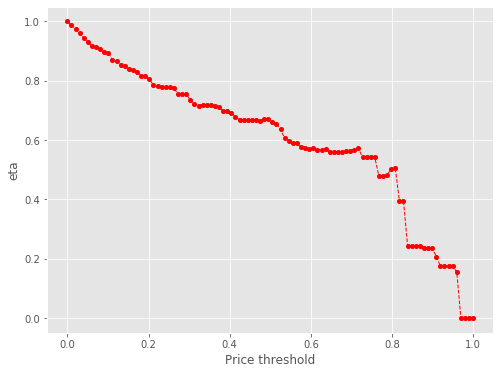

3371 142
Number of cells with price above 10.0th percentile:  142


eta =  1.0
eta =  0.9893021021982996
eta =  0.9723585759022249
eta =  0.9553212378377749
eta =  0.9427418043788516
eta =  0.929637591776334
eta =  0.9257076426189558
eta =  0.9208139014622899
eta =  0.9107933194930027
eta =  0.9055872179810347
eta =  0.8823171714898195
eta =  0.8768017169563621
eta =  0.8708660389216264
eta =  0.8616811663812224
eta =  0.8504128962129545
eta =  0.8479645879437561
eta =  0.8415861701126534
eta =  0.8272208810432421
eta =  0.8259225069359604
eta =  0.817142447004439
eta =  0.7953172727634171
eta =  0.792960278953024
eta =  0.7905908551252788
eta =  0.7886282944926555
eta =  0.7886282944926555
eta =  0.784378270016852
eta =  0.7688096514875793
eta =  0.7642281172543748
eta =  0.7642281172543748
eta =  0.7455066479037459
eta =  0.7394621242178028
eta =  0.7294990819049195
eta =  0.7300845200751158
eta =  0.7296200338720685
eta =  0.7296200338720685
eta =  0.7296200338720685
eta =  0.7228790646544132
eta =  0.7072474037343176
eta =  0.7072474037343176
eta =

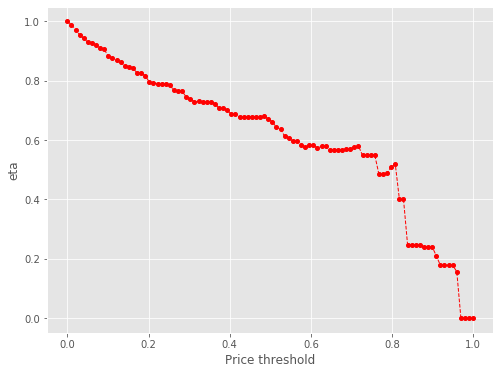

3371 137
Number of cells with price above 11.0th percentile:  137


eta =  1.0
eta =  0.9766527858433568
eta =  0.9599293781599015
eta =  0.9529362186575893
eta =  0.9396903025987846
eta =  0.9357178566203059
eta =  0.9307711966002862
eta =  0.920642256262425
eta =  0.9153798581532937
eta =  0.889834302557096
eta =  0.8862830827995274
eta =  0.8754450285335066
eta =  0.8709990249353615
eta =  0.8596089044218914
eta =  0.8571341211744303
eta =  0.8506867298094172
eta =  0.8361661005319796
eta =  0.8348536863519261
eta =  0.8259786825365988
eta =  0.8039175000196256
eta =  0.8015350186672099
eta =  0.7991399728844503
eta =  0.7971561899446764
eta =  0.7971561899446764
eta =  0.7928602074875892
eta =  0.7771232364504529
eta =  0.7724921594285563
eta =  0.7724921594285563
eta =  0.7535682439642826
eta =  0.747458357335606
eta =  0.7373875788638482
eta =  0.7379793477167552
eta =  0.737509838754816
eta =  0.737509838754816
eta =  0.737509838754816
eta =  0.7306959755246901
eta =  0.7148952803827704
eta =  0.7148952803827704
eta =  0.7148952803827704
eta =  

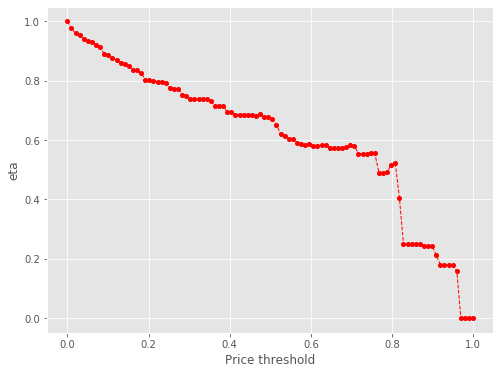

3371 133
Number of cells with price above 12.0th percentile:  133


eta =  1.0
eta =  0.9824783382522836
eta =  0.969541306821002
eta =  0.9560645782485631
eta =  0.9520229116712597
eta =  0.9469900551942908
eta =  0.9366846162156821
eta =  0.9313305198555638
eta =  0.9073989712808791
eta =  0.9017267278614803
eta =  0.895622315166577
eta =  0.8861763424893868
eta =  0.8745877470395935
eta =  0.872069840240729
eta =  0.865510101900185
eta =  0.8507364479977837
eta =  0.8494011647602424
eta =  0.8403715123777615
eta =  0.8231706245217106
eta =  0.8179259097143912
eta =  0.8155019131880006
eta =  0.8110467825728886
eta =  0.8110467825728886
eta =  0.8066759418345737
eta =  0.7981642086381848
eta =  0.7859529768072118
eta =  0.7859529768072118
eta =  0.7859529768072118
eta =  0.7666993086496005
eta =  0.7502366924959111
eta =  0.7488383937029773
eta =  0.7503610827878738
eta =  0.7503610827878738
eta =  0.7503610827878738
eta =  0.7434284867428392
eta =  0.7418026785280462
eta =  0.7273524615937923
eta =  0.7273524615937923
eta =  0.7210890119131799
eta =

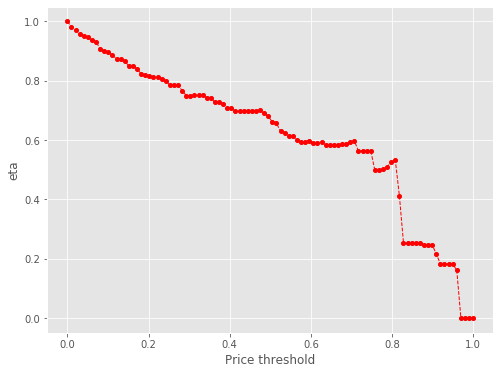

3371 128
Number of cells with price above 13.0th percentile:  128


eta =  1.0
eta =  0.9868322476663505
eta =  0.9731151731541403
eta =  0.9690014269065712
eta =  0.9638788137343339
eta =  0.9533895860563569
eta =  0.9479400039621169
eta =  0.9235816566653652
eta =  0.9178082536308626
eta =  0.9115949739510658
eta =  0.9019805404216779
eta =  0.8901852722731627
eta =  0.8876224607578029
eta =  0.8809457350884989
eta =  0.8659086056911406
eta =  0.864549508817904
eta =  0.8570102900089424
eta =  0.8491935859466097
eta =  0.832512919490304
eta =  0.8300456930568922
eta =  0.8255111089936578
eta =  0.8255111089936578
eta =  0.8255486981390465
eta =  0.8123987853595097
eta =  0.7999697766419278
eta =  0.7999697766419278
eta =  0.7999697766419278
eta =  0.7803727357627759
eta =  0.7659498008781233
eta =  0.7600804702231371
eta =  0.7637431316019447
eta =  0.7637431316019447
eta =  0.7637431316019447
eta =  0.7602711537126995
eta =  0.7566868986295548
eta =  0.7403241713070936
eta =  0.7403241713070936
eta =  0.7339490183528266
eta =  0.719522700042933
eta 

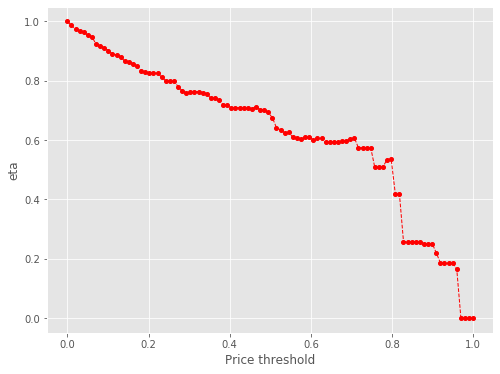

3371 124
Number of cells with price above 14.000000000000002th percentile:  124


eta =  1.0
eta =  0.9860998923123477
eta =  0.9819312544741566
eta =  0.9767402879402284
eta =  0.9661110977178965
eta =  0.9605887993666548
eta =  0.9359054275429693
eta =  0.9300549873611093
eta =  0.9237588010594456
eta =  0.9140160777626298
eta =  0.9020634199766602
eta =  0.8994664116994984
eta =  0.892700595437319
eta =  0.8774628187706991
eta =  0.8760855868486065
eta =  0.8684457688078094
eta =  0.8605247629014687
eta =  0.8436215187120415
eta =  0.8411213709521297
eta =  0.8365262798675428
eta =  0.8365262798675428
eta =  0.836564370582026
eta =  0.8320181266743112
eta =  0.8106441378802599
eta =  0.8106441378802599
eta =  0.8106441378802599
eta =  0.7907856047552076
eta =  0.784373961972563
eta =  0.7722885907704538
eta =  0.774426801361747
eta =  0.7739341042087302
eta =  0.7739341042087302
eta =  0.7739341042087302
eta =  0.7667837167045962
eta =  0.7502026540557463
eta =  0.7502026540557463
eta =  0.7502026540557463
eta =  0.7437424345307531
eta =  0.7291236192822559
eta =

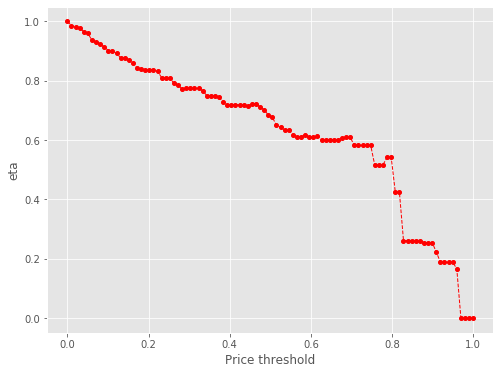

3371 121
Number of cells with price above 15.000000000000002th percentile:  121


eta =  1.0
eta =  0.9957726008585034
eta =  0.9905084622307668
eta =  0.9797294424730352
eta =  0.9741293015600367
eta =  0.9469442220444244
eta =  0.9431650835902472
eta =  0.9367801459680561
eta =  0.9269000888128225
eta =  0.914778945834152
eta =  0.9121453300134748
eta =  0.9052841425060775
eta =  0.889831573465746
eta =  0.8884349280215781
eta =  0.880687418767843
eta =  0.8789903229311744
eta =  0.8555132449449897
eta =  0.8529778549916969
eta =  0.8483179912999854
eta =  0.8483179912999854
eta =  0.8483179912999854
eta =  0.8437462909799902
eta =  0.8239194237612755
eta =  0.8220710134947341
eta =  0.8220710134947341
eta =  0.8019325536086012
eta =  0.7954305320257677
eta =  0.784713406985841
eta =  0.7832508501410981
eta =  0.7848435135652425
eta =  0.7848435135652425
eta =  0.7848435135652425
eta =  0.777592333882658
eta =  0.7676118063245744
eta =  0.7607775438414905
eta =  0.7607775438414905
eta =  0.7542262607764003
eta =  0.7394013780617121
eta =  0.7396190734527549
eta = 

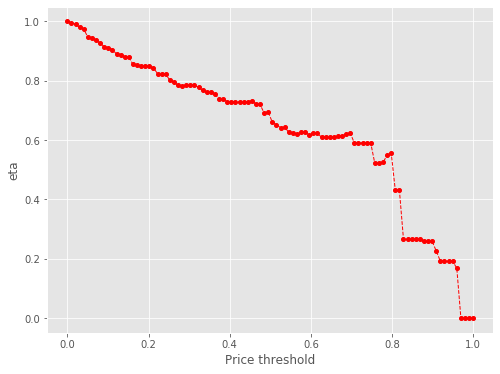

3371 117
Number of cells with price above 16.0th percentile:  117


eta =  1.0
eta =  0.9999188422728671
eta =  0.9833840704866751
eta =  0.9782823143822846
eta =  0.9559407176301764
eta =  0.9521256752635727
eta =  0.940482454336933
eta =  0.9357061540100253
eta =  0.9234698534468178
eta =  0.9208112168144035
eta =  0.9138848442182899
eta =  0.8982854671971676
eta =  0.8968755528462564
eta =  0.8890544379553791
eta =  0.8873412187665133
eta =  0.8636410955116083
eta =  0.8610816179468257
eta =  0.8563774829642011
eta =  0.8563774829642011
eta =  0.8563774829642011
eta =  0.8517623489542475
eta =  0.8317471154946707
eta =  0.8298811443048812
eta =  0.8298811443048812
eta =  0.8095513578746376
eta =  0.8029875634786788
eta =  0.792168619803748
eta =  0.7906921678573808
eta =  0.7922999624678522
eta =  0.7922999624678522
eta =  0.7922999624678522
eta =  0.7849798925544735
eta =  0.7832632153211946
eta =  0.7680053526770865
eta =  0.7680053526770865
eta =  0.7613918287874534
eta =  0.7464261014603825
eta =  0.7464261014603825
eta =  0.7363695303150973
eta

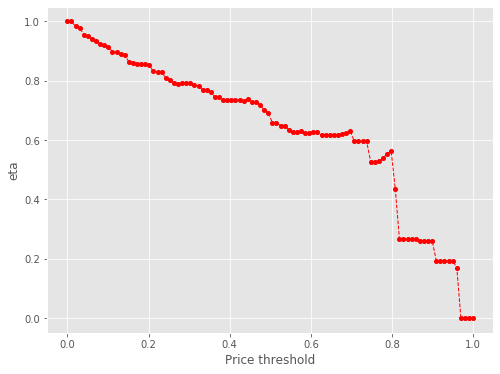

3371 116
Number of cells with price above 17.0th percentile:  116


eta =  1.0
eta =  0.9834638861803948
eta =  0.9715286230331794
eta =  0.9560183059029809
eta =  0.9522029538910798
eta =  0.9405587879503978
eta =  0.9357820999583495
eta =  0.9235448062441979
eta =  0.9208859538253645
eta =  0.913959019054969
eta =  0.8983583759211082
eta =  0.8969483471354656
eta =  0.887413239208035
eta =  0.86924949212146
eta =  0.8637111923488785
eta =  0.8611515070458546
eta =  0.8564469902553401
eta =  0.8564469902553401
eta =  0.8564469902553401
eta =  0.8518314816611994
eta =  0.8318146236789244
eta =  0.829948501038863
eta =  0.829948501038863
eta =  0.8096170645554449
eta =  0.8030527374136152
eta =  0.7922329156265401
eta =  0.7907563438449633
eta =  0.7923642689509816
eta =  0.7923642689509816
eta =  0.7923642689509816
eta =  0.7850436049091482
eta =  0.7833267883429388
eta =  0.7680676873048723
eta =  0.7680676873048723
eta =  0.761453626633108
eta =  0.7464866846230414
eta =  0.7464866846230414
eta =  0.7364292972430557
eta =  0.7364292972430557
eta =  0

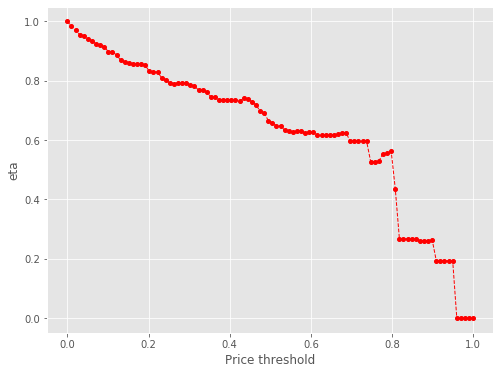

3371 111
Number of cells with price above 18.000000000000004th percentile:  111


eta =  1.0
eta =  0.9720929454928866
eta =  0.9682134415624277
eta =  0.9616589342583504
eta =  0.9515164848531112
eta =  0.9390734313906407
eta =  0.9363698726161951
eta =  0.9360498297332245
eta =  0.9134635125344339
eta =  0.9139423873640372
eta =  0.9040765095120847
eta =  0.9023343426006175
eta =  0.8782337658613828
eta =  0.8756310416139625
eta =  0.8730145914469342
eta =  0.8708474223508434
eta =  0.8708474223508434
eta =  0.866154307881672
eta =  0.8570149819228181
eta =  0.8439033834401797
eta =  0.8439033834401797
eta =  0.8439033834401797
eta =  0.8232300910406165
eta =  0.8165553902874201
eta =  0.8055536423441403
eta =  0.806200115879292
eta =  0.8056872042636853
eta =  0.8056872042636853
eta =  0.8056872042636853
eta =  0.7982434494449238
eta =  0.7964977660595609
eta =  0.7809820961376789
eta =  0.7809820961376789
eta =  0.774256825627287
eta =  0.7590382271404675
eta =  0.7590382271404675
eta =  0.7488117332942655
eta =  0.7488117332942655
eta =  0.7488117332942655
eta 

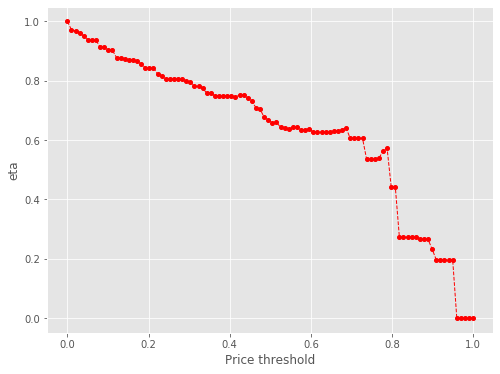

3371 109
Number of cells with price above 19.0th percentile:  109


eta =  1.0
eta =  0.9801079775892103
eta =  0.9801079775892103
eta =  0.9681225706082734
eta =  0.9593804102557977
eta =  0.95060998137227
eta =  0.9478732092836287
eta =  0.9407432754801663
eta =  0.9246854437663106
eta =  0.9232340930266479
eta =  0.9134195515902246
eta =  0.9068358285200253
eta =  0.8890228984219863
eta =  0.8863881996160651
eta =  0.8837396062671327
eta =  0.8815458134228238
eta =  0.8815458134228238
eta =  0.8767950438780926
eta =  0.8593921043930381
eta =  0.8542707660508307
eta =  0.8542707660508307
eta =  0.8418203278796751
eta =  0.8333435015303662
eta =  0.8154498970428007
eta =  0.8116738213329187
eta =  0.8155850997752033
eta =  0.8155850997752033
eta =  0.8155850997752033
eta =  0.8155850997752033
eta =  0.8080498981678871
eta =  0.7905764885309421
eta =  0.7905764885309421
eta =  0.7905764885309421
eta =  0.7837685978368781
eta =  0.7683630383348444
eta =  0.7683630383348444
eta =  0.7580109116537118
eta =  0.7580109116537118
eta =  0.7580109116537118
eta

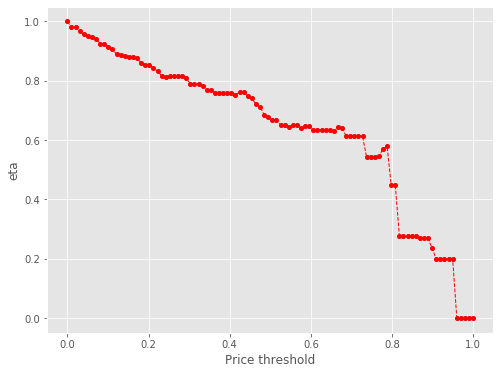

3371 104
Number of cells with price above 20.0th percentile:  104


eta =  1.0
eta =  0.98533604372217
eta =  0.9724579186390969
eta =  0.9699033199489948
eta =  0.9671110030296152
eta =  0.959836361901808
eta =  0.9434526245167155
eta =  0.9419718175313132
eta =  0.9319580826563411
eta =  0.9128825830348047
eta =  0.9070662812160069
eta =  0.9043781092327505
eta =  0.9016757607063697
eta =  0.8994374432000628
eta =  0.8994374432000628
eta =  0.8945902532440982
eta =  0.8851508821648189
eta =  0.8716088283987815
eta =  0.8716088283987815
eta =  0.8716088283987815
eta =  0.8502568294364429
eta =  0.834542289032611
eta =  0.8281473469172324
eta =  0.8326677582355279
eta =  0.8321380076726985
eta =  0.8321380076726985
eta =  0.8321380076726985
eta =  0.8244498735286926
eta =  0.8226468791573835
eta =  0.8066218280107644
eta =  0.8066218280107644
eta =  0.7996757660974542
eta =  0.7839575392752145
eta =  0.7839575392752145
eta =  0.7733953084620383
eta =  0.7733953084620383
eta =  0.7733953084620383
eta =  0.7733953084620383
eta =  0.7733953084620383
eta =

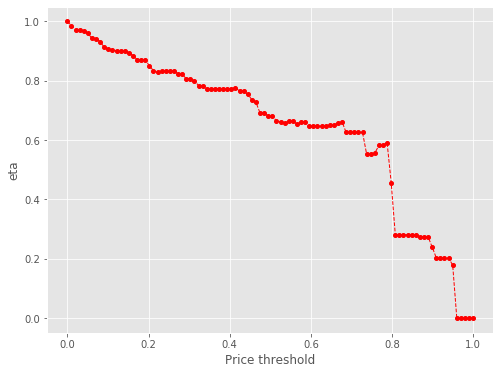

3371 103
Number of cells with price above 21.000000000000004th percentile:  103


eta =  1.0
eta =  0.9894531740475523
eta =  0.9765140196143157
eta =  0.9737026707273732
eta =  0.973369867826501
eta =  0.9498830406425894
eta =  0.9503810080742263
eta =  0.9483921407231375
eta =  0.9383101538972493
eta =  0.913248694079563
eta =  0.913248694079563
eta =  0.9105421999633018
eta =  0.905567859172917
eta =  0.905567859172917
eta =  0.905567859172917
eta =  0.9006876315766428
eta =  0.879522721854708
eta =  0.8775495691630151
eta =  0.8775495691630151
eta =  0.8647598576486002
eta =  0.8560520385280953
eta =  0.8376708348947005
eta =  0.8337918614544029
eta =  0.8378097218896495
eta =  0.8378097218896495
eta =  0.8378097218896495
eta =  0.8378097218896495
eta =  0.8300691867023979
eta =  0.8194151099683422
eta =  0.8121196281922832
eta =  0.8121196281922832
eta =  0.8051262230765927
eta =  0.7893008634353844
eta =  0.7893008634353844
eta =  0.7786666422142309
eta =  0.7786666422142309
eta =  0.7786666422142309
eta =  0.7786666422142309
eta =  0.7786666422142309
eta =  0

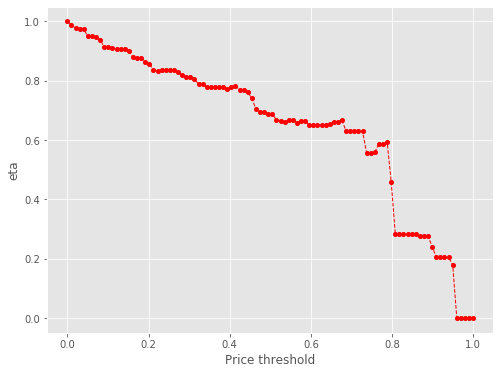

3371 100
Number of cells with price above 22.0th percentile:  100


eta =  1.0
eta =  0.9869229239213955
eta =  0.9840816081717656
eta =  0.9766793135876911
eta =  0.9600080787622385
eta =  0.9605113541518153
eta =  0.9501427709385928
eta =  0.9483118337565258
eta =  0.9229832376440211
eta =  0.920247894337991
eta =  0.9174981257226503
eta =  0.915220530819578
eta =  0.915220530819578
eta =  0.910288283671074
eta =  0.9006832730334865
eta =  0.8869035869309777
eta =  0.8869035869309777
eta =  0.8869035869309777
eta =  0.8651769088033207
eta =  0.8581621057395284
eta =  0.8465997753769828
eta =  0.8450218740881652
eta =  0.8467401428027408
eta =  0.8467401428027408
eta =  0.8467401428027408
eta =  0.8467401428027408
eta =  0.8389170993376444
eta =  0.8281494581662353
eta =  0.8207762120466485
eta =  0.8207762120466485
eta =  0.8137082624972195
eta =  0.7977142164359273
eta =  0.7977142164359273
eta =  0.7869666424222403
eta =  0.7869666424222403
eta =  0.7869666424222403
eta =  0.7869666424222403
eta =  0.7869666424222403
eta =  0.7869666424222403
eta =

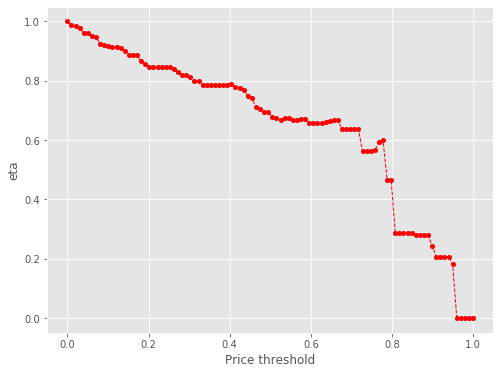

3371 97
Number of cells with price above 23.0th percentile:  97


eta =  1.0
eta =  0.9967802287272266
eta =  0.9860834795772888
eta =  0.9732384676357121
eta =  0.9712017663583722
eta =  0.9608772993016983
eta =  0.941209875519151
eta =  0.9352130903765826
eta =  0.9324415028090737
eta =  0.929655298791829
eta =  0.9273475249547164
eta =  0.9273475249547164
eta =  0.9223499237956447
eta =  0.9126176433867316
eta =  0.8986553715937559
eta =  0.8986553715937559
eta =  0.8986553715937559
eta =  0.8766408073344425
eta =  0.8695330556612725
eta =  0.8578175203521884
eta =  0.8562187113159688
eta =  0.8579597476957384
eta =  0.8579597476957384
eta =  0.8579597476957384
eta =  0.8540594608707505
eta =  0.8500330461514954
eta =  0.8316517857194086
eta =  0.8316517857194086
eta =  0.8316517857194086
eta =  0.8244901833509627
eta =  0.8082842105504301
eta =  0.8082842105504301
eta =  0.7973942273985716
eta =  0.7973942273985716
eta =  0.7973942273985716
eta =  0.7973942273985716
eta =  0.7973942273985716
eta =  0.7973942273985716
eta =  0.7967027778310263
eta

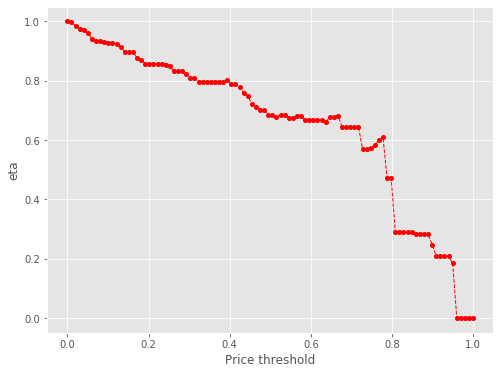

3371 96
Number of cells with price above 24.000000000000004th percentile:  96


eta =  1.0
eta =  0.9889305752832821
eta =  0.97553705992509
eta =  0.9740058944427787
eta =  0.9636516177944906
eta =  0.9567058332679135
eta =  0.9379133092007954
eta =  0.9351337192934992
eta =  0.9323394707347346
eta =  0.9300250337163417
eta =  0.9300250337163417
eta =  0.9250130031006418
eta =  0.9152526229067353
eta =  0.9012500381738402
eta =  0.9012500381738402
eta =  0.9012500381738402
eta =  0.8791719117794032
eta =  0.8720436380615106
eta =  0.860294276762069
eta =  0.8586908515220129
eta =  0.8604369147552927
eta =  0.8604369147552927
eta =  0.8604369147552927
eta =  0.8604369147552927
eta =  0.8524873266315698
eta =  0.850623016985975
eta =  0.8340529944172952
eta =  0.8340529944172952
eta =  0.8268707145222773
eta =  0.8106179505965232
eta =  0.8106179505965232
eta =  0.7996965250516908
eta =  0.7996965250516908
eta =  0.7996965250516908
eta =  0.7996965250516908
eta =  0.7996965250516908
eta =  0.7996965250516908
eta =  0.7950403251889998
eta =  0.8034112538183505
eta =

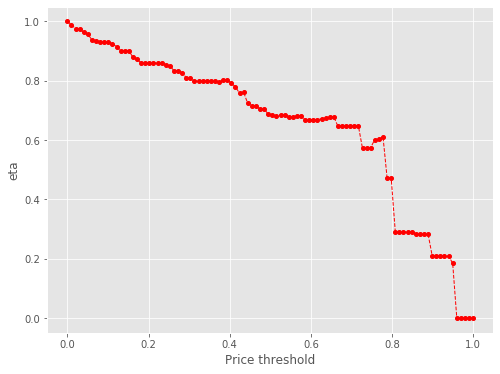

3371 93
Number of cells with price above 25.0th percentile:  93


eta =  1.0
eta =  0.9869737073913021
eta =  0.9849082623052401
eta =  0.9744380868378448
eta =  0.95449309821378
eta =  0.9484116809030072
eta =  0.9456009781329973
eta =  0.9427754526324189
eta =  0.9404351093603647
eta =  0.9404351093603647
eta =  0.935366977439917
eta =  0.9254973461049665
eta =  0.9113380258423848
eta =  0.9113380258423848
eta =  0.9113380258423848
eta =  0.8890127717282498
eta =  0.8818047089015437
eta =  0.8699238331423166
eta =  0.8658955068555776
eta =  0.870068067729444
eta =  0.870068067729444
eta =  0.870068067729444
eta =  0.870068067729444
eta =  0.8620294972550245
eta =  0.8601443197792843
eta =  0.8433888235060164
eta =  0.8433888235060164
eta =  0.8433888235060164
eta =  0.8361261499933075
eta =  0.8196914635431504
eta =  0.808647790895347
eta =  0.808647790895347
eta =  0.808647790895347
eta =  0.808647790895347
eta =  0.808647790895347
eta =  0.808647790895347
eta =  0.8039394726583897
eta =  0.8128470057982168
eta =  0.8124040998410945
eta =  0.80011

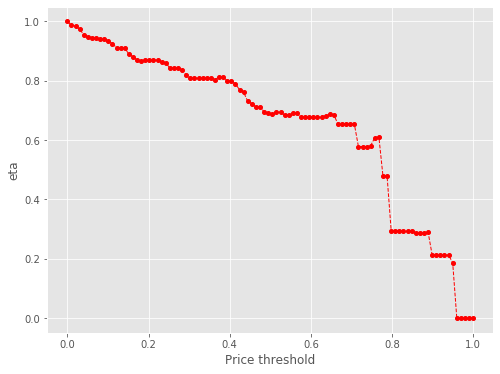

3371 89
Number of cells with price above 26.0th percentile:  89


eta =  1.0
eta =  0.9892051424812375
eta =  0.9872989316132944
eta =  0.9609290235398273
eta =  0.9609290235398273
eta =  0.958081224506316
eta =  0.9528471754795323
eta =  0.9528471754795323
eta =  0.9528471754795323
eta =  0.9477121532570626
eta =  0.9377122603915907
eta =  0.9233660623555696
eta =  0.9233660623555696
eta =  0.9233660623555696
eta =  0.9007461547056045
eta =  0.8934429583056133
eta =  0.8814052761766438
eta =  0.8797625040407422
eta =  0.8815514144030698
eta =  0.8815514144030698
eta =  0.8815514144030698
eta =  0.8815514144030698
eta =  0.8734067491356774
eta =  0.8714966906795885
eta =  0.854520051739981
eta =  0.854520051739981
eta =  0.8471615238903333
eta =  0.8305099288913176
eta =  0.8305099288913176
eta =  0.8193204994616389
eta =  0.8193204994616389
eta =  0.8193204994616389
eta =  0.8193204994616389
eta =  0.8193204994616389
eta =  0.8193204994616389
eta =  0.8145500398215315
eta =  0.8182527817708198
eta =  0.8231263849858601
eta =  0.810677049071908
eta =

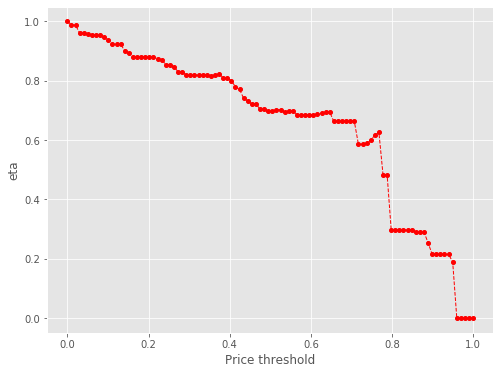

3371 87
Number of cells with price above 27.0th percentile:  87


eta =  1.0
eta =  0.998072987304573
eta =  0.9714153134399557
eta =  0.9685364373492309
eta =  0.9656423790040579
eta =  0.9632452709348963
eta =  0.9632452709348963
eta =  0.9632452709348963
eta =  0.9580542119705349
eta =  0.9390384116523902
eta =  0.9334424405027629
eta =  0.9334424405027629
eta =  0.9334424405027629
eta =  0.9105756895341748
eta =  0.9031927958487735
eta =  0.8910237506103155
eta =  0.8893630514637452
eta =  0.8911714835932432
eta =  0.8911714835932432
eta =  0.8911714835932432
eta =  0.8911714835932432
eta =  0.882937938378382
eta =  0.8810070361073951
eta =  0.8638451369112136
eta =  0.8638451369112136
eta =  0.856406307962963
eta =  0.8395729998007669
eta =  0.8395729998007669
eta =  0.8282614639532964
eta =  0.8282614639532964
eta =  0.8282614639532964
eta =  0.8282614639532964
eta =  0.8282614639532964
eta =  0.8282614639532964
eta =  0.8216676754753117
eta =  0.8275432482810643
eta =  0.8321088818050423
eta =  0.8195236905445873
eta =  0.8180494991974738
eta 

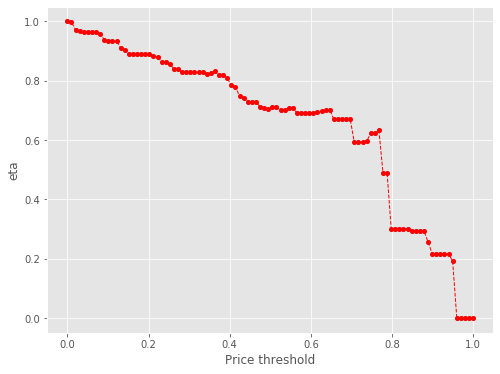

3371 85
Number of cells with price above 28.000000000000004th percentile:  85


eta =  1.0
eta =  0.9803570508157909
eta =  0.9774516750872854
eta =  0.9745309773538766
eta =  0.9721118042518507
eta =  0.9721118042518507
eta =  0.9668729623409785
eta =  0.9668729623409785
eta =  0.9457961564082636
eta =  0.9420346430786906
eta =  0.9420346430786906
eta =  0.9420346430786906
eta =  0.9189574069767401
eta =  0.9115065548234258
eta =  0.8992254952846664
eta =  0.8975495096427903
eta =  0.8993745881283219
eta =  0.8993745881283219
eta =  0.8993745881283219
eta =  0.8993745881283219
eta =  0.8910652543213263
eta =  0.8891165783743775
eta =  0.8717967063797856
eta =  0.8717967063797856
eta =  0.8717967063797856
eta =  0.8642894040876226
eta =  0.8473011477599298
eta =  0.8475506111233551
eta =  0.8358854908620023
eta =  0.8358854908620023
eta =  0.8358854908620023
eta =  0.8358854908620023
eta =  0.8358854908620023
eta =  0.8358854908620023
eta =  0.8310185822462303
eta =  0.8397683236382706
eta =  0.8397683236382706
eta =  0.8270672875136069
eta =  0.8163921466968366
e

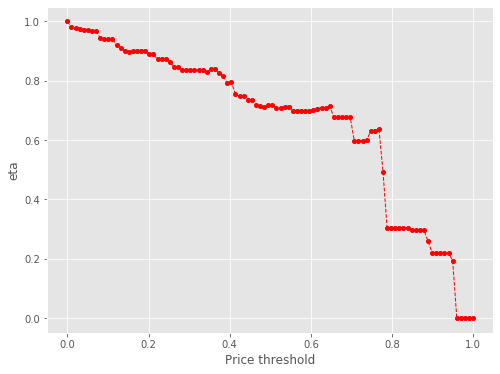

3371 83
Number of cells with price above 29.000000000000004th percentile:  83


eta =  1.0
eta =  0.9970364106362188
eta =  0.9915895473418802
eta =  0.9915895473418802
eta =  0.9915895473418802
eta =  0.9862457372407413
eta =  0.9758392528693621
eta =  0.9609097443577207
eta =  0.9609097443577207
eta =  0.9609097443577207
eta =  0.9373701206229322
eta =  0.9373701206229322
eta =  0.9172428499763307
eta =  0.9129954051505736
eta =  0.9179789564211992
eta =  0.9173949301225706
eta =  0.9173949301225706
eta =  0.9173949301225706
eta =  0.9132244508327465
eta =  0.9089191061357068
eta =  0.897252977508177
eta =  0.8892644834393058
eta =  0.8892644834393058
eta =  0.8816067608922848
eta =  0.8642781189311176
eta =  0.8642781189311176
eta =  0.8526337319310667
eta =  0.8526337319310667
eta =  0.8526337319310667
eta =  0.8526337319310667
eta =  0.8526337319310667
eta =  0.8526337319310667
eta =  0.8526337319310667
eta =  0.8518943821778816
eta =  0.8565943631858094
eta =  0.8565943631858094
eta =  0.8436388424251899
eta =  0.8327498088757427
eta =  0.8079309454665992
et

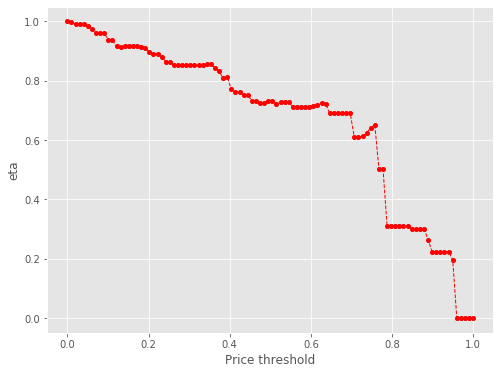

3371 82
Number of cells with price above 30.0th percentile:  82


eta =  1.0
eta =  0.9945369464582914
eta =  0.9945369464582914
eta =  0.9945369464582914
eta =  0.989177252424922
eta =  0.9787398358367568
eta =  0.9637659508789198
eta =  0.9637659508789198
eta =  0.9637659508789198
eta =  0.9401563580058095
eta =  0.9325336260148404
eta =  0.919969261093513
eta =  0.9157091911698412
eta =  0.9207075555399503
eta =  0.920121793282526
eta =  0.920121793282526
eta =  0.920121793282526
eta =  0.9159389176670177
eta =  0.9116207757705824
eta =  0.8999199707617809
eta =  0.8919077317064652
eta =  0.8919077317064652
eta =  0.8842272473577197
eta =  0.8668470977700936
eta =  0.8668470977700936
eta =  0.8551680990135482
eta =  0.8551680990135482
eta =  0.8551680990135482
eta =  0.8551680990135482
eta =  0.8551680990135482
eta =  0.8551680990135482
eta =  0.8551680990135482
eta =  0.8501889182112468
eta =  0.8591405028420256
eta =  0.8591405028420256
eta =  0.8461464731131089
eta =  0.8446243916608631
eta =  0.8352250730185036
eta =  0.813944459479873
eta =  

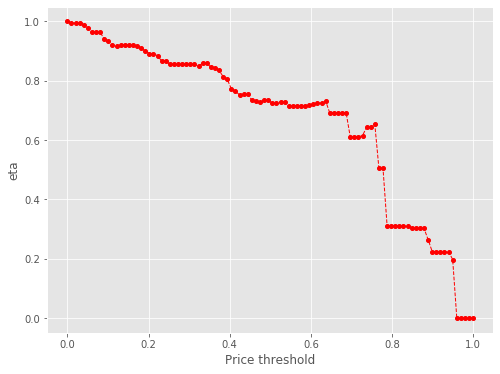

3371 80
Number of cells with price above 31.0th percentile:  80


eta =  1.0
eta =  0.994610864832668
eta =  0.9748694750829021
eta =  0.969059977420696
eta =  0.969059977420696
eta =  0.969059977420696
eta =  0.9453206955798474
eta =  0.9376560914461197
eta =  0.9250227096838121
eta =  0.9207392389300683
eta =  0.9257650596277397
eta =  0.9251760797416627
eta =  0.9251760797416627
eta =  0.9251760797416627
eta =  0.9251760797416627
eta =  0.9166283656097574
eta =  0.9146237855414714
eta =  0.8968070365637943
eta =  0.8968070365637943
eta =  0.8968070365637943
eta =  0.8890843628349832
eta =  0.8716087430005268
eta =  0.8716087430005268
eta =  0.8598655907746229
eta =  0.8598655907746229
eta =  0.8598655907746229
eta =  0.8598655907746229
eta =  0.8598655907746229
eta =  0.8598655907746229
eta =  0.8530202018825654
eta =  0.8591199700133241
eta =  0.8638598152653508
eta =  0.8638598152653508
eta =  0.8507944085198391
eta =  0.8387834666375781
eta =  0.8147836447372723
eta =  0.8184155072151541
eta =  0.8090433032418918
eta =  0.7774301891421475
eta =

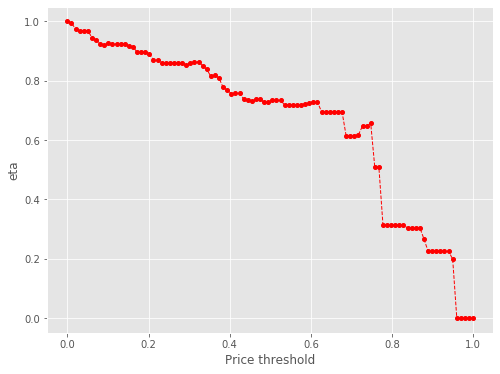

3371 80
Number of cells with price above 32.0th percentile:  80


eta =  1.0
eta =  0.994610864832668
eta =  0.9748694750829021
eta =  0.969059977420696
eta =  0.969059977420696
eta =  0.969059977420696
eta =  0.9453206955798474
eta =  0.9376560914461197
eta =  0.9250227096838121
eta =  0.9207392389300683
eta =  0.9257650596277397
eta =  0.9251760797416627
eta =  0.9251760797416627
eta =  0.9251760797416627
eta =  0.9251760797416627
eta =  0.9166283656097574
eta =  0.9146237855414714
eta =  0.8968070365637943
eta =  0.8968070365637943
eta =  0.8968070365637943
eta =  0.8890843628349832
eta =  0.8716087430005268
eta =  0.8716087430005268
eta =  0.8598655907746229
eta =  0.8598655907746229
eta =  0.8598655907746229
eta =  0.8598655907746229
eta =  0.8598655907746229
eta =  0.8598655907746229
eta =  0.8530202018825654
eta =  0.8591199700133241
eta =  0.8638598152653508
eta =  0.8638598152653508
eta =  0.8507944085198391
eta =  0.8387834666375781
eta =  0.8147836447372723
eta =  0.8184155072151541
eta =  0.8090433032418918
eta =  0.7774301891421475
eta =

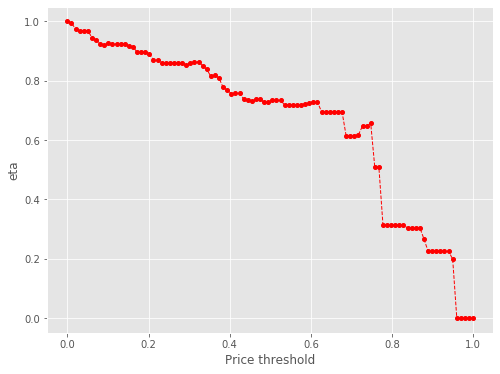

3371 78
Number of cells with price above 33.0th percentile:  78


eta =  1.0
eta =  0.9765013874067685
eta =  0.9743106693125954
eta =  0.9743106693125954
eta =  0.9743106693125954
eta =  0.9504427600827454
eta =  0.9427366265538129
eta =  0.9300347928930343
eta =  0.9257281128584617
eta =  0.9311075881577792
eta =  0.9301889939612846
eta =  0.9301889939612846
eta =  0.9301889939612846
eta =  0.9259603528302295
eta =  0.9215949654480898
eta =  0.909766140047872
eta =  0.9016662377950917
eta =  0.9016662377950917
eta =  0.9016662377950917
eta =  0.8939017200305382
eta =  0.8763314114280917
eta =  0.8763314114280917
eta =  0.8645246308658467
eta =  0.8645246308658467
eta =  0.8645246308658467
eta =  0.8645246308658467
eta =  0.8645246308658467
eta =  0.8645246308658467
eta =  0.8645246308658467
eta =  0.86377497008125
eta =  0.8685404974041636
eta =  0.8685404974041636
eta =  0.8554042979039602
eta =  0.8538655631134923
eta =  0.8443634050125882
eta =  0.8228499568550793
eta =  0.8134269711381085
eta =  0.7816425665860197
eta =  0.7727551343089462
eta 

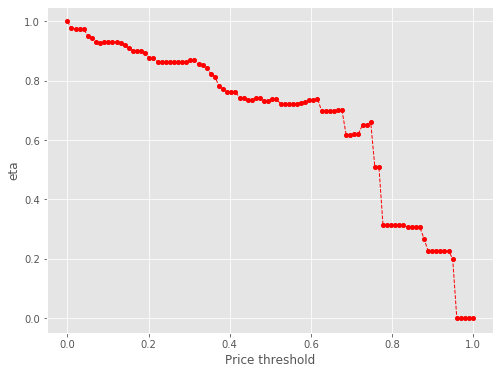

3371 73
Number of cells with price above 34.0th percentile:  73


eta =  1.0
eta =  0.9755027734154965
eta =  0.9675934547847466
eta =  0.9545567160310386
eta =  0.9527776034960699
eta =  0.955657797337581
eta =  0.9547149828684112
eta =  0.9547149828684112
eta =  0.9547149828684112
eta =  0.9547149828684112
eta =  0.9458943584168097
eta =  0.9438257763733933
eta =  0.9254401765211538
eta =  0.9254401765211538
eta =  0.9254401765211538
eta =  0.9174709342567418
eta =  0.8994373550752237
eta =  0.8994373550752237
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.8821528893357408
eta =  0.8865498421470315
eta =  0.8914410205699013
eta =  0.8914410205699013
eta =  0.8779584631947764
eta =  0.8763791570874611
eta =  0.8666264586923914
eta =  0.8445457724850987
eta =  0.8348743339863095
eta =  0.8022518804371622
eta =  0.7931301161406222
eta =  0.7931301161406222
eta =  0.7821207460603552
eta =  0.7821207460603552
eta =  0.

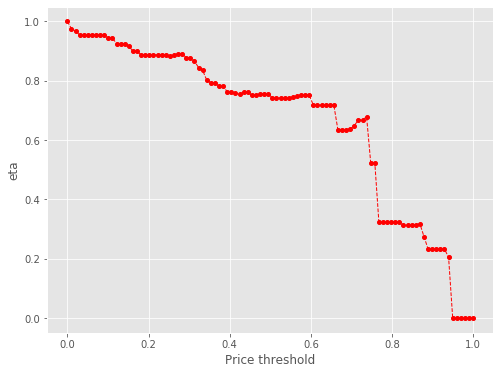

3371 73
Number of cells with price above 35.0th percentile:  73


eta =  1.0
eta =  0.9755027734154965
eta =  0.9675934547847466
eta =  0.9545567160310386
eta =  0.9527776034960699
eta =  0.955657797337581
eta =  0.9547149828684112
eta =  0.9547149828684112
eta =  0.9547149828684112
eta =  0.9547149828684112
eta =  0.9458943584168097
eta =  0.9438257763733933
eta =  0.9254401765211538
eta =  0.9254401765211538
eta =  0.9254401765211538
eta =  0.9174709342567418
eta =  0.8994373550752237
eta =  0.8994373550752237
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.8821528893357408
eta =  0.8865498421470315
eta =  0.8914410205699013
eta =  0.8914410205699013
eta =  0.8779584631947764
eta =  0.8763791570874611
eta =  0.8666264586923914
eta =  0.8445457724850987
eta =  0.8348743339863095
eta =  0.8022518804371622
eta =  0.7931301161406222
eta =  0.7931301161406222
eta =  0.7821207460603552
eta =  0.7821207460603552
eta =  0.

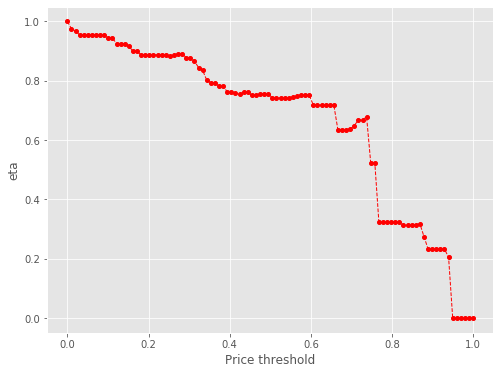

3371 73
Number of cells with price above 36.00000000000001th percentile:  73


eta =  1.0
eta =  0.9755027734154965
eta =  0.9675934547847466
eta =  0.9545567160310386
eta =  0.9527776034960699
eta =  0.955657797337581
eta =  0.9547149828684112
eta =  0.9547149828684112
eta =  0.9547149828684112
eta =  0.9547149828684112
eta =  0.9458943584168097
eta =  0.9438257763733933
eta =  0.9254401765211538
eta =  0.9254401765211538
eta =  0.9254401765211538
eta =  0.9174709342567418
eta =  0.8994373550752237
eta =  0.8994373550752237
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.887319268992296
eta =  0.8821528893357408
eta =  0.8865498421470315
eta =  0.8914410205699013
eta =  0.8914410205699013
eta =  0.8779584631947764
eta =  0.8763791570874611
eta =  0.8666264586923914
eta =  0.8445457724850987
eta =  0.8348743339863095
eta =  0.8022518804371622
eta =  0.7931301161406222
eta =  0.7931301161406222
eta =  0.7821207460603552
eta =  0.7821207460603552
eta =  0.

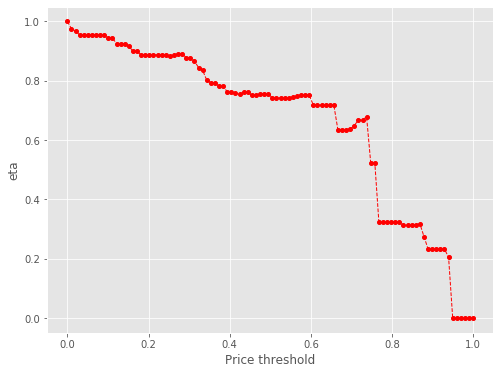

3371 71
Number of cells with price above 37.0th percentile:  71


eta =  1.0
eta =  0.9785279366135269
eta =  0.9785279366135269
eta =  0.9767041462733521
eta =  0.9786901779127682
eta =  0.9786901779127682
eta =  0.9786901779127682
eta =  0.9786901779127682
eta =  0.9696480463145996
eta =  0.9696480463145996
eta =  0.9572024515907385
eta =  0.9486802105963675
eta =  0.9486802105963675
eta =  0.9486802105963675
eta =  0.940510841444797
eta =  0.9220243956109448
eta =  0.9220243956109448
eta =  0.9096019951696842
eta =  0.9096019951696842
eta =  0.9096019951696842
eta =  0.9096019951696842
eta =  0.9096019951696842
eta =  0.9096019951696842
eta =  0.9096019951696842
eta =  0.9043058752637753
eta =  0.9084166249238707
eta =  0.9138272538669752
eta =  0.9000061169696204
eta =  0.9000061169696204
eta =  0.8983871506782322
eta =  0.888389538512638
eta =  0.8657543530379905
eta =  0.8558400414005906
eta =  0.8223983593898595
eta =  0.8131969060489034
eta =  0.8130475255991956
eta =  0.8017616836925445
eta =  0.8017616836925445
eta =  0.7817376151765488
eta

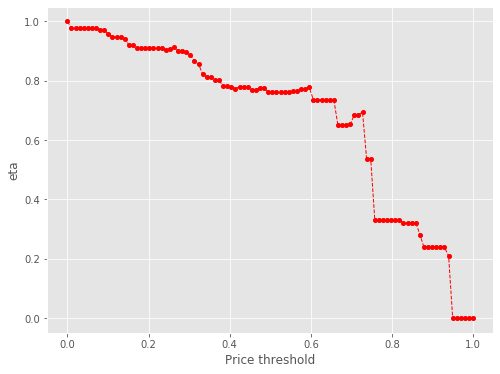

3371 68
Number of cells with price above 38.0th percentile:  68


eta =  1.0
eta =  0.9981361898092697
eta =  1.000165801397355
eta =  1.000165801397355
eta =  1.000165801397355
eta =  1.000165801397355
eta =  0.9909252562275752
eta =  0.9909252562275752
eta =  0.9782065649585936
eta =  0.9694973184716056
eta =  0.9694973184716056
eta =  0.9694973184716056
eta =  0.9611486869753573
eta =  0.9422565888122433
eta =  0.9422565888122433
eta =  0.9295616007833354
eta =  0.9295616007833354
eta =  0.9295616007833354
eta =  0.9295616007833354
eta =  0.9295616007833354
eta =  0.9295616007833354
eta =  0.9295616007833354
eta =  0.9295616007833354
eta =  0.9241492669012414
eta =  0.9338795753032185
eta =  0.9338795753032185
eta =  0.9197551580227199
eta =  0.9181006663819485
eta =  0.9078836743150754
eta =  0.8808255583430797
eta =  0.8847517997638155
eta =  0.8746199361077698
eta =  0.8404444355835174
eta =  0.8308884142980903
eta =  0.8181720284592696
eta =  0.819354924568907
eta =  0.819354924568907
eta =  0.7988914633157775
eta =  0.7988914633157775
eta =  

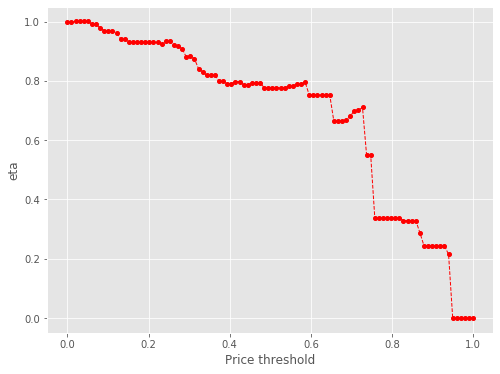

3371 65
Number of cells with price above 39.0th percentile:  65


eta =  1.0
eta =  1.002033401462453
eta =  1.002033401462453
eta =  1.002033401462453
eta =  1.002033401462453
eta =  0.9927756015107795
eta =  0.9927756015107795
eta =  0.9800331607508548
eta =  0.9713076515709379
eta =  0.9713076515709379
eta =  0.9713076515709379
eta =  0.9629434307546948
eta =  0.9440160555568032
eta =  0.9440160555568032
eta =  0.944293993832904
eta =  0.9312973622977864
eta =  0.9312973622977864
eta =  0.9312973622977864
eta =  0.9312973622977864
eta =  0.9312973622977864
eta =  0.9312973622977864
eta =  0.9312973622977864
eta =  0.925874922016237
eta =  0.9361334823080002
eta =  0.9356233997303217
eta =  0.9214726080601012
eta =  0.9198150270028634
eta =  0.9095789568441155
eta =  0.8824703155101445
eta =  0.8864038883640514
eta =  0.8762531055756008
eta =  0.842013789465058
eta =  0.8324399243121943
eta =  0.8324399243121943
eta =  0.820884898207603
eta =  0.820884898207603
eta =  0.8003832257283797
eta =  0.8003832257283797
eta =  0.7976039563197108
eta =  0.7

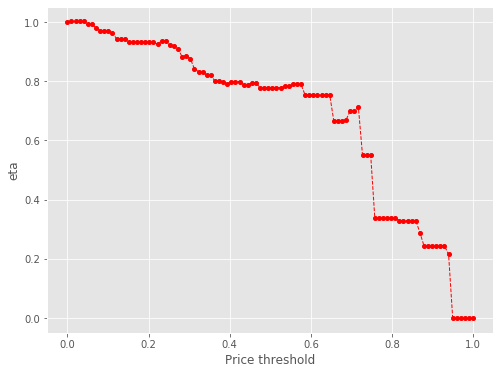

3371 62
Number of cells with price above 40.0th percentile:  62


eta =  1.0
eta =  0.9907609866715403
eta =  0.9885942855298011
eta =  0.9693366011086344
eta =  0.9693366011086344
eta =  0.9693366011086344
eta =  0.9693366011086344
eta =  0.9609893535976876
eta =  0.9421003872515884
eta =  0.9421003872515884
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.923996067062172
eta =  0.9342338099126508
eta =  0.9337247624328622
eta =  0.9196026866122682
eta =  0.9196026866122682
eta =  0.9179484692430482
eta =  0.907733170886917
eta =  0.8846051309969888
eta =  0.8744749469396152
eta =  0.8410974619908027
eta =  0.8403051118217729
eta =  0.8307506746753757
eta =  0.8180363968815794
eta =  0.8192190968979014
eta =  0.8192190968979014
eta =  0.7987590279527931
eta =  0.7987590279527931
eta =  0.7959853984464187
eta =  0.7900291124832848
eta =  0.7973453693633294
eta =  0.7973453693633294
eta

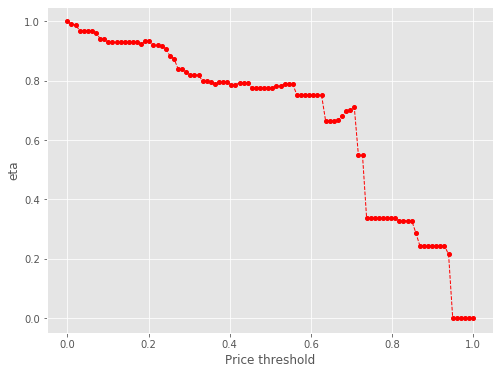

3371 62
Number of cells with price above 41.0th percentile:  62


eta =  1.0
eta =  0.9907609866715403
eta =  0.9885942855298011
eta =  0.9693366011086344
eta =  0.9693366011086344
eta =  0.9693366011086344
eta =  0.9693366011086344
eta =  0.9609893535976876
eta =  0.9421003872515884
eta =  0.9421003872515884
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.9294075037205064
eta =  0.923996067062172
eta =  0.9342338099126508
eta =  0.9337247624328622
eta =  0.9196026866122682
eta =  0.9196026866122682
eta =  0.9179484692430482
eta =  0.907733170886917
eta =  0.8846051309969888
eta =  0.8744749469396152
eta =  0.8410974619908027
eta =  0.8403051118217729
eta =  0.8307506746753757
eta =  0.8180363968815794
eta =  0.8192190968979014
eta =  0.8192190968979014
eta =  0.7987590279527931
eta =  0.7987590279527931
eta =  0.7959853984464187
eta =  0.7900291124832848
eta =  0.7973453693633294
eta =  0.7973453693633294
eta

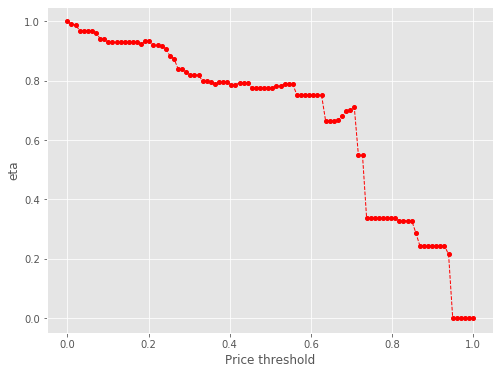

3371 61
Number of cells with price above 42.00000000000001th percentile:  61


eta =  1.0
eta =  0.9952855569152645
eta =  0.9931089609637329
eta =  0.9737633312691176
eta =  0.9737633312691176
eta =  0.9737633312691176
eta =  0.9653779638602205
eta =  0.9653779638602205
eta =  0.9464027360885968
eta =  0.9464027360885968
eta =  0.9336518871714082
eta =  0.9336518871714082
eta =  0.9336518871714082
eta =  0.9336518871714082
eta =  0.9336518871714082
eta =  0.9336518871714082
eta =  0.9336518871714082
eta =  0.9336518871714082
eta =  0.9282157377663979
eta =  0.9385002339582853
eta =  0.9379888617794918
eta =  0.9238022937908603
eta =  0.9238022937908603
eta =  0.9107606758038249
eta =  0.9118785728047238
eta =  0.8886449126466488
eta =  0.878468466443343
eta =  0.8449385544437671
eta =  0.834697845878047
eta =  0.8345445158067445
eta =  0.8217721749243223
eta =  0.8229602760508749
eta =  0.8229602760508749
eta =  0.8024067708276137
eta =  0.8024067708276137
eta =  0.7976972738686475
eta =  0.7936369879064245
eta =  0.8009866563949399
eta =  0.8009866563949399
eta

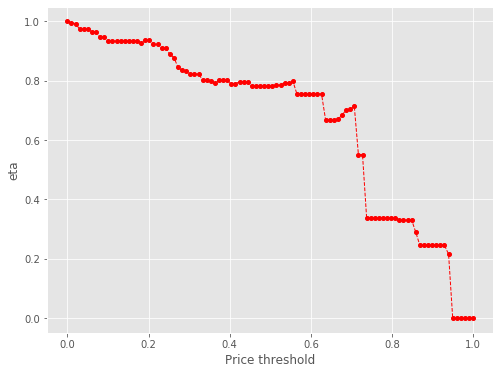

3371 60
Number of cells with price above 43.0th percentile:  60


eta =  1.0
eta =  0.978375828427721
eta =  0.978375828427721
eta =  0.978375828427721
eta =  0.978375828427721
eta =  0.9699507414256687
eta =  0.9508856322820833
eta =  0.9508856322820833
eta =  0.9508856322820833
eta =  0.9380743854709592
eta =  0.9380743854709592
eta =  0.9380743854709592
eta =  0.9380743854709592
eta =  0.9380743854709592
eta =  0.9380743854709592
eta =  0.9380743854709592
eta =  0.932612486252951
eta =  0.9372609470162122
eta =  0.9424319033490699
eta =  0.9424319033490699
eta =  0.928178136789249
eta =  0.9265084935640173
eta =  0.9161979358275348
eta =  0.8888920257178206
eta =  0.8928542230642509
eta =  0.8826295733317198
eta =  0.848940837705437
eta =  0.8386516212141822
eta =  0.8384975648529329
eta =  0.8256647242739857
eta =  0.8268584531674652
eta =  0.8268584531674652
eta =  0.8062075906281115
eta =  0.8062075906281115
eta =  0.8014757858448065
eta =  0.7973962672242335
eta =  0.8047807494338365
eta =  0.8047807494338365
eta =  0.8047807494338365
eta =  0

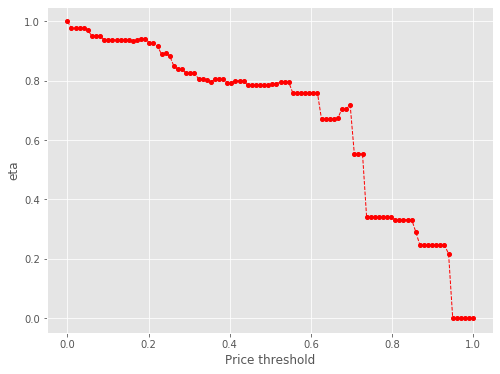

3371 57
Number of cells with price above 44.0th percentile:  57


eta =  1.0
eta =  0.9913887007862903
eta =  0.971902212476145
eta =  0.971902212476145
eta =  0.972188361026145
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9532251913374505
eta =  0.9637867886595467
eta =  0.9632616382843247
eta =  0.9486928333878186
eta =  0.9486928333878186
eta =  0.9469862875219883
eta =  0.9364478446895935
eta =  0.9085384163121614
eta =  0.9125881865858176
eta =  0.9021375505056494
eta =  0.866886807803102
eta =  0.8570301314581978
eta =  0.8570301314581978
eta =  0.843913658006917
eta =  0.8451337708294074
eta =  0.8451337708294074
eta =  0.8240264806252533
eta =  0.8240264806252533
eta =  0.8191900929654015
eta =  0.8150204083697294
eta =  0.8225681032279212
eta =  0.8225681032279212
eta =  0.8225681032279212
eta =  0.8116494891069794
eta =  0.8116494891069794
eta =  0.817986271150128
eta =  

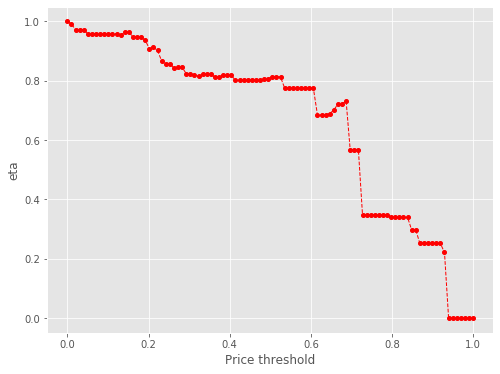

3371 57
Number of cells with price above 45.0th percentile:  57


eta =  1.0
eta =  0.9913887007862903
eta =  0.971902212476145
eta =  0.971902212476145
eta =  0.972188361026145
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9588078100605497
eta =  0.9532251913374505
eta =  0.9637867886595467
eta =  0.9632616382843247
eta =  0.9486928333878186
eta =  0.9486928333878186
eta =  0.9469862875219883
eta =  0.9364478446895935
eta =  0.9085384163121614
eta =  0.9125881865858176
eta =  0.9021375505056494
eta =  0.866886807803102
eta =  0.8570301314581978
eta =  0.8570301314581978
eta =  0.843913658006917
eta =  0.8451337708294074
eta =  0.8451337708294074
eta =  0.8240264806252533
eta =  0.8240264806252533
eta =  0.8191900929654015
eta =  0.8150204083697294
eta =  0.8225681032279212
eta =  0.8225681032279212
eta =  0.8225681032279212
eta =  0.8116494891069794
eta =  0.8116494891069794
eta =  0.817986271150128
eta =  

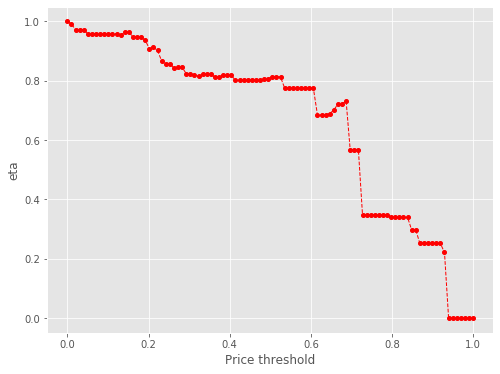

3371 56
Number of cells with price above 46.0th percentile:  56


eta =  1.0
eta =  0.9803442501465974
eta =  0.9803442501465974
eta =  0.9671361084709761
eta =  0.9671361084709761
eta =  0.9671361084709761
eta =  0.9671361084709761
eta =  0.9671361084709761
eta =  0.9671361084709761
eta =  0.9671361084709761
eta =  0.9671361084709761
eta =  0.9615049985756632
eta =  0.9615049985756632
eta =  0.9716286230822911
eta =  0.9716286230822911
eta =  0.9569332721216122
eta =  0.9569332721216122
eta =  0.9552119030314896
eta =  0.9445819222539837
eta =  0.9164300698520987
eta =  0.920515016826423
eta =  0.9099736054991812
eta =  0.874416671397966
eta =  0.8644743789983385
eta =  0.8644743789983385
eta =  0.8512439745758572
eta =  0.852474685417652
eta =  0.852474685417652
eta =  0.8311840552264731
eta =  0.8311840552264731
eta =  0.8263056582304049
eta =  0.8220997553465361
eta =  0.8220997553465361
eta =  0.8297130102204372
eta =  0.8297130102204372
eta =  0.818699555949391
eta =  0.818699555949391
eta =  0.8250913799011091
eta =  0.8250913799011091
eta =  

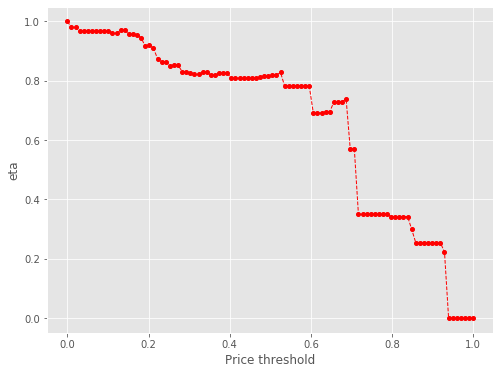

3371 54
Number of cells with price above 47.0th percentile:  54


eta =  1.0
eta =  0.9865270371365505
eta =  0.9865270371365505
eta =  0.9865270371365505
eta =  0.9865270371365505
eta =  0.9865270371365505
eta =  0.9865270371365505
eta =  0.9865270371365505
eta =  0.9865270371365505
eta =  0.980783024363006
eta =  0.9852414201274388
eta =  0.9911096259676099
eta =  0.9911096259676099
eta =  0.9761196355040749
eta =  0.9743637532312251
eta =  0.9623394365573397
eta =  0.9635206429912085
eta =  0.9389711998502284
eta =  0.9389711998502284
eta =  0.8927896361921219
eta =  0.8919485897603915
eta =  0.8818069559433513
eta =  0.8818069559433513
eta =  0.8683112839684274
eta =  0.869566670371327
eta =  0.869566670371327
eta =  0.8478491663537382
eta =  0.8478491663537382
eta =  0.8449050751041146
eta =  0.8385827276730619
eta =  0.8385827276730619
eta =  0.8463486271239563
eta =  0.8463486271239563
eta =  0.8351143548064524
eta =  0.8351143548064524
eta =  0.8351143548064524
eta =  0.8416343338350051
eta =  0.8416343338350051
eta =  0.8416343338350051
eta 

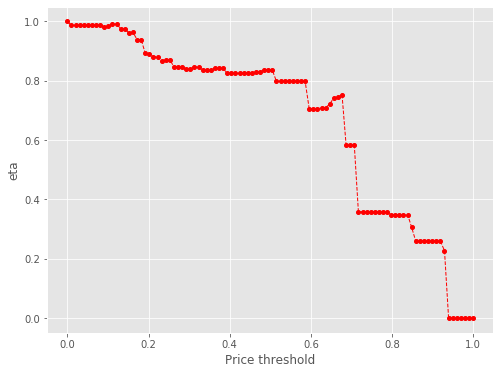

3371 52
Number of cells with price above 48.00000000000001th percentile:  52


eta =  1.0
eta =  0.9941775414587553
eta =  1.0051928849001373
eta =  1.0046451730753985
eta =  1.0046451730753985
eta =  0.9894504648725251
eta =  0.9876706025811213
eta =  0.9754820702639668
eta =  0.9766794083899419
eta =  0.9475709383873149
eta =  0.9517946944218015
eta =  0.9408950793263549
eta =  0.9049824308753801
eta =  0.894013986740655
eta =  0.8938497605730553
eta =  0.8938497605730553
eta =  0.8801697787105248
eta =  0.8814423098785944
eta =  0.8814423098785944
eta =  0.8594282107205773
eta =  0.8594282107205773
eta =  0.8564439121268267
eta =  0.8500352206332781
eta =  0.8500352206332781
eta =  0.8579071786826341
eta =  0.8579071786826341
eta =  0.8579071786826341
eta =  0.8465194803280993
eta =  0.8465194803280993
eta =  0.8465194803280993
eta =  0.8531285024664863
eta =  0.8531285024664863
eta =  0.8531285024664863
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
et

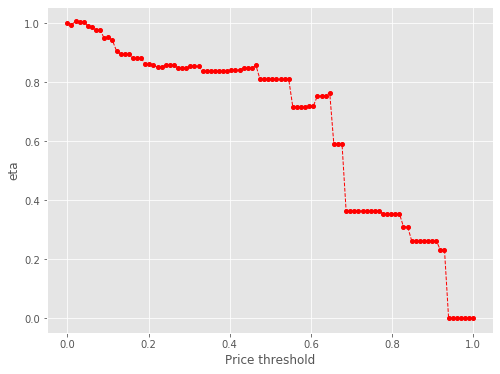

3371 52
Number of cells with price above 49.0th percentile:  52


eta =  1.0
eta =  0.9941775414587553
eta =  1.0051928849001373
eta =  1.0046451730753985
eta =  1.0046451730753985
eta =  0.9894504648725251
eta =  0.9876706025811213
eta =  0.9754820702639668
eta =  0.9766794083899419
eta =  0.9475709383873149
eta =  0.9517946944218015
eta =  0.9408950793263549
eta =  0.9049824308753801
eta =  0.894013986740655
eta =  0.8938497605730553
eta =  0.8938497605730553
eta =  0.8801697787105248
eta =  0.8814423098785944
eta =  0.8814423098785944
eta =  0.8594282107205773
eta =  0.8594282107205773
eta =  0.8564439121268267
eta =  0.8500352206332781
eta =  0.8500352206332781
eta =  0.8579071786826341
eta =  0.8579071786826341
eta =  0.8579071786826341
eta =  0.8465194803280993
eta =  0.8465194803280993
eta =  0.8465194803280993
eta =  0.8531285024664863
eta =  0.8531285024664863
eta =  0.8531285024664863
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
et

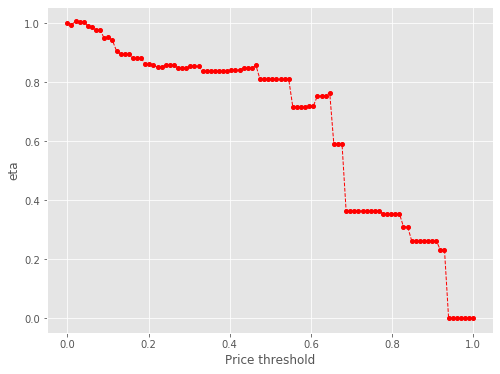

3371 52
Number of cells with price above 50.0th percentile:  52


eta =  1.0
eta =  0.9941775414587553
eta =  1.0051928849001373
eta =  1.0046451730753985
eta =  1.0046451730753985
eta =  0.9894504648725251
eta =  0.9876706025811213
eta =  0.9754820702639668
eta =  0.9766794083899419
eta =  0.9475709383873149
eta =  0.9517946944218015
eta =  0.9408950793263549
eta =  0.9049824308753801
eta =  0.894013986740655
eta =  0.8938497605730553
eta =  0.8938497605730553
eta =  0.8801697787105248
eta =  0.8814423098785944
eta =  0.8814423098785944
eta =  0.8594282107205773
eta =  0.8594282107205773
eta =  0.8564439121268267
eta =  0.8500352206332781
eta =  0.8500352206332781
eta =  0.8579071786826341
eta =  0.8579071786826341
eta =  0.8579071786826341
eta =  0.8465194803280993
eta =  0.8465194803280993
eta =  0.8465194803280993
eta =  0.8531285024664863
eta =  0.8531285024664863
eta =  0.8531285024664863
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
et

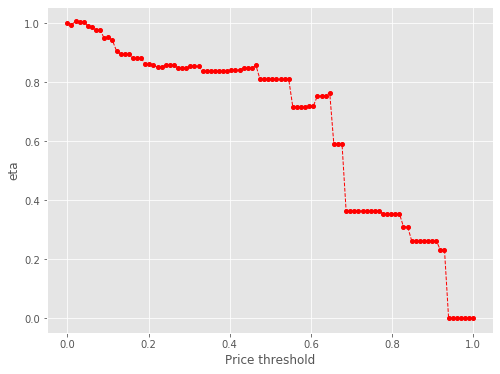

3371 52
Number of cells with price above 51.0th percentile:  52


eta =  1.0
eta =  0.9941775414587553
eta =  1.0051928849001373
eta =  1.0046451730753985
eta =  1.0046451730753985
eta =  0.9894504648725251
eta =  0.9876706025811213
eta =  0.9754820702639668
eta =  0.9766794083899419
eta =  0.9475709383873149
eta =  0.9517946944218015
eta =  0.9408950793263549
eta =  0.9049824308753801
eta =  0.894013986740655
eta =  0.8938497605730553
eta =  0.8938497605730553
eta =  0.8801697787105248
eta =  0.8814423098785944
eta =  0.8814423098785944
eta =  0.8594282107205773
eta =  0.8594282107205773
eta =  0.8564439121268267
eta =  0.8500352206332781
eta =  0.8500352206332781
eta =  0.8579071786826341
eta =  0.8579071786826341
eta =  0.8579071786826341
eta =  0.8465194803280993
eta =  0.8465194803280993
eta =  0.8465194803280993
eta =  0.8531285024664863
eta =  0.8531285024664863
eta =  0.8531285024664863
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
et

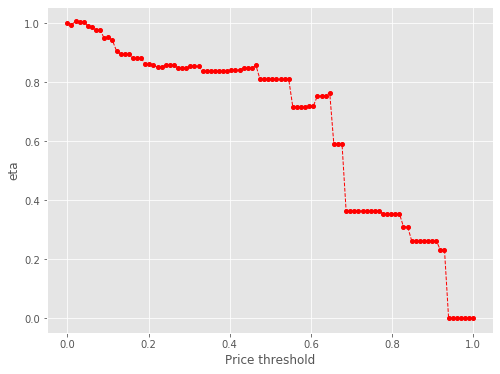

3371 52
Number of cells with price above 52.0th percentile:  52


eta =  1.0
eta =  0.9941775414587553
eta =  1.0051928849001373
eta =  1.0046451730753985
eta =  1.0046451730753985
eta =  0.9894504648725251
eta =  0.9876706025811213
eta =  0.9754820702639668
eta =  0.9766794083899419
eta =  0.9475709383873149
eta =  0.9517946944218015
eta =  0.9408950793263549
eta =  0.9049824308753801
eta =  0.894013986740655
eta =  0.8938497605730553
eta =  0.8938497605730553
eta =  0.8801697787105248
eta =  0.8814423098785944
eta =  0.8814423098785944
eta =  0.8594282107205773
eta =  0.8594282107205773
eta =  0.8564439121268267
eta =  0.8500352206332781
eta =  0.8500352206332781
eta =  0.8579071786826341
eta =  0.8579071786826341
eta =  0.8579071786826341
eta =  0.8465194803280993
eta =  0.8465194803280993
eta =  0.8465194803280993
eta =  0.8531285024664863
eta =  0.8531285024664863
eta =  0.8531285024664863
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
eta =  0.8362173069140186
et

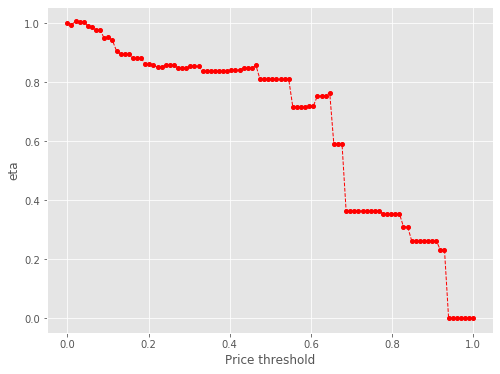

3371 48
Number of cells with price above 53.0th percentile:  48


eta =  1.0
eta =  1.0059561095588248
eta =  1.0059561095588248
eta =  0.990741574159373
eta =  0.990741574159373
eta =  0.9889593893699611
eta =  0.9779538530430231
eta =  0.9488074001223211
eta =  0.9530366676309393
eta =  0.9421228298990166
eta =  0.9061633199268476
eta =  0.9053096749069075
eta =  0.8950161228801076
eta =  0.8950161228801076
eta =  0.8813182903497027
eta =  0.8825924820120236
eta =  0.8825924820120236
eta =  0.8825924820120236
eta =  0.8605496572038869
eta =  0.8605496572038869
eta =  0.8554989072090171
eta =  0.851144410437589
eta =  0.851144410437589
eta =  0.8590266404090919
eta =  0.8590266404090919
eta =  0.8590266404090919
eta =  0.8476240825303835
eta =  0.8476240825303835
eta =  0.8476240825303835
eta =  0.854241728617278
eta =  0.854241728617278
eta =  0.854241728617278
eta =  0.8373084660666081
eta =  0.8373084660666081
eta =  0.8373084660666081
eta =  0.8373084660666081
eta =  0.8373084660666081
eta =  0.8373084660666081
eta =  0.8373084660666081
eta =  0

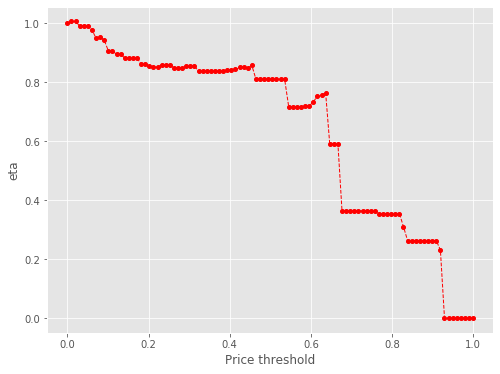

3371 46
Number of cells with price above 54.0th percentile:  46


eta =  1.0
eta =  0.9848755474966753
eta =  0.9831039147460242
eta =  0.9709717384873725
eta =  0.9721635404867887
eta =  0.9431896591775092
eta =  0.9473938858514472
eta =  0.936544667254118
eta =  0.9007980679437966
eta =  0.8999494772231593
eta =  0.8897168717158331
eta =  0.8897168717158331
eta =  0.8761001419199256
eta =  0.8773667892917276
eta =  0.8773667892917276
eta =  0.8773667892917276
eta =  0.8554544766185597
eta =  0.8524839765119249
eta =  0.8504336313283165
eta =  0.846104916854543
eta =  0.846104916854543
eta =  0.853940477369166
eta =  0.853940477369166
eta =  0.853940477369166
eta =  0.8426054322609762
eta =  0.8426054322609762
eta =  0.8426054322609762
eta =  0.8491838962953532
eta =  0.8491838962953532
eta =  0.8491838962953532
eta =  0.8323508929567719
eta =  0.8323508929567719
eta =  0.8323508929567719
eta =  0.8323508929567719
eta =  0.8323508929567719
eta =  0.8323508929567719
eta =  0.8323508929567719
eta =  0.8323508929567719
eta =  0.8362971699856468
eta =  

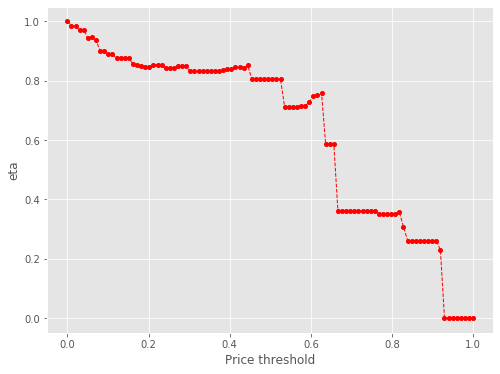

3371 44
Number of cells with price above 55.00000000000001th percentile:  44


eta =  1.0
eta =  0.9888715993343777
eta =  0.9593997593033424
eta =  0.9636762417899615
eta =  0.9526405634302307
eta =  0.9162796062881201
eta =  0.9154164312891104
eta =  0.9051742396749388
eta =  0.9050079634213269
eta =  0.8911572101167535
eta =  0.8924456266847307
eta =  0.8924456266847307
eta =  0.8924456266847307
eta =  0.8701567187224134
eta =  0.8701567187224134
eta =  0.8671351662068768
eta =  0.8606464730365014
eta =  0.8606464730365014
eta =  0.8606464730365014
eta =  0.868616699171393
eta =  0.868616699171393
eta =  0.868616699171393
eta =  0.8570868446583854
eta =  0.8570868446583854
eta =  0.8570868446583854
eta =  0.8637783692629603
eta =  0.8637783692629603
eta =  0.8637783692629603
eta =  0.846656066029197
eta =  0.846656066029197
eta =  0.846656066029197
eta =  0.846656066029197
eta =  0.846656066029197
eta =  0.846656066029197
eta =  0.846656066029197
eta =  0.846656066029197
eta =  0.8506701656270961
eta =  0.8506701656270961
eta =  0.8527369558823146
eta =  0.859

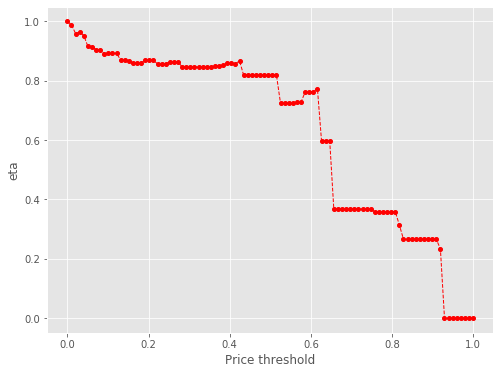

3371 42
Number of cells with price above 56.00000000000001th percentile:  42


eta =  1.0
eta =  0.9745211030821639
eta =  0.9745211030821639
eta =  0.9633612332192222
eta =  0.9265910831142079
eta =  0.9153607407516033
eta =  0.9151925932856192
eta =  0.9151925932856192
eta =  0.901185968650129
eta =  0.9024888845887044
eta =  0.9024888845887044
eta =  0.9024888845887044
eta =  0.8799491453775466
eta =  0.8799491453775466
eta =  0.8768935894109575
eta =  0.8703318748519157
eta =  0.8703318748519157
eta =  0.878391795007633
eta =  0.878391795007633
eta =  0.878391795007633
eta =  0.8667321877130475
eta =  0.8667321877130475
eta =  0.8667321877130475
eta =  0.873499016297344
eta =  0.873499016297344
eta =  0.873499016297344
eta =  0.873499016297344
eta =  0.8561840249018094
eta =  0.8561840249018094
eta =  0.8561840249018094
eta =  0.8561840249018094
eta =  0.8561840249018094
eta =  0.8561840249018094
eta =  0.8561840249018094
eta =  0.8561840249018094
eta =  0.8602432977139732
eta =  0.8602432977139732
eta =  0.8623333468736515
eta =  0.8689560928175204
eta =  0.

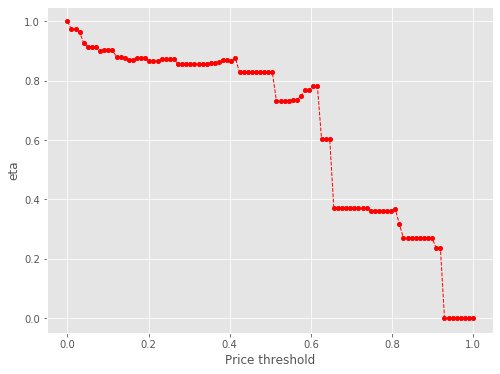

3371 40
Number of cells with price above 57.00000000000001th percentile:  40


eta =  1.0
eta =  0.9885483548507611
eta =  0.9499211369876549
eta =  0.9392928874054638
eta =  0.9391203437166176
eta =  0.9391203437166176
eta =  0.9247475152666326
eta =  0.9260844959994813
eta =  0.9260844959994813
eta =  0.9260844959994813
eta =  0.9029554543195523
eta =  0.9029554543195523
eta =  0.8998200107084031
eta =  0.8930867398348542
eta =  0.8930867398348542
eta =  0.9013573869560153
eta =  0.9013573869560153
eta =  0.9013573869560153
eta =  0.9013573869560153
eta =  0.8893929387180971
eta =  0.8893929387180971
eta =  0.8893929387180971
eta =  0.8963366863320738
eta =  0.8963366863320738
eta =  0.8963366863320738
eta =  0.8785689937282176
eta =  0.8785689937282176
eta =  0.8785689937282176
eta =  0.8785689937282176
eta =  0.8785689937282176
eta =  0.8785689937282176
eta =  0.8785689937282176
eta =  0.8785689937282176
eta =  0.8827343964058255
eta =  0.8827343964058255
eta =  0.8848790899923142
eta =  0.8848790899923142
eta =  0.8916749879189193
eta =  0.8916749879189193
e

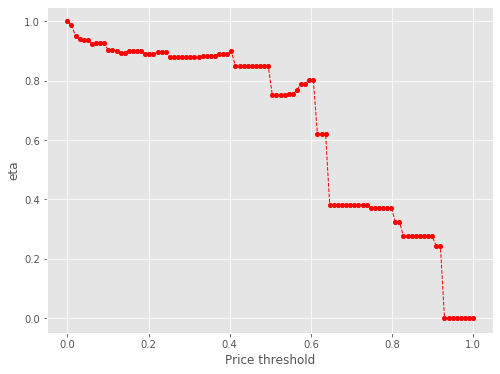

3371 38
Number of cells with price above 58.00000000000001th percentile:  38


eta =  1.0
eta =  0.9878799369352227
eta =  0.9876984680337316
eta =  0.9876984680337316
eta =  0.9725821725170353
eta =  0.9739883116028942
eta =  0.9739883116028942
eta =  0.9739883116028942
eta =  0.949662867918067
eta =  0.949662867918067
eta =  0.9463652363929291
eta =  0.939283671851008
eta =  0.939283671851008
eta =  0.939283671851008
eta =  0.9479821369049004
eta =  0.9479821369049004
eta =  0.9479821369049004
eta =  0.9353988005151325
eta =  0.9353988005151325
eta =  0.9353988005151325
eta =  0.942701729183034
eta =  0.942701729183034
eta =  0.942701729183034
eta =  0.942701729183034
eta =  0.9240149624840278
eta =  0.9240149624840278
eta =  0.9240149624840278
eta =  0.9240149624840278
eta =  0.9240149624840278
eta =  0.9240149624840278
eta =  0.9240149624840278
eta =  0.9240149624840278
eta =  0.9283958300383764
eta =  0.9283958300383764
eta =  0.93065146275249
eta =  0.93065146275249
eta =  0.9377988938734655
eta =  0.9377988938734655
eta =  0.936416298468971
eta =  0.945903

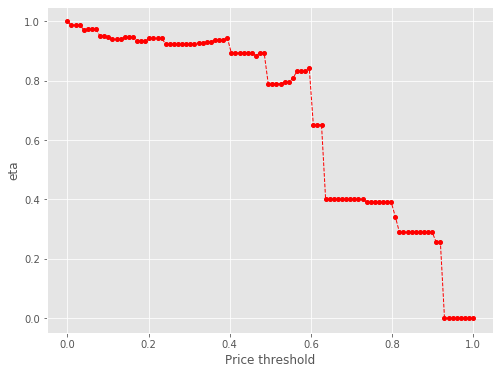

3371 35
Number of cells with price above 59.0th percentile:  35


eta =  1.0
eta =  0.9846954348863279
eta =  0.986119087075096
eta =  0.986119087075096
eta =  0.986119087075096
eta =  0.9614906762066927
eta =  0.9614906762066927
eta =  0.958151973523775
eta =  0.9509822099055133
eta =  0.9509822099055133
eta =  0.9509822099055133
eta =  0.9597890121183474
eta =  0.9597890121183474
eta =  0.9597890121183474
eta =  0.9470489534901121
eta =  0.9470489534901121
eta =  0.9470489534901121
eta =  0.9544428382679633
eta =  0.9544428382679633
eta =  0.9544428382679633
eta =  0.9544428382679633
eta =  0.9355233326660086
eta =  0.9355233326660086
eta =  0.9355233326660086
eta =  0.9355233326660086
eta =  0.9355233326660086
eta =  0.9355233326660086
eta =  0.9355233326660086
eta =  0.9355233326660086
eta =  0.9355233326660086
eta =  0.9399587628060087
eta =  0.9399587628060087
eta =  0.9422424888490427
eta =  0.9494789393977657
eta =  0.9494789393977657
eta =  0.9480791241208959
eta =  0.9480791241208959
eta =  0.9576845936780813
eta =  0.9051540067227223
eta =

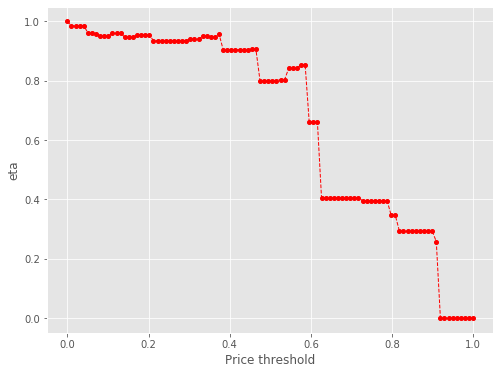

3371 33
Number of cells with price above 60.0th percentile:  33


eta =  1.0
eta =  0.9750249121113221
eta =  0.9750249121113221
eta =  0.9716392128315116
eta =  0.964368525434589
eta =  0.964368525434589
eta =  0.964368525434589
eta =  0.9732992948804535
eta =  0.9732992948804535
eta =  0.9732992948804535
eta =  0.9603799033026845
eta =  0.9603799033026845
eta =  0.9603799033026845
eta =  0.9603799033026845
eta =  0.9678778666569705
eta =  0.9678778666569705
eta =  0.9678778666569705
eta =  0.9678778666569705
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9531899089328022
eta =  0.9414202698257185
eta =  0.9555057813998972
eta =  0.9628440944328461
eta =  0.9628440944328461
eta =  0.9614245749293532
eta =  0.9614245749293532
eta =  0.9711652540046117
eta =  0.9178952304913576
eta =  0.9178952304913576
eta =  0.9178952304913576
eta =  0.9178952304913576
eta 

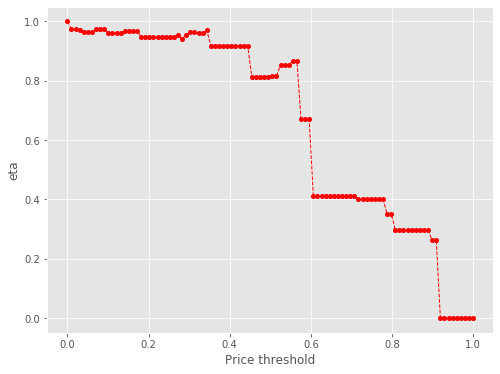

3371 33
Number of cells with price above 61.0th percentile:  33


eta =  1.0
eta =  0.9750249121113221
eta =  0.9750249121113221
eta =  0.9716392128315116
eta =  0.964368525434589
eta =  0.964368525434589
eta =  0.964368525434589
eta =  0.9732992948804535
eta =  0.9732992948804535
eta =  0.9732992948804535
eta =  0.9603799033026845
eta =  0.9603799033026845
eta =  0.9603799033026845
eta =  0.9603799033026845
eta =  0.9678778666569705
eta =  0.9678778666569705
eta =  0.9678778666569705
eta =  0.9678778666569705
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9486920443258449
eta =  0.9531899089328022
eta =  0.9414202698257185
eta =  0.9555057813998972
eta =  0.9628440944328461
eta =  0.9628440944328461
eta =  0.9614245749293532
eta =  0.9614245749293532
eta =  0.9711652540046117
eta =  0.9178952304913576
eta =  0.9178952304913576
eta =  0.9178952304913576
eta =  0.9178952304913576
eta 

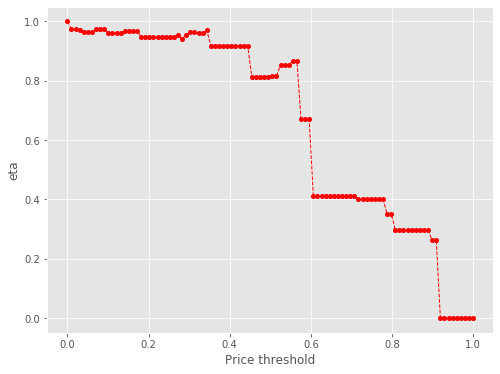

3371 32
Number of cells with price above 62.0th percentile:  32


eta =  1.0
eta =  0.9965275766416274
eta =  0.9890706518937471
eta =  0.9890706518937471
eta =  0.9890706518937471
eta =  0.998230181393897
eta =  0.998230181393897
eta =  0.998230181393897
eta =  0.9849798619227838
eta =  0.9849798619227838
eta =  0.9849798619227838
eta =  0.9849798619227838
eta =  0.9926698842608284
eta =  0.9926698842608284
eta =  0.9926698842608284
eta =  0.9926698842608284
eta =  0.9729926205388374
eta =  0.9729926205388374
eta =  0.9729926205388374
eta =  0.9729926205388374
eta =  0.9729926205388374
eta =  0.9729926205388374
eta =  0.9729926205388374
eta =  0.9729926205388374
eta =  0.9729926205388374
eta =  0.9776056971393291
eta =  0.9776056971393291
eta =  0.9799808902634516
eta =  0.9799808902634516
eta =  0.9875071728658711
eta =  0.9875071728658711
eta =  0.9860512926254174
eta =  0.9960414774445581
eta =  0.9414069518528959
eta =  0.9414069518528959
eta =  0.9414069518528959
eta =  0.9414069518528959
eta =  0.9414069518528959
eta =  0.9414069518528959
eta 

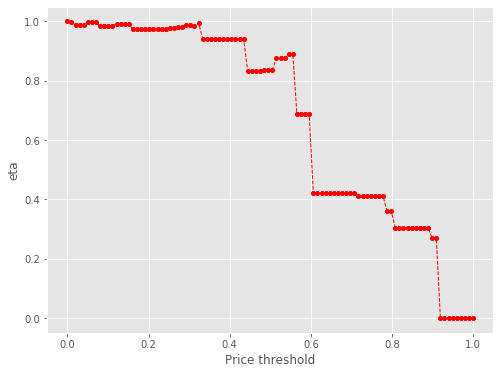

3371 29
Number of cells with price above 63.0th percentile:  29


eta =  1.0
eta =  1.009260743388364
eta =  1.009260743388364
eta =  1.009260743388364
eta =  0.9958640063142802
eta =  0.9958640063142802
eta =  0.9958640063142802
eta =  0.9958640063142802
eta =  1.003639004311967
eta =  1.003639004311967
eta =  1.003639004311967
eta =  1.003639004311967
eta =  0.9837443044901538
eta =  0.9837443044901538
eta =  0.9837443044901538
eta =  0.9837443044901538
eta =  0.9837443044901538
eta =  0.9837443044901538
eta =  0.9837443044901538
eta =  0.9837443044901538
eta =  0.9837443044901538
eta =  0.9837443044901538
eta =  0.9884083561346538
eta =  0.9884083561346538
eta =  0.9908097954247337
eta =  0.9908097954247337
eta =  0.9984192443432807
eta =  0.9984192443432807
eta =  0.9969472764533568
eta =  1.0070478540005854
eta =  0.9518096104160094
eta =  0.9518096104160094
eta =  0.9518096104160094
eta =  0.9518096104160094
eta =  0.9518096104160094
eta =  0.9518096104160094
eta =  0.9518096104160094
eta =  0.9518096104160094
eta =  0.9522511118160494
eta =  0

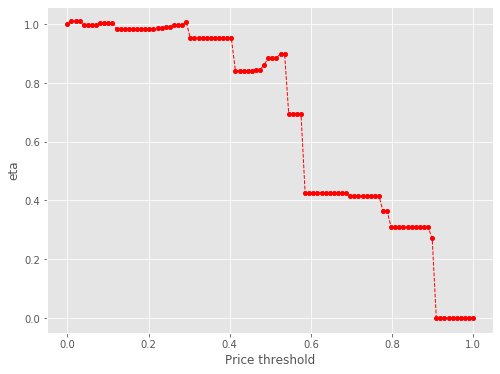

3371 28
Number of cells with price above 64.0th percentile:  28


eta =  1.0
eta =  0.9867261882899484
eta =  0.9867261882899484
eta =  0.9867261882899484
eta =  0.9944298447024469
eta =  0.9944298447024469
eta =  0.9944298447024469
eta =  0.9944298447024469
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.9793389494337182
eta =  0.9793389494337182
eta =  0.9817183536717327
eta =  0.9817183536717327
eta =  0.9892579800451909
eta =  0.9892579800451909
eta =  0.987799518592522
eta =  0.987799518592522
eta =  0.9978074155739484
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9435134756347328
eta =  0.9435134756347328
eta =  0.9435134756347328
eta =  0.83359

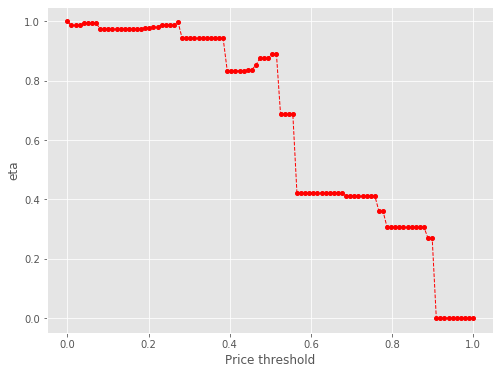

3371 28
Number of cells with price above 65.0th percentile:  28


eta =  1.0
eta =  0.9867261882899484
eta =  0.9867261882899484
eta =  0.9867261882899484
eta =  0.9944298447024469
eta =  0.9944298447024469
eta =  0.9944298447024469
eta =  0.9944298447024469
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.974717694049464
eta =  0.9793389494337182
eta =  0.9793389494337182
eta =  0.9817183536717327
eta =  0.9817183536717327
eta =  0.9892579800451909
eta =  0.9892579800451909
eta =  0.987799518592522
eta =  0.987799518592522
eta =  0.9978074155739484
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9430760253495293
eta =  0.9435134756347328
eta =  0.9435134756347328
eta =  0.9435134756347328
eta =  0.83359

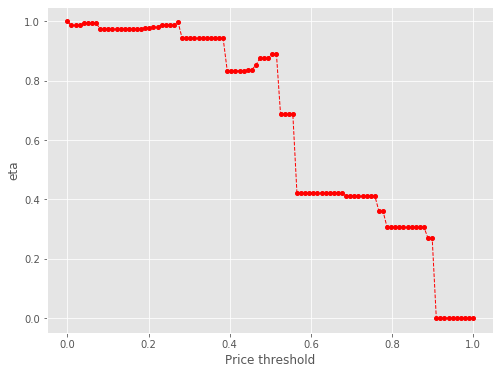

3371 27
Number of cells with price above 66.0th percentile:  27


eta =  1.0
eta =  1.00780728889526
eta =  1.00780728889526
eta =  1.00780728889526
eta =  1.00780728889526
eta =  0.9878299629796023
eta =  0.9878299629796023
eta =  0.9878299629796023
eta =  0.9878299629796023
eta =  0.9878299629796023
eta =  0.9878299629796023
eta =  0.9878299629796023
eta =  0.9878299629796023
eta =  0.9878299629796023
eta =  0.9878299629796023
eta =  0.9878299629796023
eta =  0.9925133852289533
eta =  0.9925133852289533
eta =  0.9949247981074723
eta =  0.9949247981074723
eta =  1.002565850369929
eta =  1.002565850369929
eta =  1.0010877691453937
eta =  1.0010877691453937
eta =  1.011230296120147
eta =  0.9557626386545315
eta =  0.9557626386545315
eta =  0.9557626386545315
eta =  0.9557626386545315
eta =  0.9557626386545315
eta =  0.9557626386545315
eta =  0.9557626386545315
eta =  0.9557626386545315
eta =  0.95620597368546
eta =  0.95620597368546
eta =  0.95620597368546
eta =  0.8448128217402869
eta =  0.8448128217402869
eta =  0.8448128217402869
eta =  0.844812821

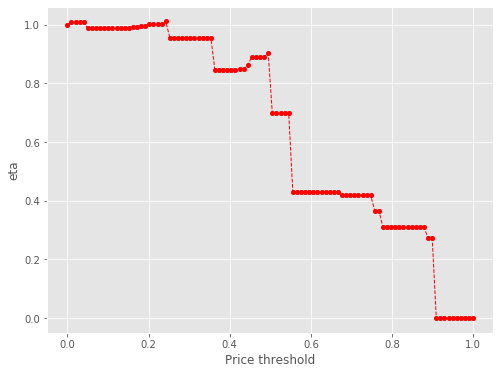

3371 26
Number of cells with price above 67.0th percentile:  26


eta =  1.0
eta =  0.9801774345792273
eta =  0.9801774345792273
eta =  0.9801774345792273
eta =  0.9801774345792273
eta =  0.9801774345792273
eta =  0.9801774345792273
eta =  0.9801774345792273
eta =  0.9801774345792273
eta =  0.9801774345792273
eta =  0.9801774345792273
eta =  0.9848245752587563
eta =  0.9848245752587563
eta =  0.9848245752587563
eta =  0.9872173073863065
eta =  0.9872173073863065
eta =  0.9947991658890692
eta =  0.9947991658890692
eta =  0.9933325350750019
eta =  0.9933325350750019
eta =  1.0033964898474181
eta =  0.9483585296373684
eta =  0.9483585296373684
eta =  0.9483585296373684
eta =  0.9483585296373684
eta =  0.9483585296373684
eta =  0.9483585296373684
eta =  0.9483585296373684
eta =  0.9483585296373684
eta =  0.9483585296373684
eta =  0.9487984302372287
eta =  0.9487984302372287
eta =  0.9487984302372287
eta =  0.8382682195783236
eta =  0.8382682195783236
eta =  0.8382682195783236
eta =  0.8382682195783236
eta =  0.8382682195783236
eta =  0.8382682195783236
e

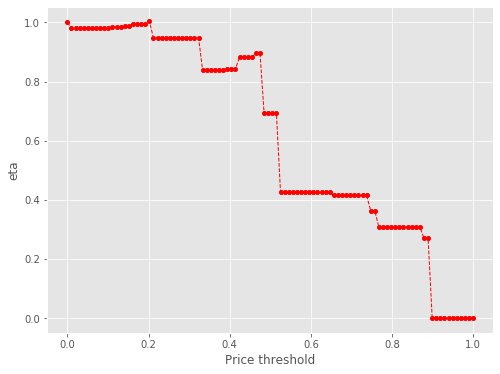

3371 25
Number of cells with price above 68.0th percentile:  25


eta =  1.0
eta =  1.004741121878126
eta =  1.004741121878126
eta =  1.0071822432946553
eta =  1.0071822432946553
eta =  1.014917433103445
eta =  1.014917433103445
eta =  1.014917433103445
eta =  1.013421141960304
eta =  1.013421141960304
eta =  1.0236886245786287
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9679864040580886
eta =  0.9679864040580886
eta =  0.9679864040580886
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8596709127658452
eta =  0.8596709127658452
eta =  0.8747812932592357
eta =  0.8999666145744615
eta =  0.8999666145744615
eta =  0.8999666145744615
eta =  0.9015929746538666
eta =  0

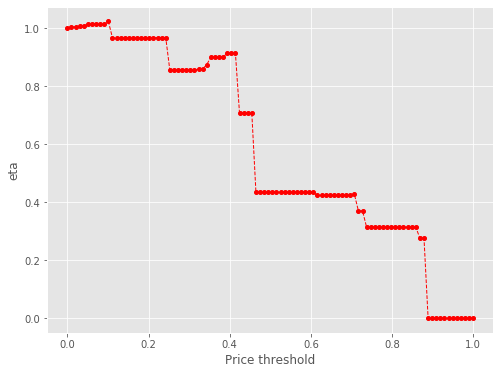

3371 25
Number of cells with price above 69.0th percentile:  25


eta =  1.0
eta =  1.004741121878126
eta =  1.004741121878126
eta =  1.0071822432946553
eta =  1.0071822432946553
eta =  1.014917433103445
eta =  1.014917433103445
eta =  1.014917433103445
eta =  1.013421141960304
eta =  1.013421141960304
eta =  1.0236886245786287
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9679864040580886
eta =  0.9679864040580886
eta =  0.9679864040580886
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8596709127658452
eta =  0.8596709127658452
eta =  0.8747812932592357
eta =  0.8999666145744615
eta =  0.8999666145744615
eta =  0.8999666145744615
eta =  0.9015929746538666
eta =  0

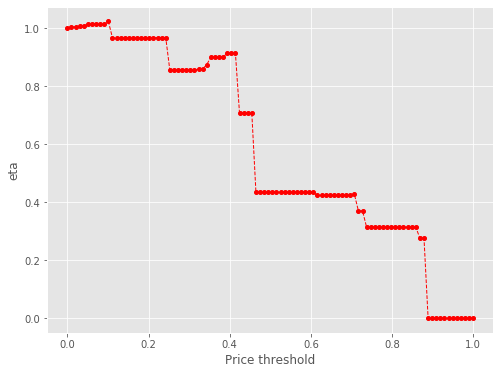

3371 25
Number of cells with price above 70.0th percentile:  25


eta =  1.0
eta =  1.004741121878126
eta =  1.004741121878126
eta =  1.0071822432946553
eta =  1.0071822432946553
eta =  1.014917433103445
eta =  1.014917433103445
eta =  1.014917433103445
eta =  1.013421141960304
eta =  1.013421141960304
eta =  1.0236886245786287
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9679864040580886
eta =  0.9679864040580886
eta =  0.9679864040580886
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8596709127658452
eta =  0.8596709127658452
eta =  0.8747812932592357
eta =  0.8999666145744615
eta =  0.8999666145744615
eta =  0.8999666145744615
eta =  0.9015929746538666
eta =  0

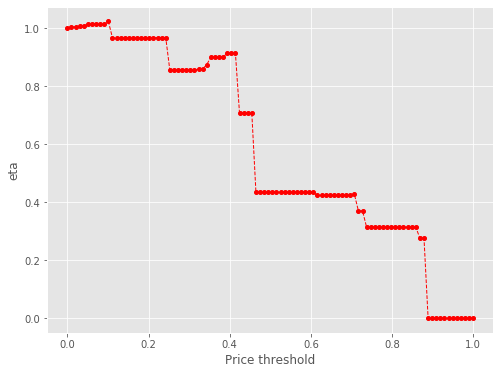

3371 25
Number of cells with price above 71.00000000000001th percentile:  25


eta =  1.0
eta =  1.004741121878126
eta =  1.004741121878126
eta =  1.0071822432946553
eta =  1.0071822432946553
eta =  1.014917433103445
eta =  1.014917433103445
eta =  1.014917433103445
eta =  1.013421141960304
eta =  1.013421141960304
eta =  1.0236886245786287
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9675376071522007
eta =  0.9679864040580886
eta =  0.9679864040580886
eta =  0.9679864040580886
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8552208916523131
eta =  0.8596709127658452
eta =  0.8596709127658452
eta =  0.8747812932592357
eta =  0.8999666145744615
eta =  0.8999666145744615
eta =  0.8999666145744615
eta =  0.9015929746538666
eta =  0

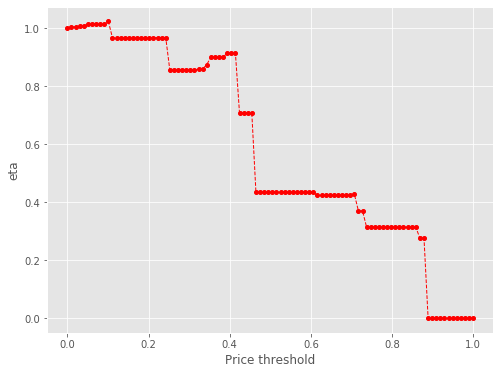

3371 24
Number of cells with price above 72.0th percentile:  24


eta =  1.0
eta =  1.0024296023755517
eta =  1.0024296023755517
eta =  1.0101282917596692
eta =  1.0101282917596692
eta =  1.0101282917596692
eta =  1.0086390612399272
eta =  1.0086390612399272
eta =  1.0188580941776175
eta =  0.9629720393484225
eta =  0.9629720393484225
eta =  0.9629720393484225
eta =  0.9629720393484225
eta =  0.9629720393484225
eta =  0.9629720393484225
eta =  0.9629720393484225
eta =  0.9629720393484225
eta =  0.9629720393484225
eta =  0.9629720393484225
eta =  0.9629720393484225
eta =  0.9634187184940405
eta =  0.9634187184940405
eta =  0.9634187184940405
eta =  0.8511853183172994
eta =  0.8511853183172994
eta =  0.8511853183172994
eta =  0.8511853183172994
eta =  0.8511853183172994
eta =  0.8511853183172994
eta =  0.8511853183172994
eta =  0.8556143408949898
eta =  0.8556143408949898
eta =  0.8556143408949898
eta =  0.8706534192847994
eta =  0.8957198973723567
eta =  0.8957198973723567
eta =  0.8957198973723567
eta =  0.8973385830656078
eta =  0.909279318790584
et

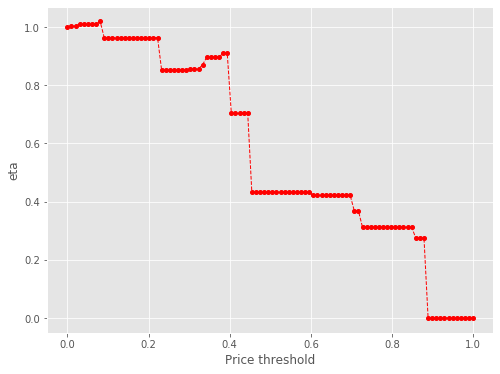

3371 21
Number of cells with price above 73.0th percentile:  21


eta =  1.0
eta =  0.9985257016045479
eta =  1.008642270976037
eta =  1.008642270976037
eta =  0.9533165709782275
eta =  0.9533165709782275
eta =  0.9533165709782275
eta =  0.9533165709782275
eta =  0.9533165709782275
eta =  0.9533165709782275
eta =  0.9533165709782275
eta =  0.9533165709782275
eta =  0.9533165709782275
eta =  0.9533165709782275
eta =  0.9533165709782275
eta =  0.9537587713890683
eta =  0.9537587713890683
eta =  0.9537587713890683
eta =  0.9537587713890683
eta =  0.8426507061142826
eta =  0.8426507061142826
eta =  0.8426507061142826
eta =  0.8426507061142826
eta =  0.8426507061142826
eta =  0.8426507061142826
eta =  0.8426507061142826
eta =  0.847035320042851
eta =  0.847035320042851
eta =  0.847035320042851
eta =  0.8619236055334111
eta =  0.8867387486118122
eta =  0.8867387486118122
eta =  0.8867387486118122
eta =  0.8883412041676618
eta =  0.9001622132636204
eta =  0.9001622132636204
eta =  0.9001622132636204
eta =  0.695706546690849
eta =  0.695706546690849
eta =  0

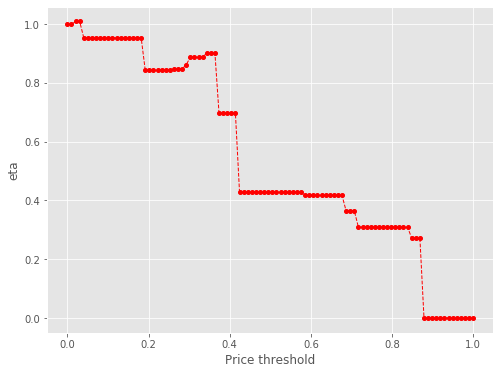

3371 20
Number of cells with price above 74.0th percentile:  20


eta =  1.0
eta =  1.0101315062348746
eta =  0.9547241192152861
eta =  0.9547241192152861
eta =  0.9547241192152861
eta =  0.9547241192152861
eta =  0.9547241192152861
eta =  0.9547241192152861
eta =  0.9547241192152861
eta =  0.9547241192152861
eta =  0.9547241192152861
eta =  0.9547241192152861
eta =  0.9547241192152861
eta =  0.9551669725240494
eta =  0.9551669725240494
eta =  0.9551669725240494
eta =  0.9551669725240494
eta =  0.8438948589507641
eta =  0.8438948589507641
eta =  0.8438948589507641
eta =  0.8438948589507641
eta =  0.8438948589507641
eta =  0.8438948589507641
eta =  0.8438948589507641
eta =  0.8482859466528859
eta =  0.8482859466528859
eta =  0.8482859466528859
eta =  0.8631962143271539
eta =  0.8880479963479125
eta =  0.8880479963479125
eta =  0.8880479963479125
eta =  0.8880479963479125
eta =  0.8896528178895858
eta =  0.9014912804118457
eta =  0.9014912804118457
eta =  0.696733740125974
eta =  0.696733740125974
eta =  0.696733740125974
eta =  0.696733740125974
eta =

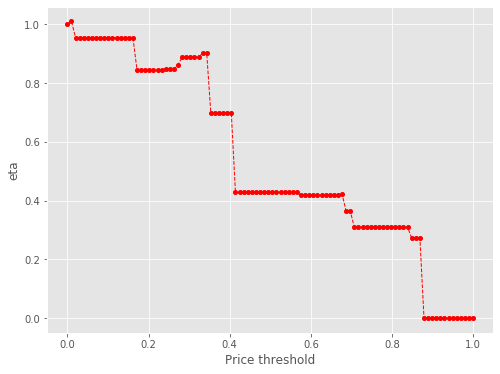

3371 18
Number of cells with price above 75.0th percentile:  18


eta =  1.0
eta =  1.000463854740705
eta =  1.000463854740705
eta =  1.000463854740705
eta =  1.000463854740705
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.88851421010513
eta =  0.88851421010513
eta =  0.88851421010513
eta =  0.88851421010513
eta =  0.9041315673858104
eta =  0.9301618954361638
eta =  0.9301618954361638
eta =  0.9301618954361638
eta =  0.9301618954361638
eta =  0.9318428224279239
eta =  0.9442427003444787
eta =  0.9442427003444787
eta =  0.9442427003444787
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.44858487169

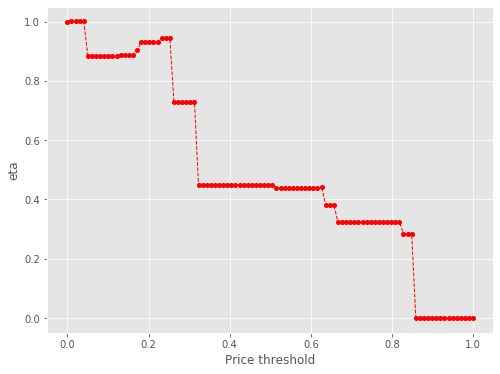

3371 18
Number of cells with price above 76.0th percentile:  18


eta =  1.0
eta =  1.000463854740705
eta =  1.000463854740705
eta =  1.000463854740705
eta =  1.000463854740705
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.88851421010513
eta =  0.88851421010513
eta =  0.88851421010513
eta =  0.88851421010513
eta =  0.9041315673858104
eta =  0.9301618954361638
eta =  0.9301618954361638
eta =  0.9301618954361638
eta =  0.9301618954361638
eta =  0.9318428224279239
eta =  0.9442427003444787
eta =  0.9442427003444787
eta =  0.9442427003444787
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.44858487169

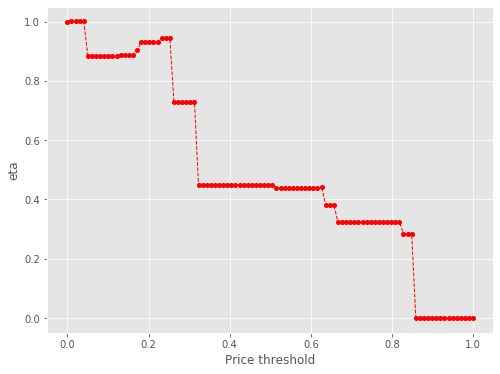

3371 18
Number of cells with price above 77.0th percentile:  18


eta =  1.0
eta =  1.000463854740705
eta =  1.000463854740705
eta =  1.000463854740705
eta =  1.000463854740705
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.8839148838560655
eta =  0.88851421010513
eta =  0.88851421010513
eta =  0.88851421010513
eta =  0.88851421010513
eta =  0.9041315673858104
eta =  0.9301618954361638
eta =  0.9301618954361638
eta =  0.9301618954361638
eta =  0.9301618954361638
eta =  0.9318428224279239
eta =  0.9442427003444787
eta =  0.9442427003444787
eta =  0.9442427003444787
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.7297749434660126
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.448584871694974
eta =  0.44858487169

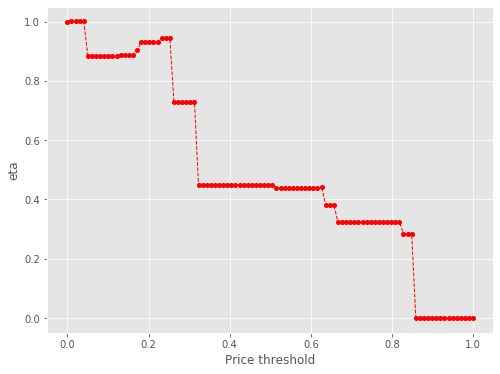

3371 16
Number of cells with price above 78.0th percentile:  16


eta =  1.0
eta =  0.8835050658428375
eta =  0.8835050658428375
eta =  0.8835050658428375
eta =  0.8835050658428375
eta =  0.8835050658428375
eta =  0.8835050658428375
eta =  0.8835050658428375
eta =  0.8835050658428375
eta =  0.8881022596617552
eta =  0.8881022596617552
eta =  0.8881022596617552
eta =  0.8881022596617552
eta =  0.9037123761159154
eta =  0.9297306354733209
eta =  0.9297306354733209
eta =  0.9297306354733209
eta =  0.9297306354733209
eta =  0.9314107831206297
eta =  0.9438049119617646
eta =  0.9438049119617646
eta =  0.9438049119617646
eta =  0.7294365908453053
eta =  0.7294365908453053
eta =  0.7294365908453053
eta =  0.7294365908453053
eta =  0.7294365908453053
eta =  0.7294365908453053
eta =  0.7294365908453053
eta =  0.4483768899489487
eta =  0.4483768899489487
eta =  0.4483768899489487
eta =  0.4483768899489487
eta =  0.4483768899489487
eta =  0.4483768899489487
eta =  0.4483768899489487
eta =  0.4483768899489487
eta =  0.4483768899489487
eta =  0.4483768899489487
e

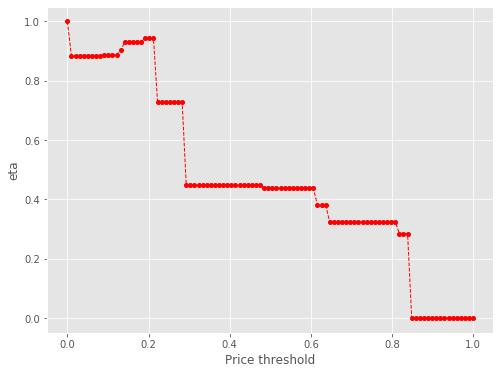

3371 15
Number of cells with price above 79.0th percentile:  15


eta =  1.0
eta =  1.0052033587544085
eta =  1.0052033587544085
eta =  1.0052033587544085
eta =  1.0052033587544085
eta =  1.0228717537163192
eta =  1.0523206616663658
eta =  1.0523206616663658
eta =  1.0523206616663658
eta =  1.0523206616663658
eta =  1.0542223458923707
eta =  1.0542223458923707
eta =  1.0682507078342587
eta =  1.0682507078342587
eta =  1.0682507078342587
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
e

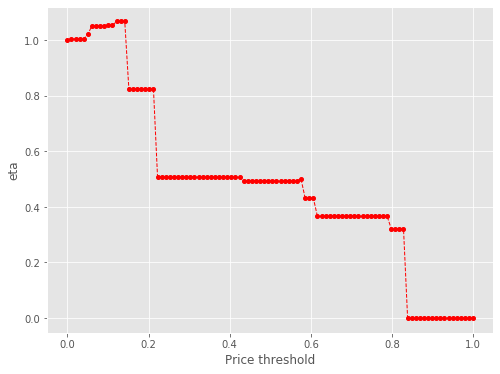

3371 15
Number of cells with price above 80.0th percentile:  15


eta =  1.0
eta =  1.0052033587544085
eta =  1.0052033587544085
eta =  1.0052033587544085
eta =  1.0052033587544085
eta =  1.0228717537163192
eta =  1.0523206616663658
eta =  1.0523206616663658
eta =  1.0523206616663658
eta =  1.0523206616663658
eta =  1.0542223458923707
eta =  1.0542223458923707
eta =  1.0682507078342587
eta =  1.0682507078342587
eta =  1.0682507078342587
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.8256167610645725
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
eta =  0.5074978144253315
e

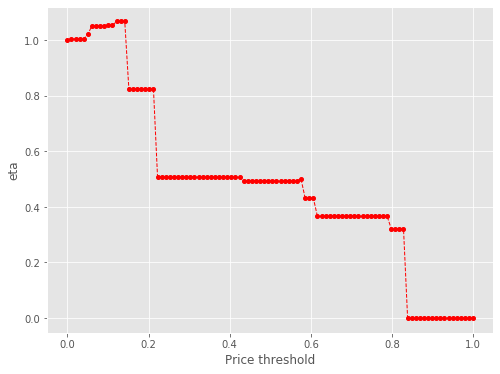

3371 14
Number of cells with price above 81.0th percentile:  14


eta =  1.0
eta =  1.017576935858834
eta =  1.04687340377607
eta =  1.04687340377607
eta =  1.04687340377607
eta =  1.04687340377607
eta =  1.04687340377607
eta =  1.0487652440782766
eta =  1.0627209892712406
eta =  1.0627209892712406
eta =  1.0627209892712406
eta =  0.8213430186779621
eta =  0.8213430186779621
eta =  0.8213430186779621
eta =  0.8213430186779621
eta =  0.8213430186779621
eta =  0.8213430186779621
eta =  0.8213430186779621
eta =  0.8213430186779621
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.5048707905773357
eta =  0.504

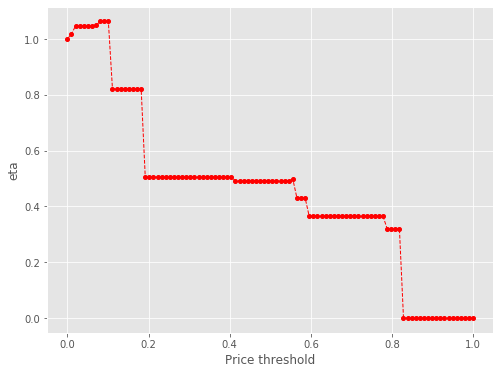

3371 12
Number of cells with price above 82.0th percentile:  12


eta =  1.0
eta =  1.0018071337903731
eta =  1.0151380151964968
eta =  1.0151380151964968
eta =  1.0151380151964968
eta =  1.0151380151964968
eta =  0.7845676618733264
eta =  0.7845676618733264
eta =  0.7845676618733264
eta =  0.7845676618733264
eta =  0.7845676618733264
eta =  0.7845676618733264
eta =  0.7845676618733264
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.48226537111007683
eta =  0.4698801238783663
eta

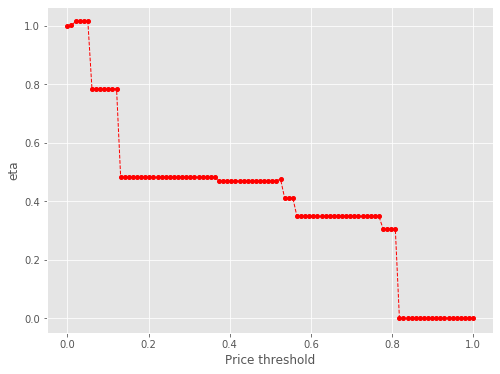

3371 10
Number of cells with price above 83.0th percentile:  10


eta =  1.0
eta =  0.7728679747270231
eta =  0.7728679747270231
eta =  0.7728679747270231
eta =  0.7728679747270231
eta =  0.7728679747270231
eta =  0.7728679747270231
eta =  0.7728679747270231
eta =  0.7728679747270231
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.4750736982465644
eta =  0.46287314320251643
eta =  0.46287314320251643
eta =  0.46287314320251643
eta =  0.46287314320251643
eta =  0.46287314320251

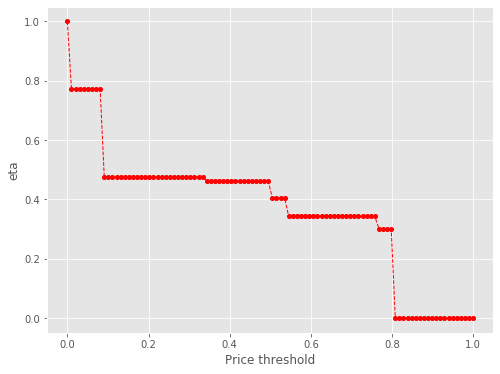

3371 9
Number of cells with price above 84.00000000000001th percentile:  9


eta =  1.0
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.6146893308839203
eta =  0.5989032517047989
eta =  0.5989032517047989
eta =  0.5989032517047989
eta =  0.5989032517047989
eta =  0.5989032517047989
eta =  0.5989032517047989
eta =  0.5989032517047989
eta =  0.5989032517047989
eta =  0.5989032517047989
eta =  0.5989032517047989
eta =  0.5989032517047989
e

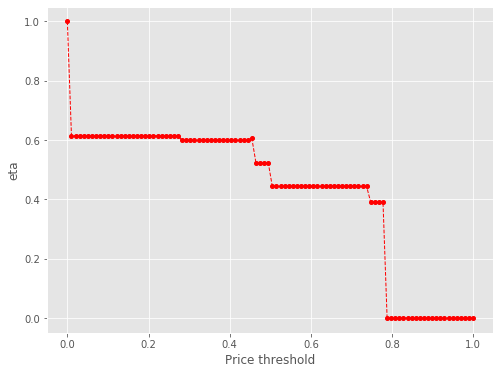

3371 8
Number of cells with price above 85.0th percentile:  8


eta =  1.0
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9858791742525271
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
e

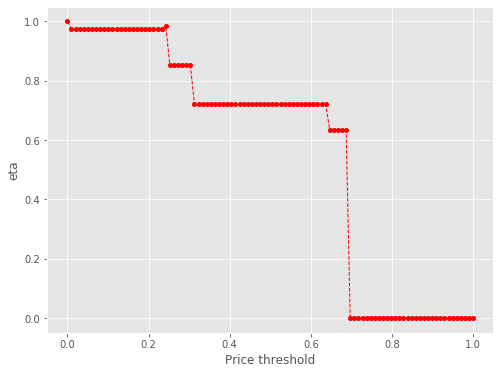

3371 8
Number of cells with price above 86.0th percentile:  8


eta =  1.0
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9858791742525271
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
e

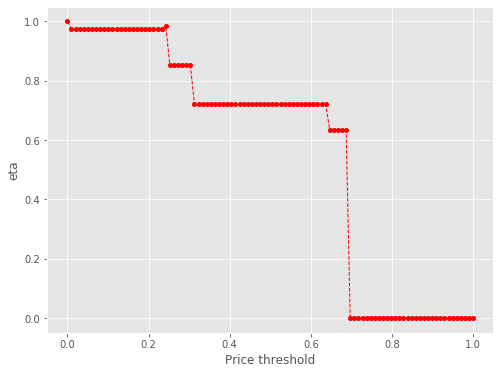

3371 8
Number of cells with price above 87.0th percentile:  8


eta =  1.0
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9858791742525271
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
e

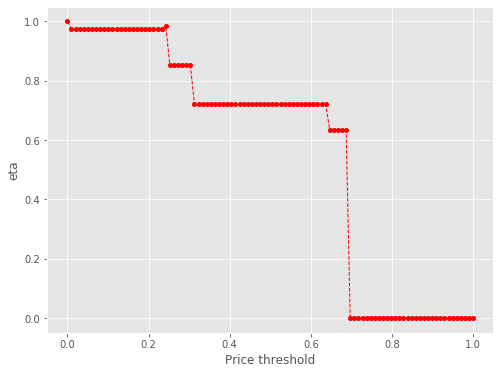

3371 8
Number of cells with price above 88.0th percentile:  8


eta =  1.0
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9743186055361964
eta =  0.9858791742525271
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.8522289256859115
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
eta =  0.7218592217334994
e

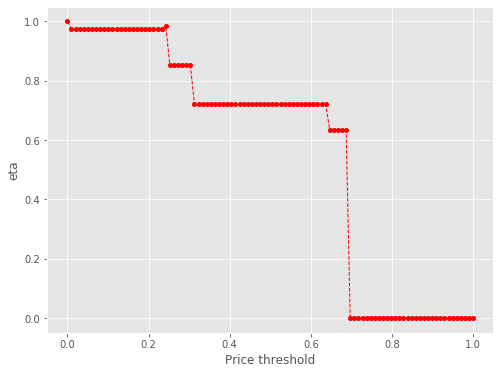

3371 7
Number of cells with price above 89.0th percentile:  7


eta =  1.0
eta =  1.0118652858014228
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0

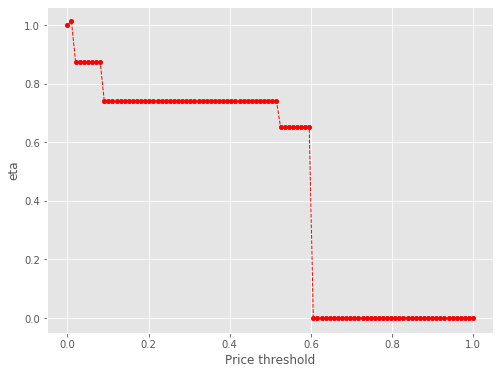

3371 7
Number of cells with price above 90.0th percentile:  7


eta =  1.0
eta =  1.0118652858014228
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0

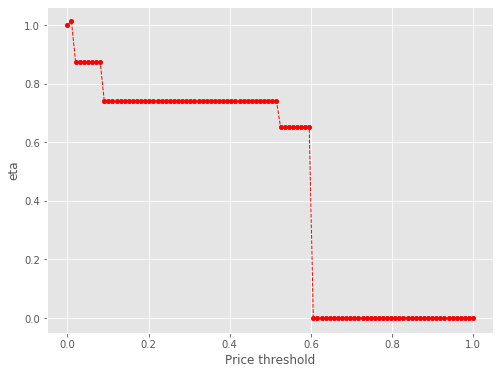

3371 7
Number of cells with price above 91.0th percentile:  7


eta =  1.0
eta =  1.0118652858014228
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.874692242192075
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0.7408862128176633
eta =  0

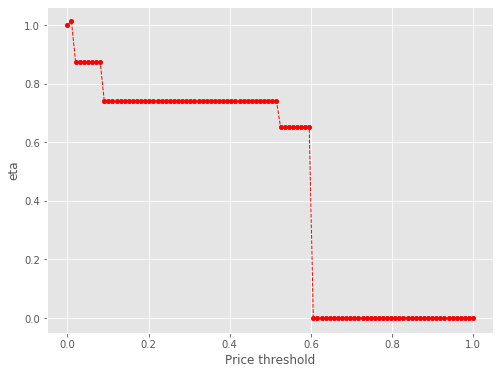

3371 4
Number of cells with price above 92.0th percentile:  4


eta =  1.0
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =  0.84702501872078
eta =

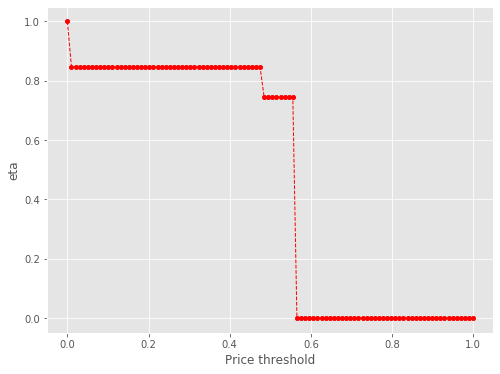

3371 3
Number of cells with price above 93.0th percentile:  3


eta =  1.0
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  na

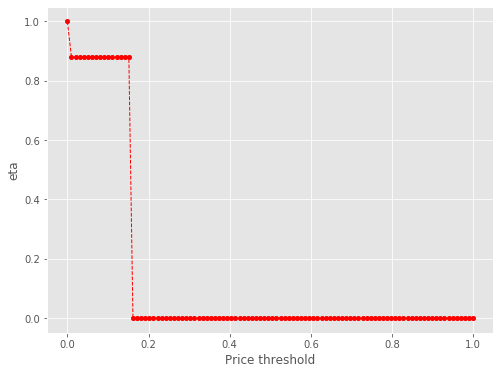

3371 3
Number of cells with price above 94.0th percentile:  3


eta =  1.0
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  na

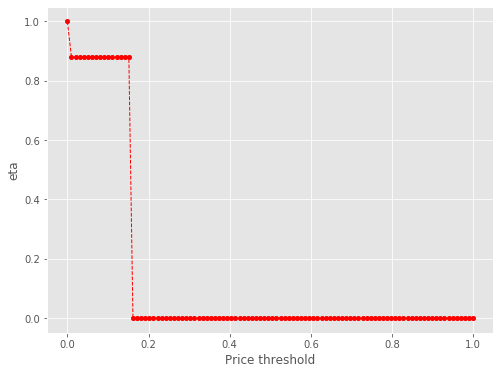

3371 3
Number of cells with price above 95.0th percentile:  3


eta =  1.0
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  0.879743749705217
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  na

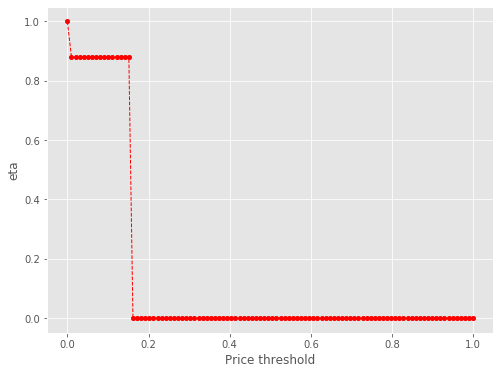

3371 2
Number of cells with price above 96.00000000000001th percentile:  2


eta =  1.0
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

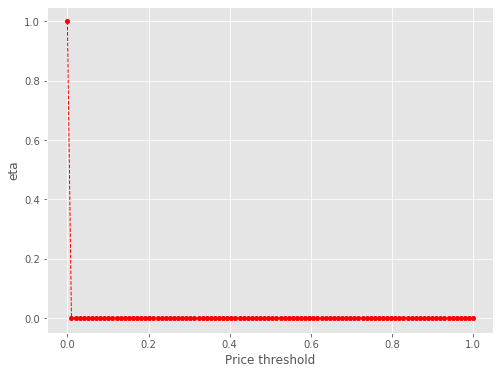

3371 1
Number of cells with price above 97.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning:

invalid value encountered in true_divide



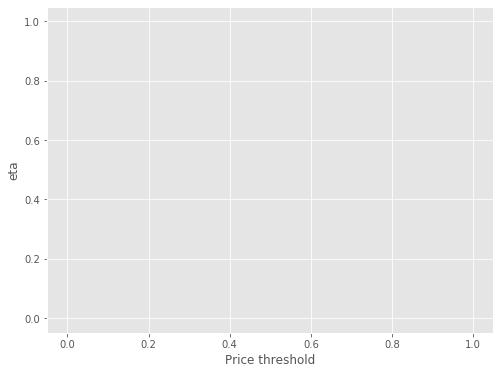

3371 1
Number of cells with price above 98.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

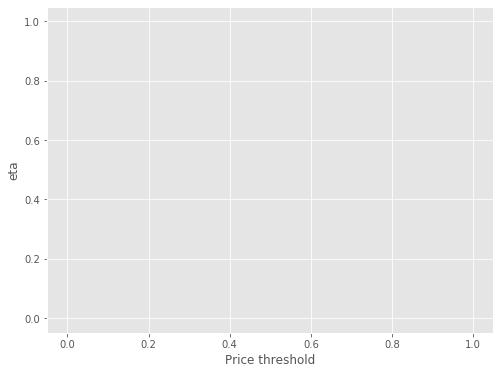

3371 1
Number of cells with price above 99.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

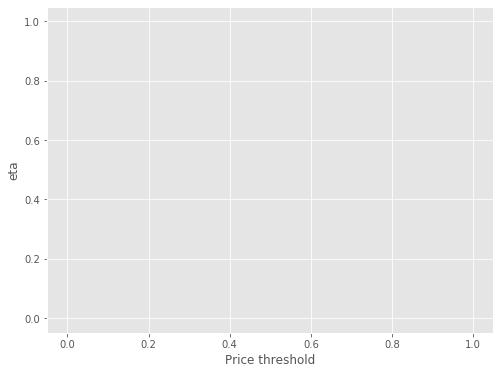

3371 1
Number of cells with price above 100.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

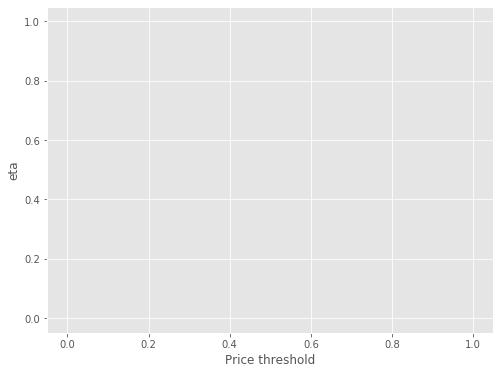


time: 1min 9s


In [31]:
lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
#keys = np.array(keys)
keys_initial = np.array(keys)


perc_vals = np.linspace(0.01, 1, 100)
etas_2d = []
for i in tqdm_notebook(perc_vals):
    keys = keys_initial
    vals_cut = vals[vals>=i*vals.max()]
    print(len(vals), len(vals_cut))

    L = np.cumsum(vals_cut)/np.sum(vals_cut)
    keys = keys[vals>=i*vals.max()]
    print('Number of cells with price above {}th percentile: '.format(i*100), len(keys))
    etas = []
    lval = np.linspace(min(vals_cut), max(vals_cut), 100)
    for k in tqdm_notebook(lval):
        loubar_keys = keys[vals_cut>=k]
        dist_mat = mat[keys.reshape(-1,1), keys]

        total_dist = dist_mat.sum()
        dist_corr = dist_mat[dist_mat>0]

        loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

        loubar_dist = loubar_dist_mat.sum()

        loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
        eta = loubar_dist_corr.mean()/dist_corr.mean()
        etas.append(eta)
        print('eta = ', eta)
    etas_array = np.array(etas)
    etas_array = np.where(np.isnan(etas_array), 0, etas_array)
    lval = (lval - lval.min())/(lval - lval.min()).max()
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.plot(lval, etas_array, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
    plt.xlabel("Price threshold")
    plt.ylabel("eta")
    plt.show()
    etas_2d.append(etas)
etas_2d = np.array(etas_2d)
etas_2d = np.where(np.isnan(etas_2d), 0, etas_2d)
lval = lval/lval.max()

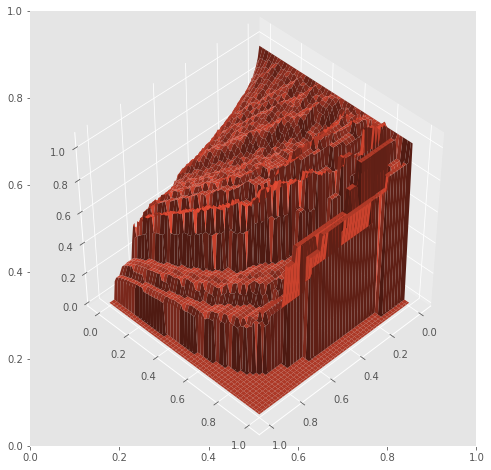

time: 1.24 s


In [32]:
X,Y = np.meshgrid(np.linspace(0,1, 100),np.linspace(0,1, 100))
etas_surface = etas_2d
fig, ax = plt.subplots(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
# Plot a 3D surface
ax.plot_surface(X, Y, etas_surface)
ax.view_init(45, 45)
plt.show()

In [33]:
pickle_in = open("etas_surface_dict.pickle","rb")
etas_surface_dict = pickle.load(pickle_in)
#etas_surface_dict = {}
etas_surface_dict['Budapest'] = etas_surface


pickle_out = open("etas_surface_dict.pickle","wb")
pickle.dump(etas_surface_dict, pickle_out)
pickle_out.close()

etas_surface_dict

{'NY': array([[1.        , 0.40697941, 0.38848337, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.95418349, 0.92471336, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.96911482, 0.94572765, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [1.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]]),
 'Boston': array([[1.        , 0.94621367, 0.92299712, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.97340556, 0.95206791, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.96708982, 0.94781127, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.       

time: 19 ms


3371 171
Number of cells with price above 5th percentile:  171
total number of cells:  3371
number of cells within urban airbnb territory:  171



Mean travel times in minutes:  11.289535842293906
Mean travel times in minutes:  20.99549616424574


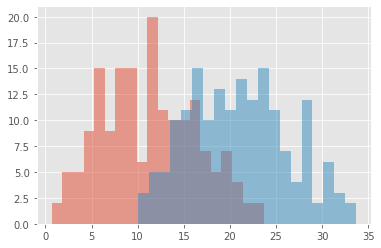

time: 1min 20s


In [34]:
from tqdm import tqdm_notebook

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)

vals_cut = vals[vals>0.06*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.06*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))

print('total number of cells: ', len(polylist))

times_names = ['times_{}'.format(c) for c in range(1, len(centers)+1)]
times_dict = {name:[] for name in times_names}

plist = poly_prices[poly_prices.index.isin(keys)].geometry.tolist()
print('number of cells within urban airbnb territory: ', len(plist))
for poly in tqdm_notebook(plist):
    origin = ox.get_nearest_node(G, poly.centroid.coords[0][::-1])
    dists_to_centers = []
    for node, target in centers.items():
        try:
            if origin!=target:
                path = nx.shortest_path(G, origin, target, weight='length')
                edges = [ tuple( path[i:i+2] ) for i in range( len(path) - 1 ) ]
                dist = np.sum([G.get_edge_data(*edge)[0]['length'] for edge in edges])
                dists_to_centers.append(dist)
        except:
            pass
    if len(dists_to_centers) != 0:
        dists_to_centers = sorted(dists_to_centers)
        #print('distance list length equal to # of centers: ', len(dists_to_centers)==len(centers))
        if len(dists_to_centers)==len(centers):
            for n, dist in enumerate(dists_to_centers):
                time = (dist/3.1)/60
                times_dict['times_{}'.format(n+1)].append(time)
                #print(times_dict['times_{}'.format(n+1)][-1])
        else:
            print('Distance list length NOT equal to # of centers')

#print(distances_dict)
for center in range(1, len(centers)+1):
    print("Mean travel times in minutes: ", np.mean(times_dict['times_{}'.format(center)]))
for center in range(1, len(centers)+1):
    plt.hist(times_dict['times_{}'.format(center)], bins=20, alpha=0.5)
plt.show()

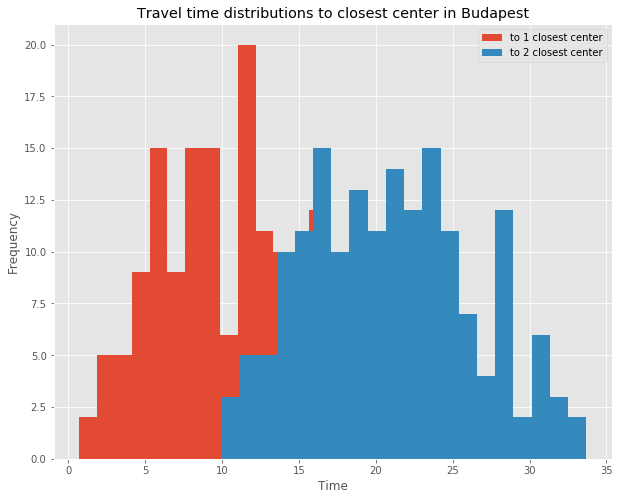

time: 379 ms


In [35]:
for center in range(1, len(centers)+1):
    times_dict['times_{}'.format(center)] = np.array(times_dict['times_{}'.format(center)])

fig, ax = plt.subplots(figsize=(10,8))
for center in range(1, len(centers)+1):
    plt.hist(times_dict['times_{}'.format(center)], bins=20, alpha=1, label='to {} closest center'.format(center))
plt.title('Travel time distributions to closest center in Budapest')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [36]:
pickle_in = open("City_Accessibility.pickle","rb")
access_dict = pickle.load(pickle_in)
#access_dict = {}
access_dict['Budapest'] = times_dict


pickle_out = open("City_Accessibility.pickle","wb")
pickle.dump(access_dict, pickle_out)
pickle_out.close()

access_dict

{'Paris': {'times_1': array([ 4.73219737,  4.40047807,  7.81577632,  7.07926754,  6.7129386 ,
          7.48037281, 10.85755263,  8.41227193, 14.20045614, 15.15502193,
         16.00692982, 15.80582895, 14.35941228, 14.10681579, 12.26687281,
         13.89203947, 14.31310965, 15.99389474, 16.77728947, 17.82112281,
         20.19769737, 20.40849561, 21.93033333, 22.03087719, 20.6584386 ,
         20.62538596, 19.53197368, 20.61141228, 21.70609211, 23.22407018,
         21.70395614, 23.12607456, 22.79396053, 23.95434211, 21.49400439,
         21.55605702, 22.35374123, 22.36948246, 22.44162719, 21.54410965,
         21.93589912, 21.86757456, 21.86757456, 21.41060088, 21.92571491,
         22.93862281, 23.57200877, 25.13889474, 24.49192982, 26.04400877,
         26.815     , 38.90660088, 38.56507018, 37.89241228, 36.57546491,
         29.87379386, 27.54254825, 25.54755702, 26.98263158, 25.76562281,
         25.03485526, 25.37799123, 25.69687719, 26.07382018, 23.81846491,
         24.034649

time: 705 ms


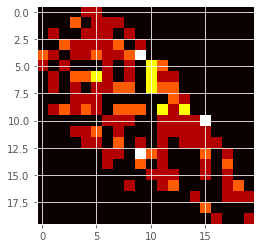

time: 239 ms


In [37]:
x = times_dict['times_{}'.format(1)]
y = times_dict['times_{}'.format(2)]
c_xy = np.histogram2d(x, y, 20)[0]
c_xx = np.histogram2d(x, x, 20)[0]
plt.imshow(c_xy, cmap='hot', interpolation='nearest')
plt.show()

In [38]:
from sklearn.metrics import mutual_info_score

def calc_MI(x, y, bins):
    c_xy = np.histogram2d(x, y, bins)[0]
    mi = mutual_info_score(None, None, contingency=c_xy)
    return mi

mi_list = []
for center in range(1, len(centers)+1):
    mi_list.append(times_dict['times_{}'.format(center)])

mis = []
for pair in combinations_with_replacement(mi_list, 2):
    MI = calc_MI(pair[0], pair[1], 20)
    print(MI)
    mis.append(MI)
mis = np.array(mis)
avg_mi = np.mean(mis)
print('average mutual information = ', avg_mi)

2.82930504955913
0.9784184589578319
2.8508541843760895
average mutual information =  2.219525897631017
time: 15 ms


In [39]:
pickle_in = open("Time_distribution_mutual_information.pickle","rb")
MI_dict = pickle.load(pickle_in)
#MI_dict = {}
MI_dict['Budapest'] = avg_mi


pickle_out = open("Time_distribution_mutual_information.pickle","wb")
pickle.dump(MI_dict, pickle_out)
pickle_out.close()

MI_dict

{'Beijing': 1.629373608642793,
 'Florence': 2.0836399429599792,
 'Palermo': 1.8596013030930105,
 'Los_Angeles': 1.5602500680599918,
 'Moscow': 1.5631970905638934,
 'Porto': 1.6277816420571996,
 'Prague': 2.176480497902222,
 'Reykjavik': 1.3730161847793374,
 'Riga': 2.240374487910287,
 'Rome': 1.6095563575725969,
 'Seoul': 1.2910685865906735,
 'Siena': 2.7660068415344448,
 'Sydney': 1.2791891753795948,
 'Tallin': 2.3884073435187867,
 'Treviso': 2.631909071373147,
 'Valencia': 2.1872520197930965,
 'Venezia': 2.719891808939249,
 'Verona': 2.7080241467515376,
 'Vicenza': 2.6192607829416756,
 'Vienna': 1.4481542925032476,
 'Wellington': 2.1855226822614866,
 'Zurich': 2.462051055806955,
 'Aarhus': 2.2910468431831847,
 'Milan': 1.6107461389394335,
 'Busan': 1.903641833377143,
 'Barcelona': 1.6449937230537024,
 'Bologna': 2.7317991260148045,
 'Bremen': 1.9957279038792954,
 'Brno': 2.4300669174144036,
 'Budapest': 2.219525897631017,
 'Dublin': 1.830502368836079,
 'Boston': 1.1451275682586615,
 

time: 8 ms
